In this iPython notebook, we will featurize MOR ligand binding simulation by pairwise distances between the ligand and different receptor residues. We will then perform tICA and prospectively build an MSM. 

In [1]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

# changing matplotlib the default style
matplotlib.style.use('ggplot')
#matplotlib.rcParams["figure.facecolor"] = "white"
#matplotlib.rcParams["savefig.transparent"] = "True"


In [2]:
import pandas as pd


from PDB_Order_Fixer import PDB_Order_Fixer
import mdtraj as md
import os
import numpy as np
import h5py

import datetime
import glob
import copy
from functools import partial 
import operator
import time

import random 
import subprocess
from subprocess import Popen
import sys
from custom_clusterer import *
from custom_tica import *
from custom_featurizer import *
from pdb_editing import *
from analysis import *
from io_functions import *
#from topology_fixing import *
from subsampling import *
from conversions import *
from custom_msm import *
from grids import *
from docking_analysis import *

from scipy import stats
import os
from efficacy_scripts import *




/home/enf/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [3]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
from sklearn.preprocessing import scale

In [5]:
from detect_intermediates import *
from interpret_tICs import *

In [6]:
from msmbuilder.utils import verbosedump, verboseload


In [7]:
from b2ar_feature_types import *
#from b2ar_feature_types import *
from get_variable_names import *
from b2ar_tica_config import *
from residue import Residue, Atom

In [8]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.preprocessing import scale
from random import shuffle
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc

In [9]:

ori_feature_name = copy.deepcopy(feature_name)

In [10]:
#schemes = ["closest-heavy", "CA"]
#feature_name = "%s-CA" %ori_feature_name

In [11]:
rho = 0.01
rho_string = "_rho0pt01"
n_clusters = 25
n_samples = 1
lag_time=5
precision = "XP"

In [12]:
(active_ref_dir, inactive_ref_dir, simulation_ref_dir, scripts_dir,
          ligand_dir, agonist_dir, inverse_agonist_dir, biased_agonist_dir, ref_receptors_dir, whole_trajectory_pnas,
          sasa_file) = get_base_files(base)

tica_dir = get_tica_dir(base, is_sparse, lag_time, n_components, feature_name, 
                                 wolf_string, shrinkage_string, rho_string)
ori_tica_dir = copy.deepcopy(tica_dir)
features_dir = get_features_dir(base, feature_name)

landmarks_dir = get_landmarks_dir(tica_dir)
analysis_dir = get_analysis_dir(tica_dir, n_clusters, sampling_method)
gmm_dir = get_gmm_dir(tica_dir)
rf_dirdir = get_rf_dir(tica_dir)


ref_tica_dir, ref_tica_coords = get_ref_tica_dirs(tica_dir)

graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)

pnas_titles =  ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]
pnas_features_dir = analysis_dir


(clusterer_dir, msm_model_dir, macrostate_dir, features_known, model_dir, projected_features_dir,
         projection_operator_dir, ktica_fit_model_filename, ktica_projected_data_filename, nystroem_data_filename,
         mutual_information_csv, pearson_csv) = get_tica_files(base, tica_dir, n_clusters, msm_lag_time, n_macrostates)

(standardized_features_dir, feature_residues_csv, feature_residues_pkl,
          contact_csv, ref_features_dir) = get_feature_files(features_dir)

(kmeans_csv, tica_coords_csv, features_csv, active_rmsd_dir, inactive_rmsd_dir, active_pnas_dir, inactive_pnas_joined, active_pnas_joined,
        clusters_map_file, ktica_clusters_map_file, analysis_file, combined_file, docking_summary, docking_joined, docking_z_scores_csv,
        aggregate_docking, aggregate_docking_joined, docking_pnas_joined, aggregate_docking_pnas, aggregate_docking_pnas_joined, docking_multiple_ligands,
        docking_distances_file, docking_pdf, mmgbsa_docking_distances, pnas_coords, mmgbsa_dir, mmgbsa_csv, mmgbsa_pdf, aggregate_mmgbsa,
        aggregate_mmgbsa_joined, aggregate_mmgbsa_pnas_joined, mmgbsa_z_scores_csv, active_clusters_csv, intermediate_clusters_csv,
        inactive_clusters_csv, pnas_clusters_averages, tica_clusters_averages, tica_classes_csv, tica_samples_csv, subgraph_save_base,
        degree_save_base, degree_map_csv, degree_z_map_csv, aggregate_docking_pnas_degree_z_joined, tic_residue_csv, feature_coefs_csv,
        duplicated_feature_coefs_csv) = get_analysis_files(analysis_dir, n_clusters, tica_dir, tica_dir, sampling_method, n_samples, precision,
                                                           msm_lag_time)

(inactive_pnas_distances_dir, active_pnas_distances_dir, active_pnas_all_distances_dir,
          inactive_pnas_distances_new_csv, active_pnas_distances_new_csv, active_pnas_joined, active_pnas_means, pnas_coords_dir,
          pnas_coords_csv, pnas_all_coords_csv, pnas_coords_hexbin_dir, pnas_coords_co_crystallized_docking_dir,
          pnas_coords_active_colors_dir, user_defined_features_file, reaction_coordinates_trajs_file) = get_pnas_files(whole_trajectory_pnas, pnas_features_dir)

features_dir = get_features_dir(base, feature_name)



graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)
(scripts_dir, pymol_fixpdb_dir) = get_script_dir(scripts_dir)
(save_dir, reimaged_dir, mae_dir, combined_reimaged_dir, grid_dir, docking_dir) = get_docking_dirs(tica_dir, n_clusters, n_components, n_samples, sampling_method, precision)


/home/enf/b2ar_analysis/featuresall_residues_2rh1_3sn6_under_cutoff6A
/home/enf/b2ar_analysis/featuresall_residues_2rh1_3sn6_under_cutoff6A


In [13]:
print(inactive_ref_dir)
print(inactive_dir)

/home/enf/b2ar_analysis/2RH1_prepped.pdb
/home/enf/b2ar_analysis/2RH1_prepped.pdb


In [14]:
ref_receptors_dir

'/home/enf/b2ar_analysis/reference_receptors'

In [16]:
#contact_residues = find_common_residues(get_trajectory_files(ref_receptors_dir, ".pdb"), "test.pkl")
contact_residues = convert_list_to_resobject_list([("A", r) for r in all_residues if r < 228] + [("C", r) for r in all_residues if r >= 265])

featurize_contacts_custom(ref_receptors_dir, features_dir = ref_features_dir, traj_ext = ".pdb", contact_residue_pairs_file = feature_residues_pkl, structures=[inactive_dir, active_dir], contact_residues=contact_residues,
                          residues_map = None, contact_cutoff = cutoff, parallel = False, exacycle = exacycle, traj_top_structure = None, iterative=False,
                          user_specified_atom_residue_pairs = [], load_from_file=False, worker_pool=None, schemes=["closest"], within_turn=True, binarize=None, redo=True)

structure
/home/enf/b2ar_analysis/2RH1_prepped.pdb
structure
None
mdraj_index_combinations[0:10]
[(1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11)]
contact_features[0:10]
[[ASP29, GLU30], [ASP29, VAL31], [ASP29, TRP32], [ASP29, VAL33], [ASP29, VAL34], [ASP29, GLY35], [ASP29, MET36], [ASP29, GLY37], [ASP29, ILE38], [ASP29, VAL39]]
About to compute 37401 features


ERROR: Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/enf/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2885, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-16-37421ba8e32c>", line 6, in <module>
    user_specified_atom_residue_pairs = [], load_from_file=False, worker_pool=None, schemes=["closest"], within_turn=True, binarize=None, redo=True)
  File "/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/custom_featurizer.py", line 835, in featurize_contacts_custom
    structure_contact_residue_pairs = compute_contacts_below_cutoff([structure,0], cutoff = contact_cutoff, contact_residues = contact_residues, anton = False, structure = traj_top_structure, within_turn=within_turn)
  File "/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/custom_featurizer.py", line 653, in compute_contacts_below_cutoff
    distances = md.compute_contacts(frame, contacts = mdtraj_index_combinations, scheme = 'closest-heavy', ignore


Unfortunately, your original traceback can not be constructed.



KeyboardInterrupt: 

In [243]:
from ipyparallel import Client
rc = Client()
print(len(rc.ids))
dview = rc[:]
dview.map(os.chdir, ['/home/enf/b2ar_analysis/conformation']*len(rc.ids))

225


<AsyncMapResult: chdir>

In [16]:
tica_object = compat_verboseload(projection_operator_dir)
print(tica_object.timescales_)
print(tica_object.n_features)

[ 729.62933227  289.65120394]
2278


In [ ]:
import custom_tica
reload(custom_tica)
from custom_tica import *
if not os.path.exists(ref_features_dir):
    os.makedirs(ref_features_dir)
#fit_normalizer(features_dir, features=None)
transform(existing_model = projection_operator_dir, features_directory = ref_features_dir, tica_dir = ref_tica_dir, normalizer=verboseload("%s/normalizer.h5" %features_dir))

In [17]:
ref_tica = pd.read_csv("%s/refcoords.csv" %ref_tica_dir, index_col=None, header=None)
ref_tica



,0,1
0,-0.040561,-2.335288
1,-0.056710,-2.397060


In [18]:
tica_object.n_features

2278

In [19]:
ref_features_dir

'/home/enf/b2ar_analysis/featuresall_residues_2rh1_3sn6_under_cutoff6A/reference_receptors'

In [20]:
tic_components_dir = tica_dir
important_contact_features = interpret_tIC_components(projection_operator_dir, tic_components_dir, feature_residues_pkl, n_tica_components=5, percentile=95)

Interpreting tIC 1
feature_importances_df.shape
(6, 5)
residue_importances_df.shape
(11, 2)
       feature_name   res_i   res_j  importance           feature
3  Cys190 To Phe194  Cys190  Phe194    0.278917  CYS190 to PHE194
5   Val114 To Val86  Val114   Val86   -0.216950   VAL114 to VAL86
0    Ala57 To Glu62   Ala57   Glu62    0.209493    ALA57 to GLU62
4  Ser207 To Tyr209  Ser207  Tyr209    0.195303  SER207 to TYR209
2  Asn183 To His178  Asn183  His178   -0.172376  ASN183 to HIS178
1    Ala57 To Ile55   Ala57   Ile55   -0.163539    ALA57 to ILE55
Using dark_background
       residue  importance
Phe194  Phe194    0.278917
Cys190  Cys190    0.278917
Val86    Val86   -0.216950
Val114  Val114   -0.216950
Glu62    Glu62    0.209493
Tyr209  Tyr209    0.195303
Ser207  Ser207    0.195303
Ala57    Ala57    0.190841
His178  His178   -0.172376
Asn183  Asn183   -0.172376
Ile55    Ile55   -0.163539
Using dark_background
Interpreting tIC 2
feature_importances_df.shape
(7, 5)
residue_importances_df.

In [21]:
feature_names = compat_verboseload(feature_residues_pkl)

In [22]:
tic_subsampled_features_file = "%s/features_subsampled.pkl" % tica_dir
subsampled_features_dir = os.path.join(tica_dir, "subsampled_features")
if not os.path.exists(subsampled_features_dir): os.makedirs(subsampled_features_dir)
#important_contact_features_pruned, important_contact_features_indices = find_non_zero_features(important_contact_features[0], feature_names)
#subsample_features(features_dir, important_contact_features_indices, important_contact_features_pruned, tic_subsampled_features_file)

In [23]:
tica_coords = compat_verboseload(projected_features_dir)
pnas_coords = compat_verboseload(pnas_coords_dir)
for pnas_coord in pnas_coords: pnas_coord[:,0]*=7.14
tica_names = ["tIC.%d" %i for i in range(1,n_components+1)]
pnas_names = ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]

In [24]:
from imp import reload
import b2ar_feature_types
reload(b2ar_feature_types)
from b2ar_feature_types import *

top_features = load_file(tic_subsampled_features_file)
top_features = [t*10. for t in top_features]

user_defined_coords = compat_verboseload(user_defined_features_file)
user_defined_names = sorted(feature_name_residues_dict.keys())
user_defined_dfs = [pd.DataFrame(t, columns=user_defined_names) for t in user_defined_coords]

tica_dfs = [pd.DataFrame(t, columns=["tIC.%d" %i for i in range(1,n_components+1)]) for t in tica_coords]

all_feature_dfs = [pd.concat([top_features[i], user_defined_dfs[i], tica_dfs[i]], axis=1) for i in range(0, len(top_features))]


loading /home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/features_subsampled.pkl


In [25]:
import plots
reload(plots)
from plots import *
#plot_histograms(projected_features_dir, analysis_dir, "tICA histogram", titles=["tIC.%d" %i for i in range(1,n_components+1)])

In [26]:
lag_time = 25
msm_model_dir = "%s/msm_lag_time%d.h5" % (tica_dir, lag_time)
#build_msm(clusterer_tICs_1_2_3_filename, lag_time=lag_time, msm_model_dir=msm_model_dir)
msm_object = compat_verboseload(msm_model_dir)
prior_counts = 0.

In [27]:

#compute_aggregate_scores(docking_multiple_ligands, inverse_agonists = inverse_ligands, summary = aggregate_docking, z_scores_csv = docking_z_scores_csv)
#aggregate_docking_joined_map = convert_csv_to_joined_map(aggregate_docking, aggregate_docking_joined)[0]
#aggregate_docking_means = calc_mean(aggregate_docking_joined_map)
#write_map_to_csv(aggregate_docking_joined, aggregate_docking_means, ["cluster", "mean_aggregate_docking_z_score"])
#r['do.analysis'](tica_dir, analysis_dir, pnas_coords_csv, tica_coords_csv, features_dir, docking_multiple_ligands)
#tics_vs_docking_file = "%s/tICA_vs_docking_carazolol.pdf" % analysis_dir
#plot_tICs_vs_docking(docking_multiple_ligands, tica_coords_csv, tics_vs_docking_file, chosen_ligand="s-carazolol")


In [28]:
projection_operator_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/phi_psi_chi2_allprot_tica_coords.h5'

In [29]:
alt_pp_tica_dir = "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components25all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01"
alt_projection_operator_dir = "%s/phi_psi_chi2_allprot_tica_coords.h5" %alt_pp_tica_dir
tic_subsampled_features_file = "%s/features_subsampled.pkl" % alt_pp_tica_dir

alt_important_contact_features = interpret_tIC_components(alt_projection_operator_dir, alt_pp_tica_dir, feature_residues_pkl, n_tica_components=10, percentile=95)

subsampled_features_dir = os.path.join(alt_pp_tica_dir, "subsampled_features")
if not os.path.exists(subsampled_features_dir): os.makedirs(subsampled_features_dir)
alt_important_contact_features_pruned, alt_important_contact_features_indices = find_non_zero_features(alt_important_contact_features[0], feature_names)
if not os.path.exists(tic_subsampled_features_file):
    subsample_features(features_dir, alt_important_contact_features_indices, alt_important_contact_features_pruned, tic_subsampled_features_file)

Interpreting tIC 1
feature_importances_df.shape
(5, 5)
residue_importances_df.shape
(10, 2)
       feature_name   res_i   res_j  importance           feature
0  Arg333 To Ser329  Arg333  Ser329   -1.180972  ARG333 to SER329
1  Asn183 To His178  Asn183  His178    1.069516  ASN183 to HIS178
3  Pro330 To Tyr326  Pro330  Tyr326    0.763328  PRO330 to TYR326
4  Thr281 To Thr283  Thr281  Thr283   -0.662528  THR281 to THR283
2  Cys116 To Trp158  Cys116  Trp158    0.654189  CYS116 to TRP158
Using dark_background
       residue  importance
Ser329  Ser329   -1.180972
Arg333  Arg333   -1.180972
His178  His178    1.069516
Asn183  Asn183    1.069516
Tyr326  Tyr326    0.763328
Pro330  Pro330    0.763328
Thr283  Thr283   -0.662528
Thr281  Thr281   -0.662528
Trp158  Trp158    0.654189
Cys116  Cys116    0.654189
Using dark_background
Interpreting tIC 2
feature_importances_df.shape
(10, 5)
residue_importances_df.shape
(16, 2)
       feature_name   res_i   res_j  importance           feature
7  Thr123 To

In [30]:
import custom_clusterer
reload(custom_clusterer)
from custom_clusterer import *
feature_name = "Asn148-Leu266_ca_dist"
find_snapshots_within_feature_range(all_feature_dfs, feature_name, [31., 32.], 
                                    get_trajectory_files(traj_dir, traj_ext), analysis_dir,
                                    "%s_31_32" %feature_name, 5, lig_name="BIA", 
                                    structure=None)

(0, 385)
/home/enf/b2ar_analysis/subsampled_reimaged_amber/A-00.h5
385
(0, 432)
/home/enf/b2ar_analysis/subsampled_reimaged_amber/A-00.h5
432
(0, 438)
/home/enf/b2ar_analysis/subsampled_reimaged_amber/A-00.h5
438
(0, 439)
/home/enf/b2ar_analysis/subsampled_reimaged_amber/A-00.h5
439
(0, 449)
/home/enf/b2ar_analysis/subsampled_reimaged_amber/A-00.h5
449
(0, 457)


In [30]:
cluster_features_averages.loc[(cluster_features_averages["Asn148-Leu266_ca_dist"] > 35.) & (cluster_features_averages["Asn148-Leu266_ca_dist"] < 40.)]["Asn148-Leu266_ca_dist"]

NameError: name 'cluster_features_averages' is not defined

In [31]:
all_features_onehot, names_onehot, all_features_onehot_dfs = multi_onehot_trajectories([t.values for t in all_feature_dfs], all_feature_dfs[0].columns.values.tolist(), subsample=100)
all_features_onehot = [pd.DataFrame(t, columns=names_onehot) for t in all_features_onehot]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32


In [32]:
[n for n in top_features[0].columns.values.tolist() if "TYR326" in n]

['ASP79 to TYR326']

In [33]:
from imp import reload
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

clusterer, cluster_averages, active_clusters, inactive_clusters, biased_ligands, agonist_ligands, inverse_ligands, all_ligands, c, feature_residues, tica_coords, user_defined_coords, pp_n_components, apriori_dfs, tica_dfs, cluster_pnas_averages, cluster_tica_averages, cluster_tica_pnas, top_features, clusters_map, tica_resampled_file, projected_features, num_trajs, features_eq, all_traj_features, samples_indices_file, samples_dir, samples_tica_avg_df, samples_pnas_avg_df, samples_features_avg_df, samples_normalized_features_avg_df, feature_names, feature_strings, samples_pnas_tica, reference_docking = initialize_analysis(clusterer_dir, user_defined_coords, user_defined_names, biased_agonist_dir, agonist_dir, inverse_agonist_dir, docking_dir, precision, docking_multiple_ligands, aggregate_docking, feature_residues_pkl, n_components, all_feature_dfs,
                        lag_time, n_clusters, projected_features_dir, traj_dir, traj_ext, tica_dir,
                        prior_counts, msm_object, analysis_dir, n_samples)

60556
18142
29602
11692
9005
39876
6361
47042
42043
15117
42889
14554
7263
45472
23113
25186
24422
14847
41130
11930
8705
10899
21655
16763
11754
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/msm_lag-time25_prior-counts0.0_clusters25_resampled_10000.h5"... (<class 'dict'>)
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/tica_msm_lag-time25_clusters25_resampled.h5"... (<class 'numpy.ndarray'>)
Saving "/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/pnas_resampled.h5"... (<class 'numpy.ndarray'>)
Looking at cluster 0
L

In [34]:
analysis_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/analysis_n_clusters25_random'

In [61]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

docking_cluster_averages = c
all_ligands_dir = "/home/enf/b2ar_analysis/all_ligands/32-stereoisomers_6-ring-conf"
ligands = get_ligands(all_ligands_dir)
print(ligands)
apo_populations, df_agg, aggregate_docking_msm, docking_normalized, ddg_scaled, deltas_tica, delta_delta_g, lig_features_eq, new_populations, bi_msm, num_trajs, features, null_features, classes, agonists, antagonists, labels, X, N, C, y = compute_docking_dg(docking_cluster_averages, msm_object, samples_tica_avg_df, samples_pnas_avg_df, samples_normalized_features_avg_df, important_contact_features, traj_dir, traj_ext, tica_dir, ligands, reference_docking, clusters_map, all_features_onehot, analysis_dir)

['3p0g_lig', 'CID_10028830', 'CID_10087493', 'CID_102484', 'CID_10297443', 'CID_10353067', 'CID_10378992', 'CID_10443654', 'CID_10734', 'CID_11368', 'CID_114840', 'CID_11504295', 'CID_11711522', 'CID_11954385', 'CID_11962616', 'CID_121877', 'CID_121888', 'CID_122186', 'CID_123600', 'CID_123686', 'CID_1237', 'CID_127126', 'CID_13320', 'CID_14010333', 'CID_155774', 'CID_156297', 'CID_158793', 'CID_16035068', 'CID_161394', 'CID_16219010', 'CID_16219075', 'CID_16219912', 'CID_164451', 'CID_164652', 'CID_164739', 'CID_16654936', 'CID_166551', 'CID_16759149', 'CID_170373', 'CID_171674', 'CID_172745', 'CID_18026', 'CID_18538', 'CID_1862', 'CID_189562', 'CID_193949', 'CID_1978', 'CID_2083', 'CID_2119', 'CID_217067', 'CID_217246', 'CID_21909', 'CID_2239', 'CID_2249', 'CID_2309', 'CID_23368803', 'CID_2369', 'CID_23702', 'CID_23843', 'CID_23844', 'CID_2405', 'CID_2437', 'CID_2475', 'CID_24835641', 'CID_24866733', 'CID_24906312', 'CID_25654', 'CID_2585', 'CID_26258', 'CID_2685', 'CID_2687', 'CID_2

In [62]:
lig_features_eq

{}

In [86]:
lig_continuous_features = msm_reweighted_features_per_ligand(all_feature_dfs, new_populations, bi_msm, 10000, clusters_map, num_trajs, apo_populations, save_dir)

TypeError: msm_reweighted_features_per_ligand() takes from 5 to 6 positional arguments but 8 were given

In [37]:
all_traj_features_np = [f.values for f in all_feature_dfs]
cluster_features_averages = calculate_cluster_averages_per_feature(clusterer, all_traj_features_np)
cluster_features_averages = pd.DataFrame(cluster_features_averages, columns=all_feature_dfs[0].columns, index=["cluster%d" %i for i in range(0,n_clusters)])

In [38]:
cluster_features_averages.loc["cluster2"]

TYR219 to LEU272               7.848243
ASN51 to GLY320                5.382474
ASP79 to TYR326                7.087802
HIS93 to CYS190                6.520062
TYR141 to GLU268              18.961057
PHE108 to GLN170               8.943450
ASN51 to SER319                3.600825
LEU75 to PRO323                7.920533
ILE127 to LEU275               9.995090
ASP79 to ASN318                5.844871
THR274 to CYS327              13.088751
TYR219 to ALA271               6.673659
Ala59-Leu266_ca_dist          32.831515
Ala59-Leu266_closest_dist     29.477809
Asn148-Leu266_ca_dist         33.857723
Asn148-Leu266_closest_dist    30.686968
Asn148_Arg333_ca_dist         26.886066
Asn148_Arg333_closest_dist    24.413935
Glu268-Arg328_ca_dist         20.045839
Glu268-Arg328_closest_dist    16.640025
Leu266_Arg333_ca_dist         23.169827
Leu266_Arg333_closest_dist    18.168955
Phe282-Ile325_ca_dist         12.452868
Phe282-Ile325_closest_dist     7.874690
Thr66-Leu266_ca_dist          25.469441


In [39]:
cluster_features_averages_normalized = standardize_df(cluster_features_averages)
cluster_features_averages_normalized.loc["cluster2"].sort(inplace=False, ascending=True)

rmsd_npxxy_active            -1.194082
ASP79 to ASN318              -1.057902
tIC.1                        -0.880673
ASP79 to TYR326              -0.851910
rmsd_connector_active        -0.688135
ASN51 to SER319              -0.684944
HIS93 to CYS190              -0.677693
Asn148_Arg333_closest_dist   -0.520884
Asn148_Arg333_ca_dist        -0.351993
PHE108 to GLN170             -0.253723
rmsd_npxxy_inactive           0.182740
TYR219 to ALA271              0.443266
tIC.2                         0.578072
LEU75 to PRO323               0.598730
Phe282-Ile325_closest_dist    0.676849
ASN51 to GLY320               0.858645
rmsd_connector_inactive       0.883169
Phe282-Ile325_ca_dist         1.039118
THR274 to CYS327              1.236441
ILE127 to LEU275              1.250550
Glu268-Arg328_closest_dist    1.284320
TYR141 to GLU268              1.297987
Leu266_Arg333_closest_dist    1.303559
tm6_tm3_dist                  1.310114
Glu268-Arg328_ca_dist         1.348239
Leu266_Arg333_ca_dist    

In [40]:
cluster_pnas_averages["Asn148-Leu266_ca_dist"]

0     28.382177
1     27.263571
2     33.857849
3     34.663090
4     35.043312
5     26.605062
6     27.607658
7     31.570145
8     32.308376
9     26.547293
10    28.533319
11    28.958065
12    30.352427
13    27.940588
14    28.247044
15    32.680695
16    34.519016
17    26.827686
18    28.685949
19    27.287615
20    28.654135
21    25.765997
22    27.219772
23    33.099926
24    31.912441
Name: Asn148-Leu266_ca_dist, dtype: float64

In [ ]:
eq_pops_df.loc[["r_isopreterenol", "s-carvedilol", "salbutamol"]]

In [ ]:
import detect_intermediates
reload(detect_intermediates)
from detect_intermediates import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
#compare_feature_to_apo(lig_continuous_features, ["r_isopreterenol", "nebivolol", "3p0g_lig", "r_epinephrine", "s-carvedilol"], "")
ligands = ["r_isopreterenol", "3p0g_lig", "r_epinephrine", 'Ici118551', "s-carazolol", "salbutamol"]
plt.clf()
observable = "ASP79 to TYR326"
compare_feature_to_apo(lig_features_eq, ligands, "s-carazolol", observable)
plt.show()

plt.hist(lig_features_eq["3p0g_lig"][observable], bins=50)
plt.show()
plt.hist(lig_features_eq["s-carazolol"][observable], bins=50)
plt.show()

#deer_continuous_names = [n for n in list(feature_name_residues_dict.keys()) if "ca_dist" in n or "closest_dist" in n]
#for deer_name in deer_continuous_names:
#    save_file = "%s/%s.pdf" %(analysis_dir, deer_name)
#    plot_overall_kde(lig_features_eq, ligands, deer_name, save_file)
#    compare_feature_to_apo(lig_features_eq, ligands, "s-carazolol", deer_name, save_file=save_file)

In [ ]:
lig_features_eq["3p0g_lig"].columns

In [ ]:
import jointplot_d3
reload(jointplot_d3)
from jointplot_d3 import *

jointplot((0,1), lig_features_eq["3p0g_lig"][["tIC.1", "tIC.2"]].values, save_dir=analysis_dir, make_animation=False, trajectory=None, video_file=None, titles=["tIC.1", "tIC.2"],
              main="MSM Based Free Energy of B2AR bound to BI-167107", include_1d_kde=False, custom_lims=None, custom_lims_j=None, axes=None, data_j=None, titles_j=None, refcoords=None, 
              refcoords_j=None, max_tIC=5, min_density=None, max_diff=5., tpt_paths=None, tpt_paths_j=None, n_levels=11, n_pts=200j,
              all_apo_data=None, remake=True, min_i=None)

In [ ]:
analysis_dir

In [ ]:
cluster_features_averages[["tIC.1", "tIC.2"]].sort("tIC.1", inplace=False)

In [ ]:
cluster_averages.columns.values.tolist()

In [ ]:
#X_all_features = np.zeros((len(lig_features_eq.keys()), lig_features_eq[lig_features_eq.keys()[0]].shape[1]))
#for i, lig in enumerate(lig_features_eq.keys()):
#    x = lig_features_eq[lig].mean().values
#    X_all_features[i,:] = x
#X_all_features_df = pd.DataFrame(X_all_features, index=lig_features_eq.keys(), columns=lig_features_eq[lig].columns)
#X_all_features_df = standardize_df(X_all_features_df)

In [ ]:
salt_bridge = []
for ligand in common_ligands:
    salt_bridge.append(lig_features_eq[ligand].loc[lig_features_eq[ligand]["Glu268-Arg328_dist"] < 5.].shape[0])
    

In [ ]:
salt_bridge = []
for ligand in common_ligands:
    salt_bridge.append(lig_features_eq[ligand].loc[lig_features_eq[ligand]["Asn148-Leu266_dist"] > 37.5].shape[0])
pd.DataFrame(salt_bridge, index=common_ligands, columns=["dist"]).sort(columns="dist", inplace=False)

In [ ]:
plt.hist(lig_features_eq["r_isopreterenol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["s-carazolol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["practolol"]["Asn148-Leu266_ca_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["practolol"]["tm6_tm3_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["r_isopreterenol"]["tm6_tm3_dist"].values, bins=50)
plt.show()
plt.hist(lig_features_eq["s-carvedilol"]["tm6_tm3_dist"].values, bins=50)
plt.show()

In [ ]:
plt.scatter(standardize_df(X_onehot_df.loc[common_ligands][X_onehot_df.columns.values[-13]]).values, bret.loc[common_ligands]["B2AR-Gprotein, Mean"])
plt.show()

In [ ]:
df = pd.DataFrame(compute_pearson_matrix(standardize_df(X_onehot_df.loc[common_ligands].transpose()).values.T,bret["B2AR-Gprotein, Mean"].subtract(bret["B2AR-Arrestin, Mean"]).loc[common_agonists].values.reshape((-1,1))), index=X_onehot_df.columns, columns=["correlation"]).sort("correlation", inplace=False)
print(df)

In [ ]:
list(feature_name_residues_dict.keys())

In [ ]:
cluster_pnas_averages

In [ ]:
samples_features_avg_df

In [41]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth',1000)


In [244]:
#import analysis
#reload(analysis)
from analysis import *

#docking_dir = "/home/enf/htbc/b2ar/docking_xp/1_stereoisomer"
#docking_dir = "/home/enf/htbc/b2ar/docking_xp/32-stereoisomers_6-ring-conf"
docking_dir = "/home/enf/htbc/b2ar/docking_SP_32-stereoisomer_6-ring-conf"
#docking_dir = "/home/enf/htbc/b2ar/docking_SP_1-stereoisomer/bret"

precision = "SP"

docking_df, poses_df = analyze_docking_results_multiple(docking_dir, precision, "%s/summary.csv" %docking_dir, 
ligands=None, poses_summary=None, redo=True, reread=False,
write_to_disk=True, worker_pool=dview, parallel=True)

kept_columns = [n for n in docking_df.columns.values if "grid" not in n.lower()]
docking_df = docking_df[kept_columns]
docking_df = docking_df.apply(pd.to_numeric)
docking_df[docking_df.columns] = np.nan_to_num(docking_df[docking_df.columns].values)

full_docking_df = copy.deepcopy(docking_df)
#full_docking_df = pd.concat([ref_df, docking_df[[c for c in docking_df.columns.values.tolist() if "cluster" in c]]], axis=1)
full_docking_df[full_docking_df.columns] = np.nan_to_num(full_docking_df[full_docking_df.columns].values)
new_names =  [n.replace("cluster", "State ").replace("_sample0", "") for n in full_docking_df.columns.values.tolist()]
full_docking_df.columns = new_names

Analyzing docking results
/home/enf/htbc/b2ar/docking_SP_32-stereoisomer_6-ring-conf
Obtaining docking scores now...
Obtained ligand arguments.
Examined all ligands.
Parsed all log files.


In [245]:
len(np.where(full_docking_df.values == 0)[0])

47767

In [246]:
bret = pd.read_excel("/home/enf/b2ar_analysis/bret_bias_study2.xlsx", header=0).set_index("EvanName")
bret = bret.iloc[[i for i in range(0,bret.shape[0]) if np.nan_to_num(bret["CID"].values[i]) != 0]]
bret.index = ["CID_%d" %cid for cid in bret["CID"].values]
print(bret.index)
#bret = pd.read_csv("/home/enf/b2ar_analysis/bias_analysis/bret_bias_study.csv", header=0).dropna().set_index("EvanName")
bret["B2AR-Gprotein, Mean"].sort(inplace=False)#.subtract(bret["B2AR-Arrestin, Mean"])
common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values and len(np.where(full_docking_df.loc[n].values == 0)[0]) <= 3]
bret.shape


Index(['CID_7436', 'CID_10443654', 'CID_161394', 'CID_2083', 'CID_2119',
       'CID_2249', 'CID_2405', 'CID_18026', 'CID_5606', 'CID_2585', 'CID_2687',
       'CID_2755', 'CID_2783', 'CID_5806', 'CID_36811', 'CID_681',
       'CID_10353067', 'CID_10087493', 'CID_838', 'CID_3343', 'CID_3609',
       'CID_3682', 'CID_4546390', 'CID_123686', 'CID_23843', 'CID_3779',
       'CID_3869', 'CID_913', 'CID_217246', 'CID_4382', 'CID_951', 'CID_1237',
       'CID_4086', 'CID_4828', 'CID_4883', 'CID_4930', 'CID_4946', 'CID_33572',
       'CID_5241141', 'CID_5253', 'CID_170373', 'CID_5403', 'CID_23844',
       'CID_5478', 'CID_155774'],
      dtype='object')


(45, 16)

In [212]:
full_docking_df.loc[common_ligands]

,2RH1_prepped,3P0G_pymol_prepped_new,State 0,State 10,State 11,State 12,State 13,State 14,State 15,State 16,State 17,State 18,State 19,State 1,State 20,State 21,State 22,State 23,State 24,State 2,State 3,State 4,State 5,State 6,State 7,State 8,State 9
CID_7436,6.54,8.07,7.23,7.80,6.48,7.70,7.13,6.66,6.62,6.72,7.28,6.91,6.14,6.38,6.46,5.66,6.56,6.44,7.02,6.75,7.37,6.15,5.92,7.03,7.90,7.61,6.39
CID_10443654,7.46,8.32,7.81,8.25,7.59,8.23,7.99,7.81,7.76,7.82,8.09,8.57,7.21,7.32,6.27,5.77,8.06,7.02,8.26,9.01,8.83,8.01,6.89,9.40,9.04,8.32,8.22
CID_161394,7.80,9.14,8.68,8.13,8.18,8.33,8.42,8.40,8.16,7.89,8.17,8.22,7.21,8.48,7.22,6.07,8.33,7.62,7.59,7.81,9.36,7.46,7.53,9.15,9.50,8.79,7.83
CID_2083,8.02,8.57,8.62,8.33,7.96,8.32,8.16,7.39,8.11,7.35,7.84,7.65,8.18,6.96,5.96,6.69,8.33,7.13,8.46,9.03,8.87,8.17,7.18,9.48,9.11,8.56,8.25
CID_2119,7.13,3.75,5.91,3.40,6.17,5.50,5.32,4.91,4.20,5.14,6.88,7.16,5.33,4.98,5.99,3.84,6.78,4.78,3.53,4.74,3.82,4.58,4.57,5.80,7.24,4.98,5.20
CID_2249,5.03,5.12,7.00,4.87,6.12,5.86,5.99,5.09,5.83,5.31,6.62,6.08,5.94,5.15,6.26,4.79,6.29,5.38,5.60,5.94,6.16,5.10,5.53,6.49,5.55,7.88,6.61
CID_2405,5.79,3.81,7.16,5.69,5.98,7.06,6.24,6.18,6.89,5.35,7.33,5.55,4.82,7.02,6.60,6.45,5.92,5.48,7.13,5.44,6.63,5.59,7.06,6.69,6.74,9.05,5.91
CID_18026,7.22,6.74,8.22,6.50,7.43,7.27,7.67,6.81,7.74,6.51,6.91,7.10,6.30,6.53,5.86,6.45,6.58,7.50,7.13,7.29,6.96,7.30,6.80,7.57,7.17,7.48,7.66
CID_5606,7.65,8.01,8.23,6.22,8.05,7.46,8.23,6.92,7.70,7.69,7.23,6.84,7.49,6.57,6.20,6.23,6.75,7.67,6.47,8.27,7.45,7.32,6.45,8.18,8.81,8.22,8.29
CID_2585,10.44,6.88,11.35,8.78,10.19,8.79,10.72,8.35,9.36,9.22,9.26,12.05,8.44,9.74,8.78,9.35,10.08,9.64,7.17,8.10,8.95,9.31,8.96,9.78,10.42,10.00,8.01


In [213]:
#bret = pd.read_excel("/home/enf/b2ar_analysis/bouvier_ligands-4.xlsx", header=0).set_index("Ligand")
#bret[[c for c in bret.columns.values if "max" in c.lower()]] = bret[[c for c in bret.columns.values if "max" in c.lower()]].values*0.01
##bret = pd.read_csv("/home/enf/b2ar_analysis/bias_analysis/bret_bias_study.csv", header=0).dropna().set_index("EvanName")
#common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values]


In [214]:
len(common_ligands)

45

In [215]:
sorted([n for n in full_docking_df.index.values.tolist() if "_" != n[0]])

['CID_10028830',
 'CID_10087493',
 'CID_102484',
 'CID_10297443',
 'CID_10353067',
 'CID_10378992',
 'CID_10443654',
 'CID_11368',
 'CID_114840',
 'CID_11504295',
 'CID_11711522',
 'CID_11954385',
 'CID_11962616',
 'CID_121877',
 'CID_121888',
 'CID_123600',
 'CID_123686',
 'CID_1237',
 'CID_127126',
 'CID_13320',
 'CID_14010333',
 'CID_155774',
 'CID_156297',
 'CID_158793',
 'CID_16035068',
 'CID_161394',
 'CID_16219010',
 'CID_16219075',
 'CID_16219912',
 'CID_164451',
 'CID_164652',
 'CID_164739',
 'CID_16654936',
 'CID_166551',
 'CID_16759149',
 'CID_170373',
 'CID_171674',
 'CID_172745',
 'CID_18026',
 'CID_18538',
 'CID_189562',
 'CID_193949',
 'CID_1978',
 'CID_2083',
 'CID_2119',
 'CID_217067',
 'CID_217246',
 'CID_21909',
 'CID_2239',
 'CID_2249',
 'CID_23368803',
 'CID_2369',
 'CID_23702',
 'CID_23843',
 'CID_23844',
 'CID_2405',
 'CID_2437',
 'CID_24835641',
 'CID_24866733',
 'CID_24906312',
 'CID_25654',
 'CID_2585',
 'CID_26258',
 'CID_2685',
 'CID_2687',
 'CID_26934',
 'C

In [216]:
import numpy as np
def compute_docking_ddg(full_docking_df, md_lig_name, msm_object, scaling=1.):
  docking_df = copy.deepcopy(full_docking_df)
  col_inds = []
  cols = []
  msm_state_ids = []
  for i, cluster in enumerate(docking_df.columns.values.tolist()):
    if "state" in cluster.lower():
      cluster_id = int(cluster[5:])
      try:
        msm_state_ids.append(msm_object.mapping_[cluster_id])
        col_inds.append(i)
        cols.append(cluster)
      except:
        continue
  msm_docking_df = docking_df[cols]
  #x = (msm_docking_df.values + msm_docking_df.values.min()) / (msm_docking_df.values.min() + msm_docking_df.values.max())
  #msm_docking_df[msm_docking_df.columns] = x
  
  eq_pops = msm_object.populations_[msm_state_ids]
  
  dg_md = np.log(eq_pops) / (-0.61)
  #dg_md = (dg_md + dg_md.min()) / (dg_md.min() + dg_md.max())

  Boltzmann_per_state = np.exp(-0.61 * (dg_md + (msm_docking_df.loc[md_lig_name].values)))
  Z_apo = np.sum(Boltzmann_per_state)  
  dg_apo = np.log(Boltzmann_per_state / Z_apo) / (-0.61)

  Boltzmanns_per_ligand = np.exp(-0.61*(dg_apo - msm_docking_df.values))
  Z_per_ligand = np.sum(Boltzmanns_per_ligand, axis=1)
  eq_pops_ligs = Boltzmanns_per_ligand / Z_per_ligand.reshape((-1,1))
  dg = np.log(eq_pops_ligs) / (-0.61)

  dg_dg_apo = np.vstack([dg, dg_apo.reshape((1, -1))])
  all_eq_pops = np.exp(dg_dg_apo * (-0.61))
 
  eq_pops_df = pd.DataFrame(all_eq_pops,
                            index=full_docking_df.index.values.tolist() + ["apo"],
                            columns=msm_state_ids)
  eq_pops_df.loc["msm"] = msm_object.populations_[msm_state_ids]
  ddg = dg - dg_apo 

  docking_df[cols] = dg

  return(docking_df, eq_pops_df)
new_docking_df, eq_pops_df = compute_docking_ddg(full_docking_df, "CID_3343", msm_object)

In [217]:
np.where(full_docking_df.loc[[n for n in full_docking_df.index.values if n in bret.index.values]].values == 0)

(array([], dtype=int64), array([], dtype=int64))

In [218]:
#common_ligands = [n for n in bret.index.values if n in full_docking_df.index.values]

In [198]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

lig_features_eq = msm_reweighted_features_per_ligand(all_feature_dfs, 
                                                       eq_pops_df.loc[[n for n in eq_pops_df.index.values if "_" != n [0]]],
                                                       total_samples=20000,
                                                       clusters_map=clusters_map,
                                                       msm_object=msm_object,
                                                       save_dir=analysis_dir,
                                                       ligand_subset = ["msm", "CID_3609", "CID_3343", "CID_5152", "CID_71739", "CID_3779"],
                                                       redo=True)

Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled frames based on trajectories
Found number to sample per cluster based on equilibrium proporrtions.
Obtained random (trajectory, frame) pairs based on equilibrium populations
Rearranged equilibrium sampled fram

In [230]:
X_binarized = np.zeros((len(list(lig_features_eq.keys())), lig_features_eq[list(lig_features_eq.keys())[0]].shape[1]))
for i, lig in enumerate(lig_features_eq.keys()):
    print(i)
    x = lig_features_eq[lig]
    X_binarized[i,:] = x.astype(bool).sum(axis=0).values
    
X_onehot_df = pd.DataFrame(X_binarized, index=lig_features_eq.keys(), columns=names_onehot)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


ValueError: Shape of passed values is (33, 46), indices imply (83, 46)

In [248]:
eq_pops_df.sum(axis=1)

CID_161394      1.0
CID_170373      1.0
CID_2119        1.0
CID_681         1.0
CID_2405        1.0
CID_155774      1.0
CID_23843       1.0
CID_23844       1.0
CID_2585        1.0
CID_5241141     1.0
CID_5478        1.0
CID_838         1.0
CID_36811       1.0
CID_4883        1.0
CID_951         1.0
CID_4828        1.0
CID_3682        1.0
CID_913         1.0
CID_2083        1.0
CID_4946        1.0
CID_5606        1.0
CID_3869        1.0
CID_10353067    1.0
CID_2687        1.0
CID_5806        1.0
CID_33572       1.0
CID_217246      1.0
CID_10443654    1.0
CID_123686      1.0
CID_1237        1.0
CID_7436        1.0
CID_4930        1.0
CID_2755        1.0
CID_4382        1.0
CID_5403        1.0
CID_4546390     1.0
CID_2783        1.0
CID_5253        1.0
CID_2249        1.0
CID_10087493    1.0
CID_4086        1.0
CID_3779        1.0
CID_3609        1.0
CID_3343        1.0
CID_18026       1.0
apo             1.0
dtype: float64

In [231]:
lig_features_eq["r_isopreterenol"].shape

KeyError: 'r_isopreterenol'

In [ ]:
from sklearn.preprocessing import binarize
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
#common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_ligands].values.reshape((-1,1))
y_ori = y_gpr - y_arr
#y_ori = y_arr
#y = y_arr
y = np.zeros(len(common_ligands)).reshape((-1,1))
for idx, lig in enumerate(common_ligands):
    if lig in common_agonists:
        if y_gpr[idx] - y_arr[idx] > 0.3:
            y[idx] = 1.
        else:
            y[idx] = 0.
    else:
        y[idx] = 0.
y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
print(y_df)
#y = multi_binarizer(y_ori, [-0.3])
#y = multi_binarizer(y_ori, [-0.3])
#print(y)

common_agonists = common_ligands

def replace_columns(X_df):
    old_cols = X_df.columns.values.tolist()
    new_cols = []
    for col in old_cols:
        if "2rh1" in col:
            col = "Inactive Crystal"
        if "3p0g" in col:
            col = "Active Crystal"
        if "null" in col:
            col = "difference"
        if "cluster" in col:
            col = col.replace("cluster", "State ")
        new_cols.append(col)
    X_df.columns = new_cols
    X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
    return(X_df)

X_df = full_docking_df.loc[common_agonists]
ddg_df = new_docking_df.loc[common_agonists]
ddg_df = replace_columns(ddg_df)
ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]].multiply(-1.0)
#ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = eq_pops_df.loc[common_agonists]

X_df = replace_columns(X_df)


C_df = X_df[[c for c in X_df.columns.values.tolist() if "State" not in c]]

X = X_df.values
ddg = ddg_df.values

deer_names = [n for n in X_onehot_df.columns.values.tolist() if "_ca_dist" in n or "closest_dist" in n]
all_features_df = pd.concat([ddg_df, X_onehot_df], axis=1).dropna().loc[common_agonists]



#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
#X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
#X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_df = pd.DataFrame(X_scaled, columns =  top_clusters.tolist() + null_features.columns.values.tolist(), index=common_agonists)

#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
#D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
#k=0
#for i in range(0,X.shape[1]):
#    for j in range(i+1,X.shape[1]):
#        X_diff[:,k] = X[:,i] - X[:,j]
#        k+=1
#X_diff = np.hstack([X_scaled, X_diff, C*-1.0])
all_features = all_features_df.values
features = [C_df, X_df, ddg_df]#, all_features_df]#, all_features]
features_y = [C*-1.0, X_scaled]
feature_names = ["Crystal Structures", "MSM + Crystal Docking", "MSM ddG"]#, "MSM Features Reweighted"]#, "Docking ddG and Observables"]




In [48]:
#subprocess.call("conda install --channel rdkit package", shell=True)
import rdkit

In [52]:
results_dict = {}

In [45]:
full_docking_df.columns

Index(['2RH1_prepped', '3P0G_pymol_prepped_new', 'State 0', 'State 10',
       'State 11', 'State 12', 'State 13', 'State 14', 'State 15', 'State 16',
       'State 17', 'State 18', 'State 19', 'State 1', 'State 20', 'State 21',
       'State 22', 'State 23', 'State 24', 'State 2', 'State 3', 'State 4',
       'State 5', 'State 6', 'State 7', 'State 8', 'State 9'],
      dtype='object')

In [219]:
bouvier=False
if bouvier:
    gprot_col = "cAMP EMAX"
    arr_col = "ERK1/2 EMAX"
else:
    gprot_col = "B2AR-Gprotein, Mean"
    arr_col = "B2AR-Arrestin, Mean"

In [220]:
from sklearn import preprocessing

from importlib import reload
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

delta_aucs = []
median_aucs = []

for s in [1.]:
    top_clusters = delta_delta_g.index.values
    y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
    y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
    y_ori = y_gpr - y_arr
    #y_ori = y_arr
    #y = preprocessing.binarize(bret[gprot_col].loc[common_ligands].values, .2).reshape((-1,1))
    diff_cutoff = 0.3
    abs_cutoff = 0.2
    
    def generate_bias_features(bret, gprot_col, arr_col, common_ligands, diff_cutoff=0.3, abs_cutoff=0.2):
        total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
        common_agonists = total_activity.loc[total_activity > abs_cutoff].index.values
        y = np.zeros(len(common_ligands)).reshape((-1,1))
        y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
        y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
        for idx, lig in enumerate(common_ligands):
            if lig in common_agonists:
                if y_gpr[idx] - y_arr[idx] > diff_cutoff:
                    y[idx] = 1.
                else:
                    y[idx] = 0.
            else:
                y[idx] = 2.

        y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
        return y, y_df
    total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
    #model_agonists = total_activity.loc[total_activity > abs_cutoff].index.values 
    model_agonists = copy.deepcopy(common_ligands)
    
    y, y_df = generate_bias_features(bret, gprot_col, arr_col, model_agonists,
                                     diff_cutoff=diff_cutoff, abs_cutoff=abs_cutoff)
    
    cutoff = [0.2]
    #y = multi_binarizer(y_gpr, cutoff)
    #y = multi_binarizer(y_arr, cutoff)

    #y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
    #y_df.loc["CID_5152"] = 1.
    #model_agonists += ["CID_5152"]
    #y = y_df.values
    
    def replace_columns(X_df):
        old_cols = X_df.columns.values.tolist()
        new_cols = []
        for col in old_cols:
            if "2rh1" in col.lower():
                col = "Inactive Crystal"
            if "3p0g" in col.lower():
                col = "Active Crystal"
            if "null" in col:
                col = "difference"
            if "cluster" in col:
                col = col.replace("cluster", "State ")
            new_cols.append(col)
        X_df.columns = new_cols
        X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
        return(X_df)

    X_df = full_docking_df
    X_df = replace_columns(X_df)


    ddg_df = new_docking_df
    ddg_df = replace_columns(ddg_df)
    ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]].multiply(-1.0)
    #ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = eq_pops_df.loc[common_agonists]



    C_df = X_df[[c for c in X_df.columns.values.tolist() if "State" not in c]]
    
    X = X_df.values
    ddg = ddg_df.values

    #deer_names = [n for n in X_onehot_df.columns.values.tolist() if "_ca_dist" in n or "closest_dist" in n]
    #all_features_df = pd.concat([ddg_df, X_onehot_df], axis=1).dropna().loc[common_agonists]



    #X = delta_delta_g.loc[top_clusters][common_agonists].values.T
    #X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
    #X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_df = pd.DataFrame(X_scaled, columns =  top_clusters.tolist() + null_features.columns.values.tolist(), index=common_agonists)

    #D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
    #D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C*-1.0])
    #X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
    #k=0
    #for i in range(0,X.shape[1]):
    #    for j in range(i+1,X.shape[1]):
    #        X_diff[:,k] = X[:,i] - X[:,j]
    #        k+=1
    #X_diff = np.hstack([X_scaled, X_diff, C*-1.0])
    #all_features = all_features_df.values
    #features_y = [C*-1.0, X_scaled]
    feature_names = ["Crystal Structures", "(MSM + Crystal) Docking", "MSM ddG + Crystal Docking"]#, "MSM Features Reweighted"]#, "Docking ddG and Observables"]




    n_trials = 100
    train_test_split_prop = 0.8
    model_type = "rfr"
    def normalize_per_ligand(df):
        new_df = copy.deepcopy(df)
        n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
        n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
        new_df = pd.concat([new_df, n_df], axis=1)
        return(new_df)
    
    normalize = False
    normalize_axis0 = True
    if normalize_axis0:
        double_features = 2
        X_df = normalize_per_ligand(X_df)
        ddg_df = normalize_per_ligand(ddg_df)

    else: 
        double_features = 1
    n_estimators = 1000
    ddg_df = pd.concat([ddg_df, X_df.ix[:, [i for i in range(0, X_df.shape[1]) if "state" in X_df.columns.values[i].lower()]]], axis=1)

    features = [C_df.loc[model_agonists], X_df.loc[model_agonists], ddg_df.loc[model_agonists]]#, all_features_df]#, all_features]
    print([f.shape for f in features])
    #save_name = "arr-cutoff%s_%s_trials%d_split%s" %(str(cutoff), model_type, n_trials, str(train_test_split_prop))
    save_name = "a_vs_g-all-%s_%s_trials%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(str(diff_cutoff), model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)
    results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                     n_trials, train_test_split_prop, False,
                                                     model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                     redo=True, worker_pool=dview, parallel=True, n_estimators=n_estimators, 
                                                     max_depth=None, criterion='gini',
                                                     normalize=normalize, normalize_axis0=False,
                                                     loocv=False)

    delta_auc = np.mean(np.array(results_dict[save_name]["bedrocs"])[:,2] - np.array(results_dict[save_name]["bedrocs"])[:,0])
    delta_aucs.append(delta_auc)
    median_aucs.append(np.mean(np.array(results_dict[save_name]["bedrocs"])[:,2]))
    #importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
    #                                                            ["Crystal Structures", "MSM Docking"],
    #                                                            [null_features.columns.values.tolist(), top_clusters.tolist() + null_features.columns.values.tolist()], common_agonists, analysis_dir,
    #                                                            ["Arrestin Active", "Arrestin Inactive"], X)



[(45, 3), (45, 55), (45, 105)]
Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.932232          0.000000   
(MSM + Crystal) Docking      0.957692          0.025460   
MSM ddG + Crystal Docking    0.958427          0.026194   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.165713204682, 0.230294223579)  
MSM ddG + Crystal Docking  (0.214561333629, 0.284760613482)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.602227          0.000000   
(MSM + Crystal) Docking      0.596181         -0.006046   
MSM ddG + Crystal Docking    0.576314         -0.025913   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.506275770936, 0.587104659563)  
MSM ddG + Crystal Docking  (0.412895340437, 0.493724229064)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.895000          0.000000   
(MSM + Crystal) Docking      0.897778          0.002778   
MSM ddG + Crystal Docking    0.903444          0.008444   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.177852584398, 0.243983473576)  
MSM ddG + Crystal Docking  (0.292929372415, 0.369311623652)  


ValueError: list.remove(x): x not in list

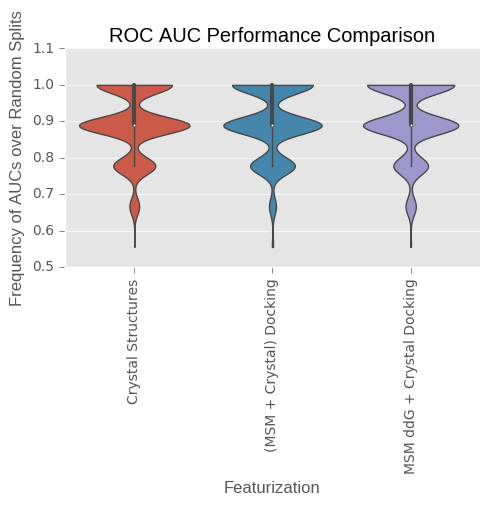

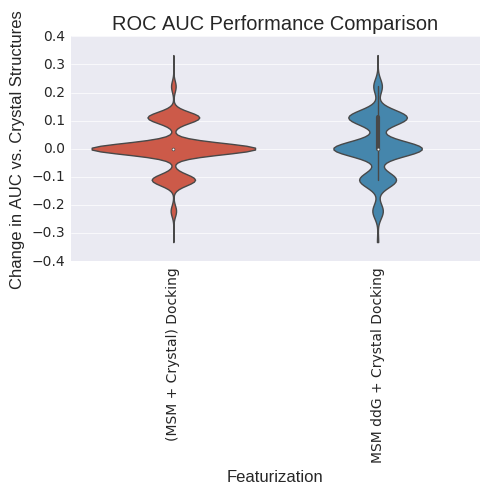

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.9018            0.0000   
(MSM + Crystal) Docking        0.9350            0.0332   
MSM ddG + Crystal Docking      0.9496            0.0478   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.149921093555, 0.212310434313)  
MSM ddG + Crystal Docking  (0.274643867607, 0.349847592727)  


ValueError: list.remove(x): x not in list

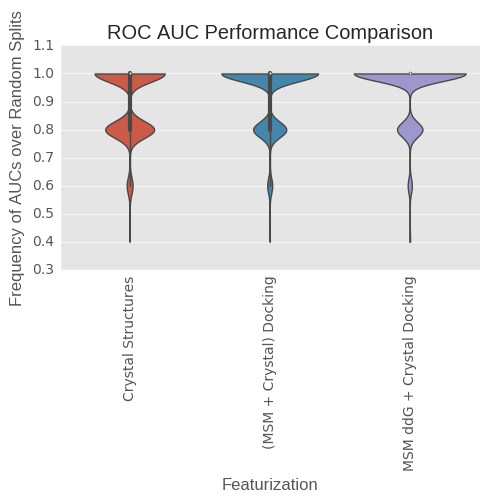

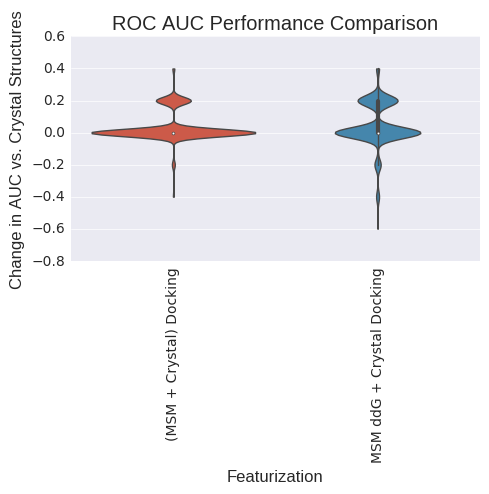

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.922952          0.000000   
(MSM + Crystal) Docking      0.904489         -0.018463   
MSM ddG + Crystal Docking    0.900564         -0.022388   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0951044651382, 0.147918002518)  
MSM ddG + Crystal Docking   (0.149921093555, 0.212310434313)  


ValueError: list.remove(x): x not in list

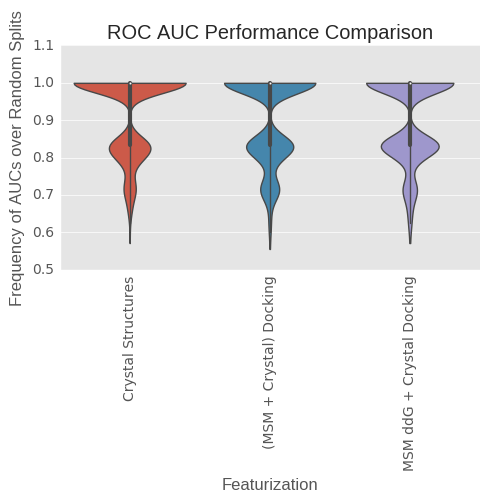

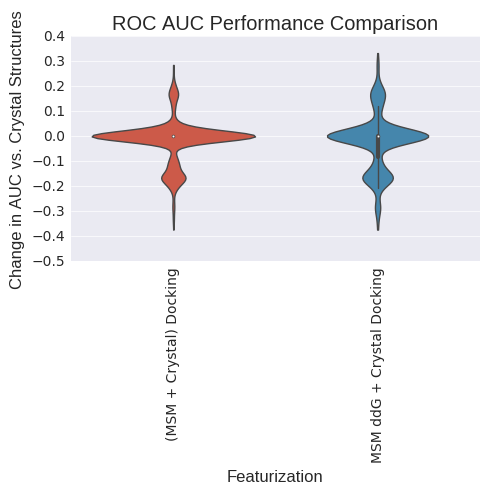

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.077048          0.000000   
(MSM + Crystal) Docking      0.095511          0.018463   
MSM ddG + Crystal Docking    0.099436          0.022388   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.165713204682, 0.230294223579)  
MSM ddG + Crystal Docking  (0.237344598779, 0.309660972417)  


ValueError: list.remove(x): x not in list

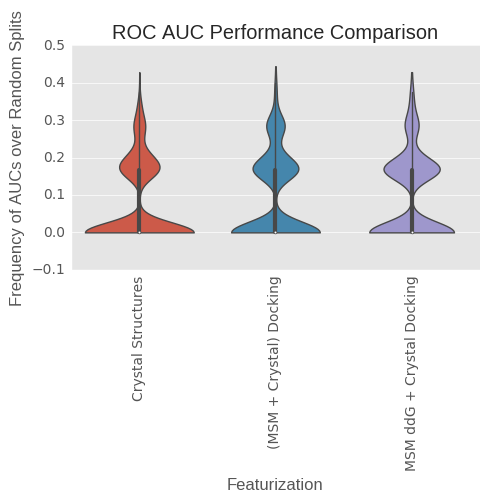

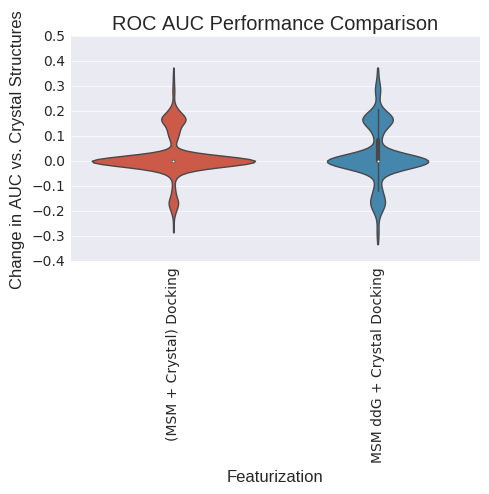

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.9018            0.0000   
(MSM + Crystal) Docking        0.9350            0.0332   
MSM ddG + Crystal Docking      0.9496            0.0478   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.149921093555, 0.212310434313)  
MSM ddG + Crystal Docking  (0.274643867607, 0.349847592727)  


ValueError: list.remove(x): x not in list

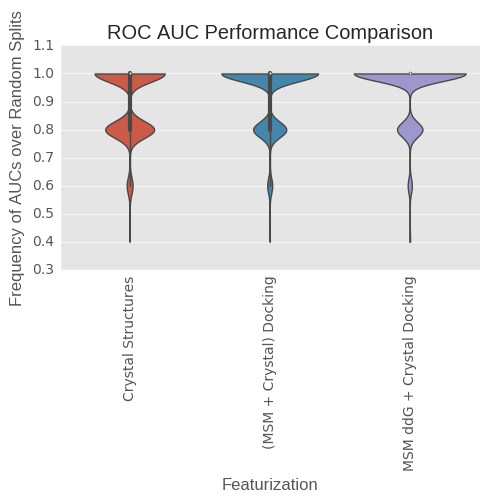

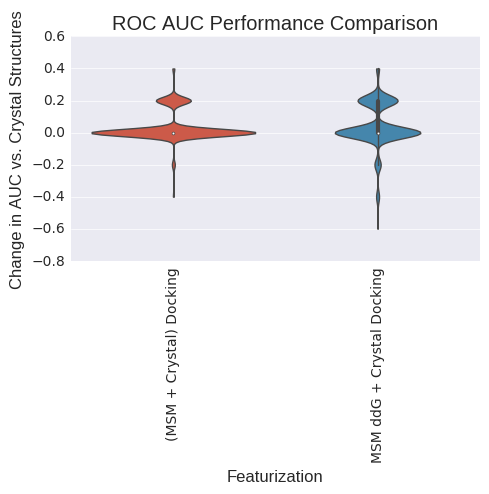

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.922952          0.000000   
(MSM + Crystal) Docking      0.904489         -0.018463   
MSM ddG + Crystal Docking    0.900564         -0.022388   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0951044651382, 0.147918002518)  
MSM ddG + Crystal Docking   (0.149921093555, 0.212310434313)  


ValueError: list.remove(x): x not in list

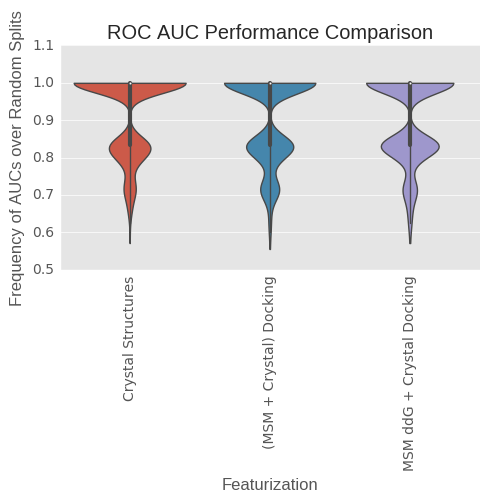

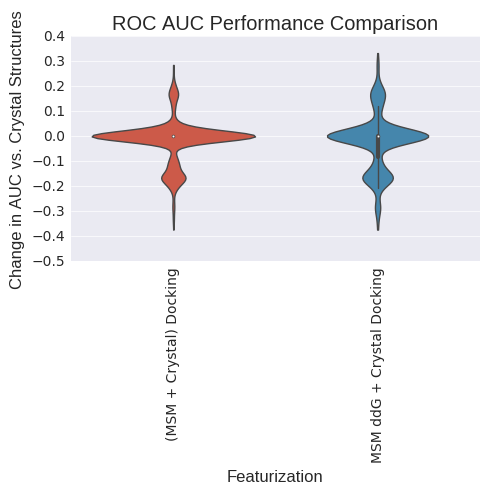

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.077048          0.000000   
(MSM + Crystal) Docking      0.095511          0.018463   
MSM ddG + Crystal Docking    0.099436          0.022388   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.165713204682, 0.230294223579)  
MSM ddG + Crystal Docking  (0.237344598779, 0.309660972417)  


ValueError: list.remove(x): x not in list

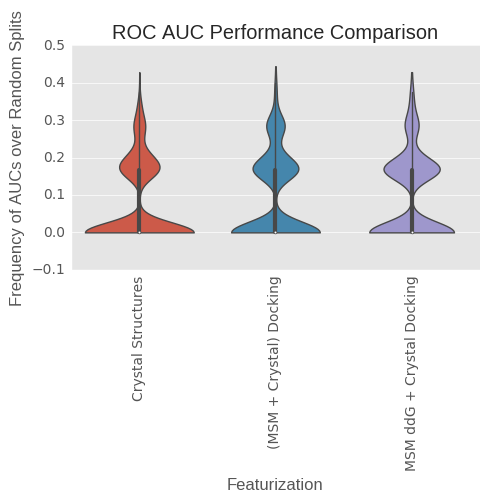

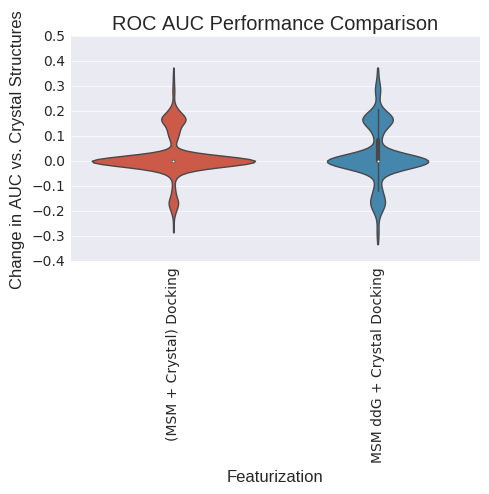

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.974275          0.000000   
(MSM + Crystal) Docking      0.983250          0.008975   
MSM ddG + Crystal Docking    0.982925          0.008650   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.178788517479, 0.245034358165)  
MSM ddG + Crystal Docking  (0.219296427221, 0.289959608242)  


ValueError: list.remove(x): x not in list

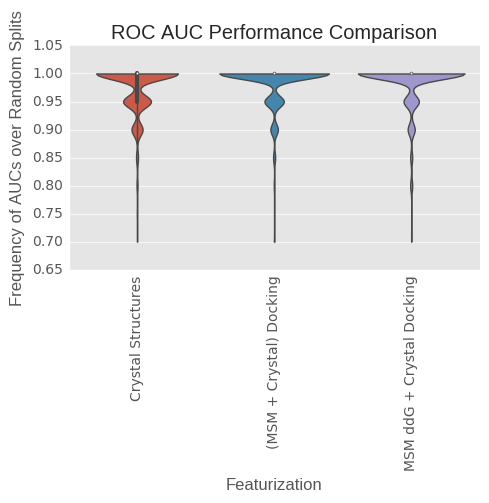

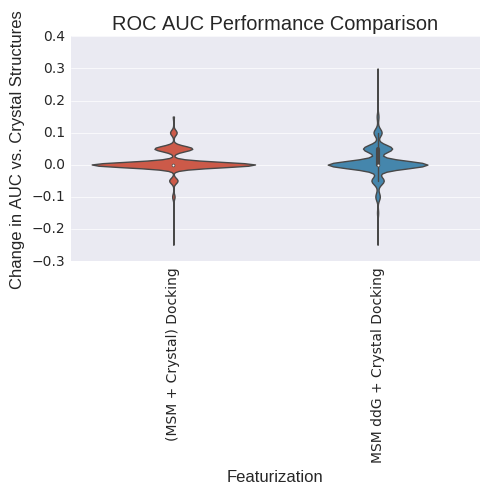

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.974275          0.000000   
(MSM + Crystal) Docking      0.983250          0.008975   
MSM ddG + Crystal Docking    0.982925          0.008650   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.178788517479, 0.245034358165)  
MSM ddG + Crystal Docking  (0.219296427221, 0.289959608242)  


ValueError: list.remove(x): x not in list

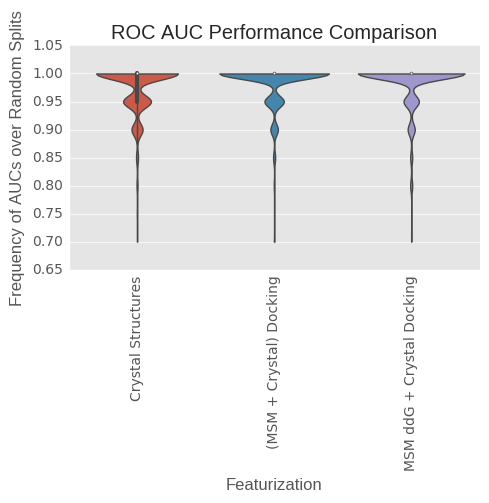

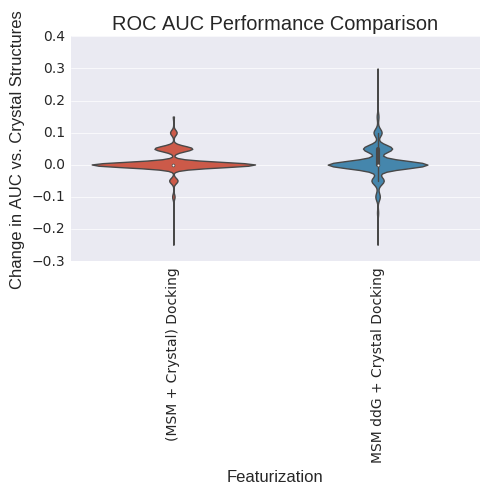

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.999752          0.000000   
(MSM + Crystal) Docking      0.999877          0.000124   
MSM ddG + Crystal Docking    0.999762          0.000010   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.178788517479, 0.245034358165)  
MSM ddG + Crystal Docking  (0.220244183674, 0.290998669459)  


ValueError: list.remove(x): x not in list

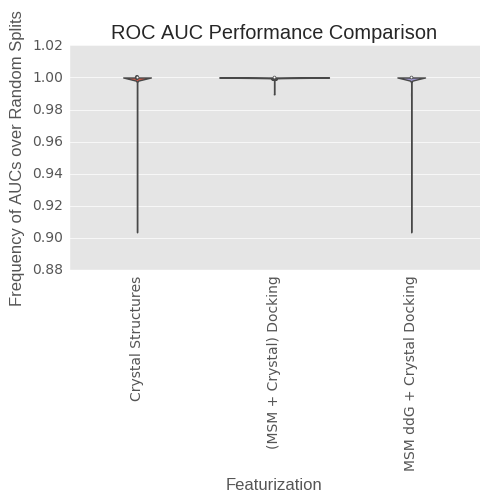

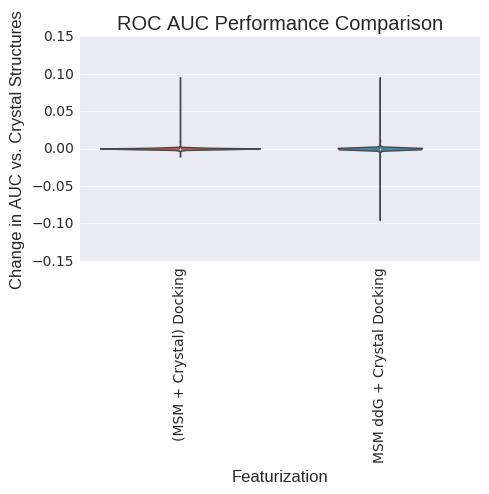

analyzing LogAUC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.064301          0.000000   
(MSM + Crystal) Docking      0.041513         -0.022787   
MSM ddG + Crystal Docking    0.039867         -0.024433   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0623107948782, 0.107199418981)  
MSM ddG + Crystal Docking    (0.10231419961, 0.156602809408)  


ValueError: list.remove(x): x not in list

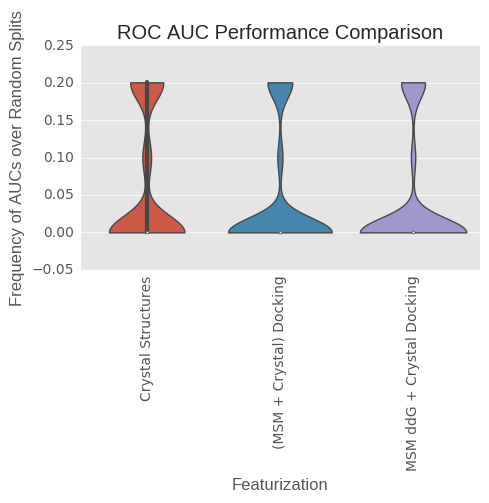

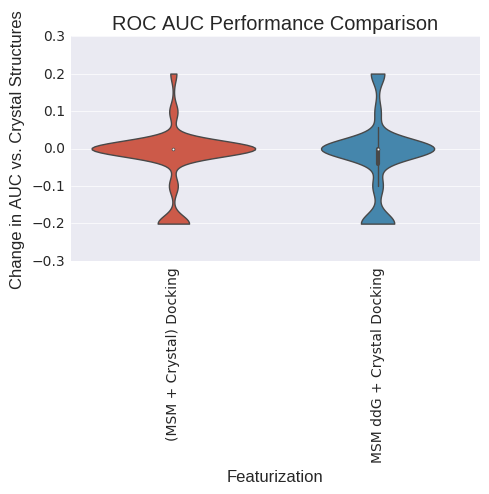

(3,)
(1, 3)


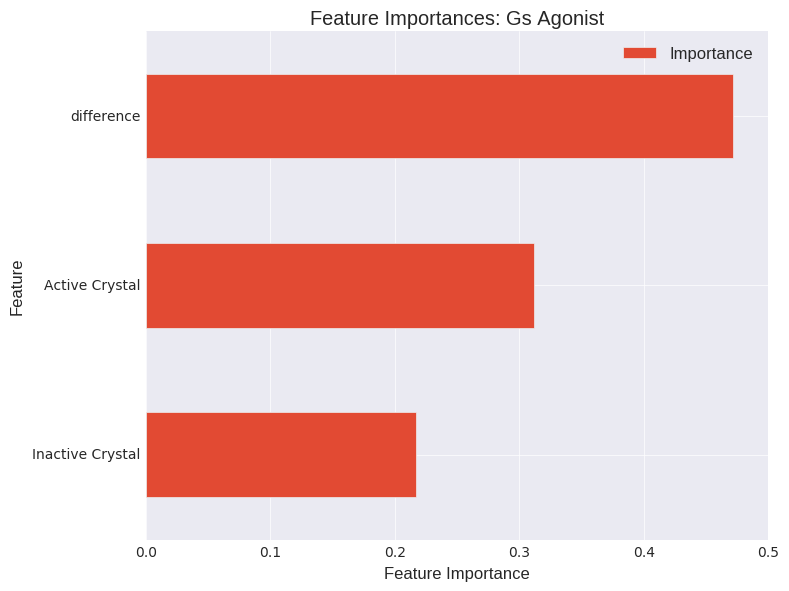

(55,)
(1, 55)


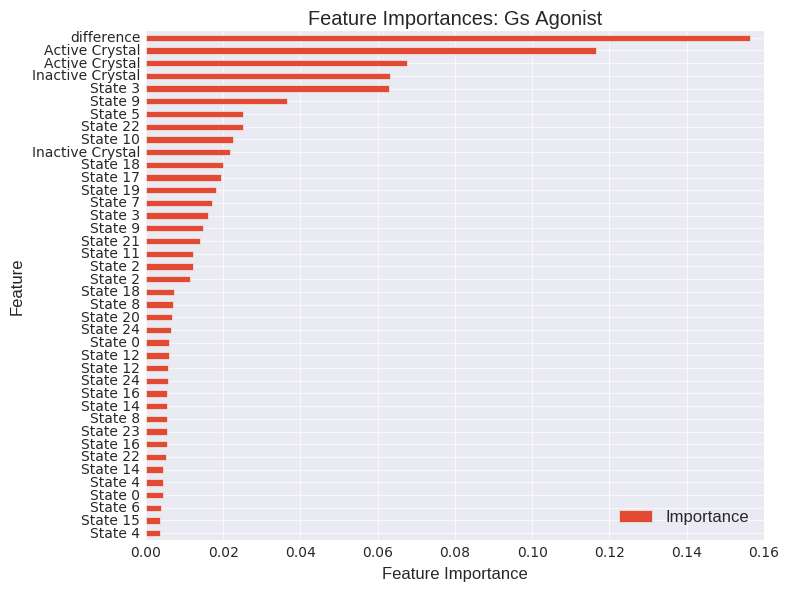

(105,)
(1, 105)


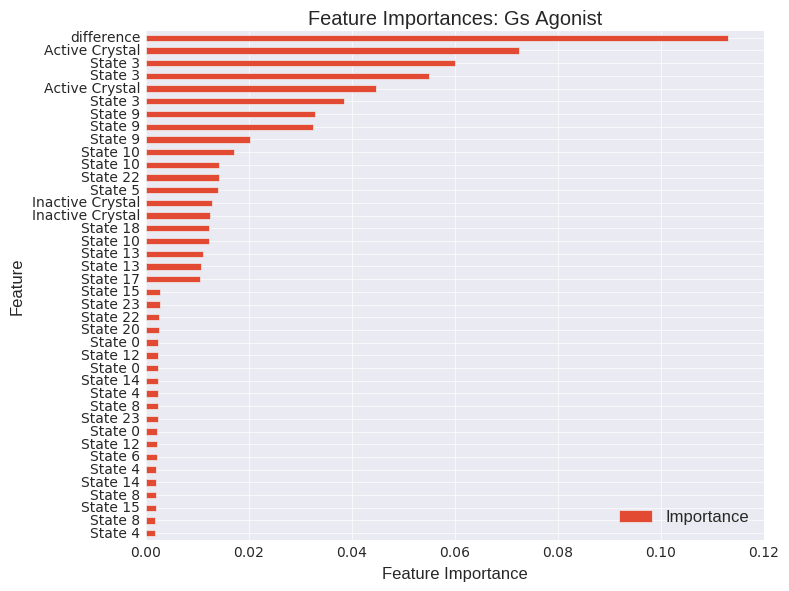

In [136]:
#SP, All ligands, RFR three class, 32 stereoisomers; new crystal grids; 25 clusters; Arrestin
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Gs Antagonist", "Gs Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean, exp_title="gs_twoclss")


#TRY LOOCV
#crystal structures might just have bigger boxes





analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.512227          0.000000   
(MSM + Crystal) Docking      0.531742          0.019514   
MSM ddG + Crystal Docking    0.492114         -0.020113   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.329707504133, 0.408032563401)  
MSM ddG + Crystal Docking  (0.234489265299, 0.306555852887)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.200246          0.000000   
(MSM + Crystal) Docking      0.276935          0.076689   
MSM ddG + Crystal Docking    0.258910          0.058664   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.748666516188, 0.815589702146)  
MSM ddG + Crystal Docking  (0.705885605243, 0.776911088614)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.5844            0.0000   
(MSM + Crystal) Docking        0.5941            0.0097   
MSM ddG + Crystal Docking      0.6003            0.0159   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.331650541571, 0.410063161304)  
MSM ddG + Crystal Docking  (0.348195043472, 0.427294559796)  


ValueError: list.remove(x): x not in list

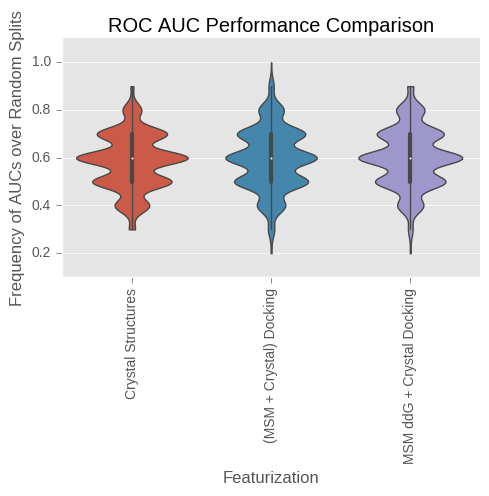

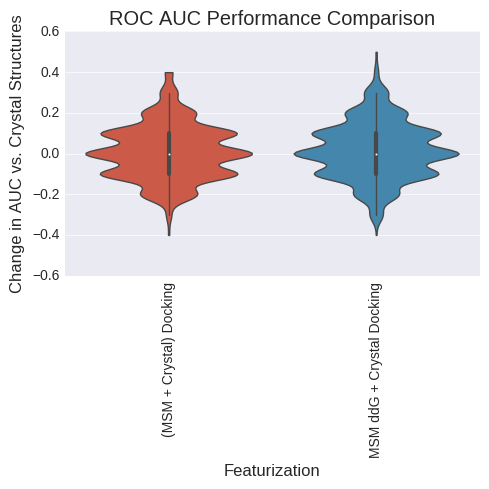

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.440000          0.000000   
(MSM + Crystal) Docking      0.414333         -0.025667   
MSM ddG + Crystal Docking    0.355000         -0.085000   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.188163930838, 0.255527121507)  
MSM ddG + Crystal Docking  (0.174111852368, 0.239776934925)  


ValueError: list.remove(x): x not in list

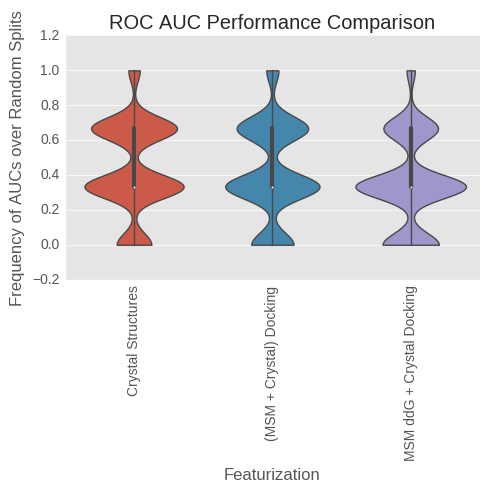

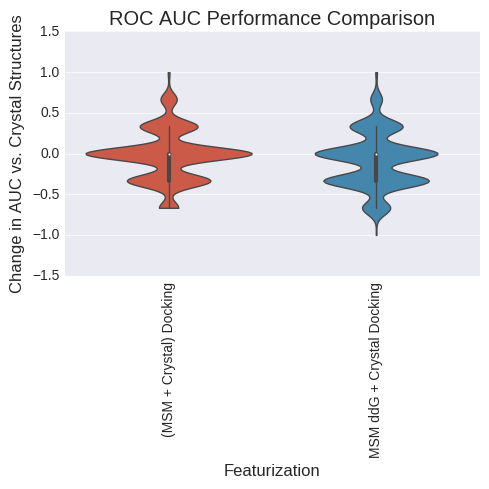

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.426852          0.000000   
(MSM + Crystal) Docking      0.433974          0.007121   
MSM ddG + Crystal Docking    0.430617          0.003764   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.347220429771, 0.426282355827)  
MSM ddG + Crystal Docking   (0.33845679673, 0.417164629836)  


ValueError: list.remove(x): x not in list

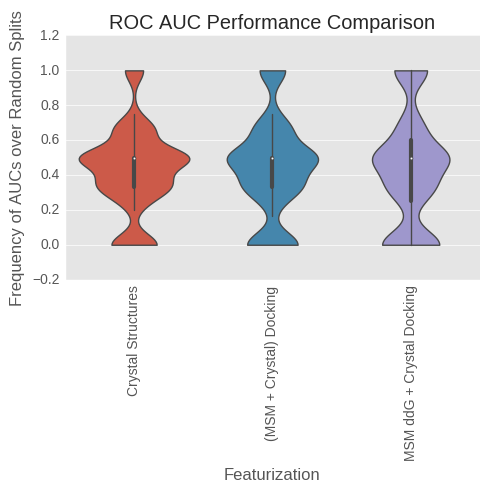

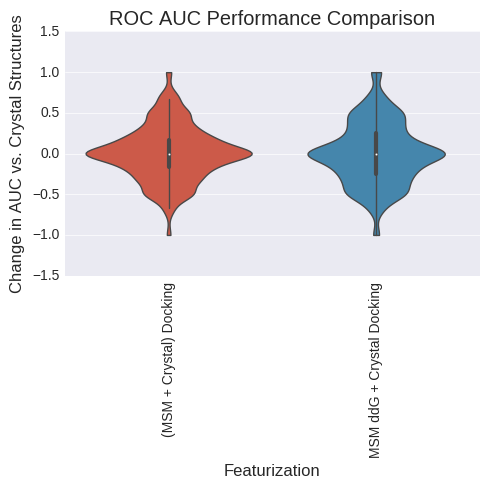

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.573148          0.000000   
(MSM + Crystal) Docking      0.566026         -0.007121   
MSM ddG + Crystal Docking    0.569383         -0.003764   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.341376424226, 0.42020545535)  
MSM ddG + Crystal Docking  (0.365767685535, 0.445484635797)  


ValueError: list.remove(x): x not in list

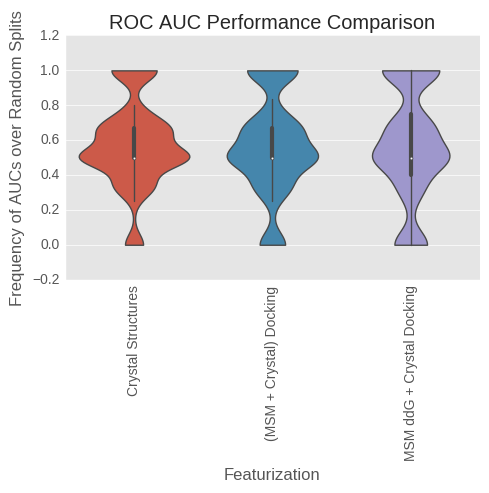

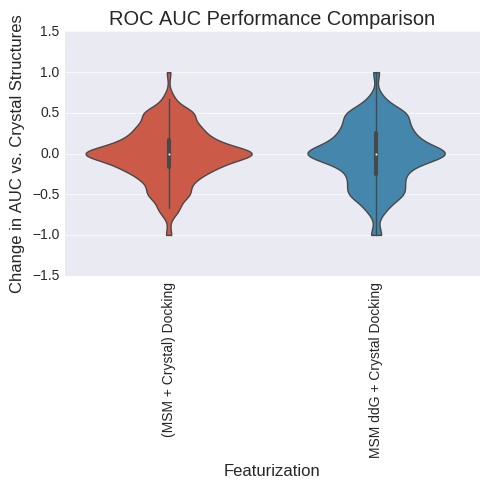

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.5844            0.0000   
(MSM + Crystal) Docking        0.5941            0.0097   
MSM ddG + Crystal Docking      0.6003            0.0159   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.331650541571, 0.410063161304)  
MSM ddG + Crystal Docking  (0.348195043472, 0.427294559796)  


ValueError: list.remove(x): x not in list

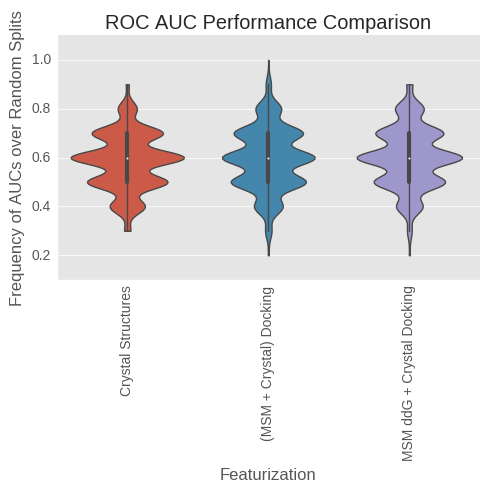

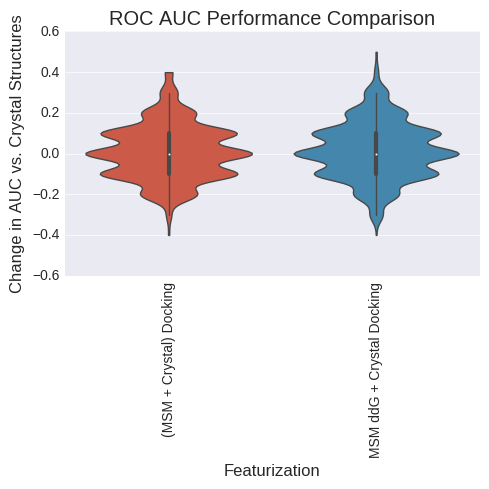

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.581242          0.000000   
(MSM + Crystal) Docking      0.579886         -0.001357   
MSM ddG + Crystal Docking    0.582433          0.001191   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.387320248446, 0.467642061629)  
MSM ddG + Crystal Docking  (0.408953472402, 0.489718826418)  


ValueError: list.remove(x): x not in list

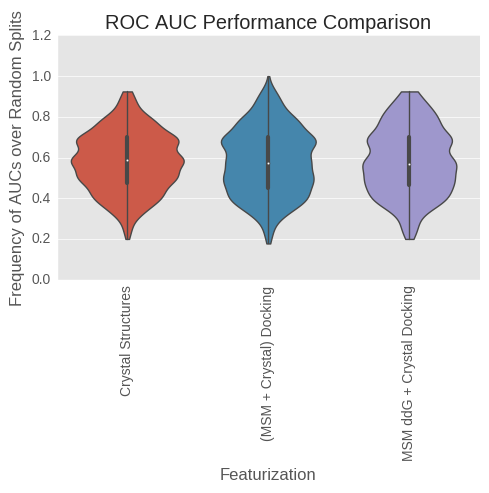

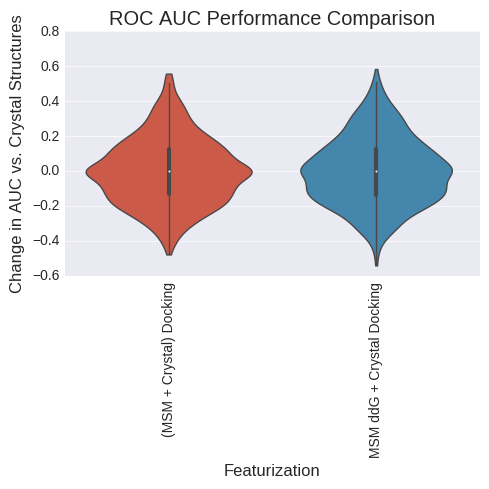

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.418758          0.000000   
(MSM + Crystal) Docking      0.420114          0.001357   
MSM ddG + Crystal Docking    0.417567         -0.001191   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.435611674688, 0.516704701227)  
MSM ddG + Crystal Docking  (0.437591064652, 0.518698946604)  


ValueError: list.remove(x): x not in list

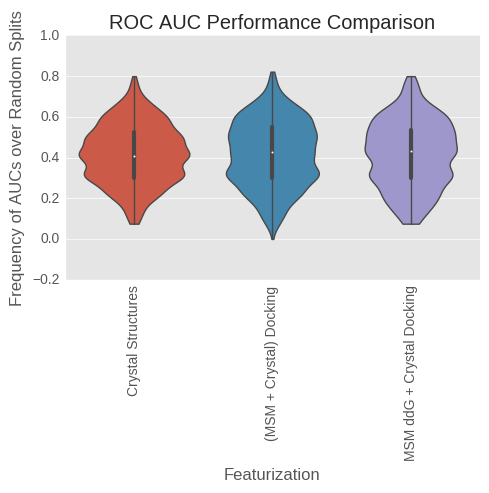

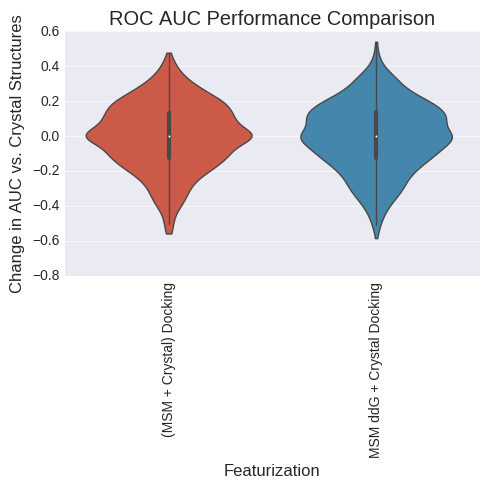

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.722881          0.000000   
(MSM + Crystal) Docking      0.744952          0.022071   
MSM ddG + Crystal Docking    0.722476         -0.000405   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.456427504571, 0.537612042418)  
MSM ddG + Crystal Docking  (0.398126872415, 0.478690432033)  


ValueError: list.remove(x): x not in list

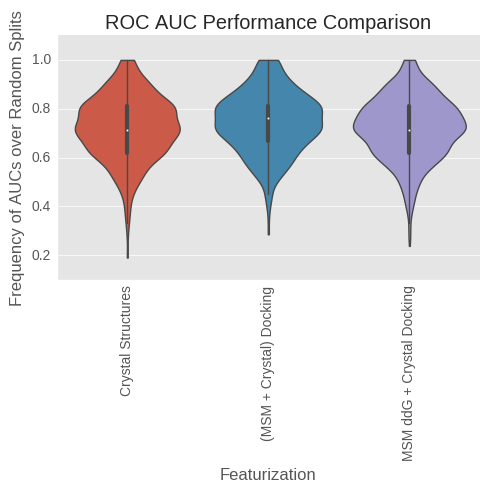

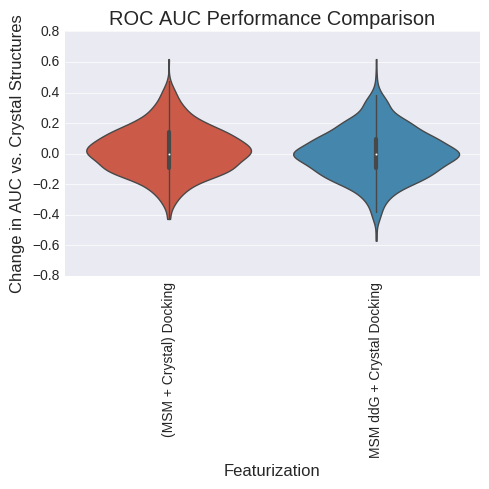

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.778734          0.000000   
(MSM + Crystal) Docking      0.801969          0.023235   
MSM ddG + Crystal Docking    0.804823          0.026089   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.550480665613, 0.630319742375)  
MSM ddG + Crystal Docking  (0.567647031567, 0.646929276814)  


ValueError: list.remove(x): x not in list

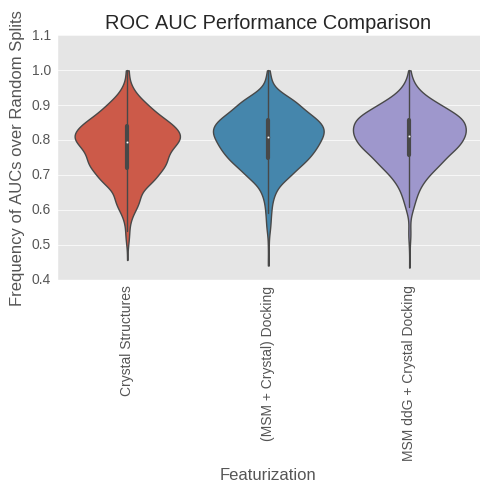

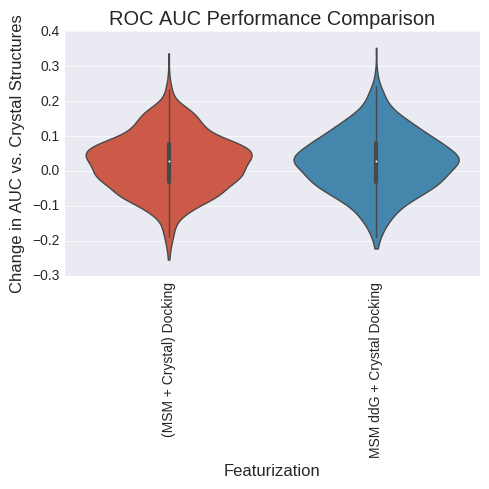

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.560100          0.000000   
(MSM + Crystal) Docking      0.483775         -0.076325   
MSM ddG + Crystal Docking    0.579800          0.019701   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.390265518687, 0.470657244399)  
MSM ddG + Crystal Docking  (0.411909628018, 0.492723123813)  


ValueError: list.remove(x): x not in list

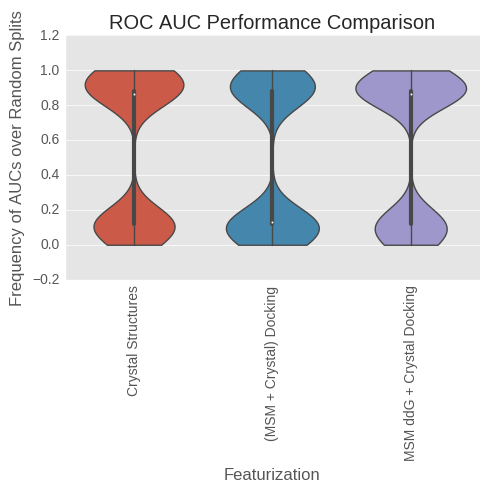

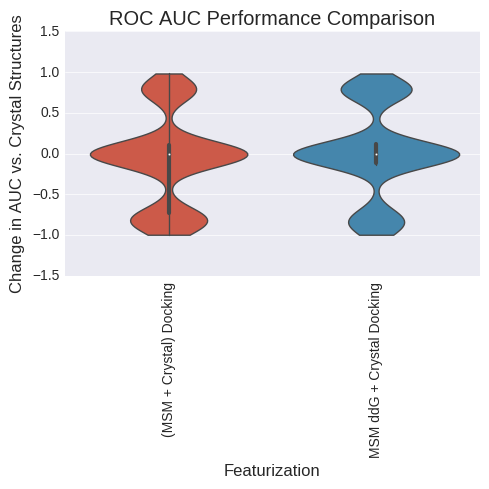

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/efficacy_scripts.py:1631: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  inplace=False)


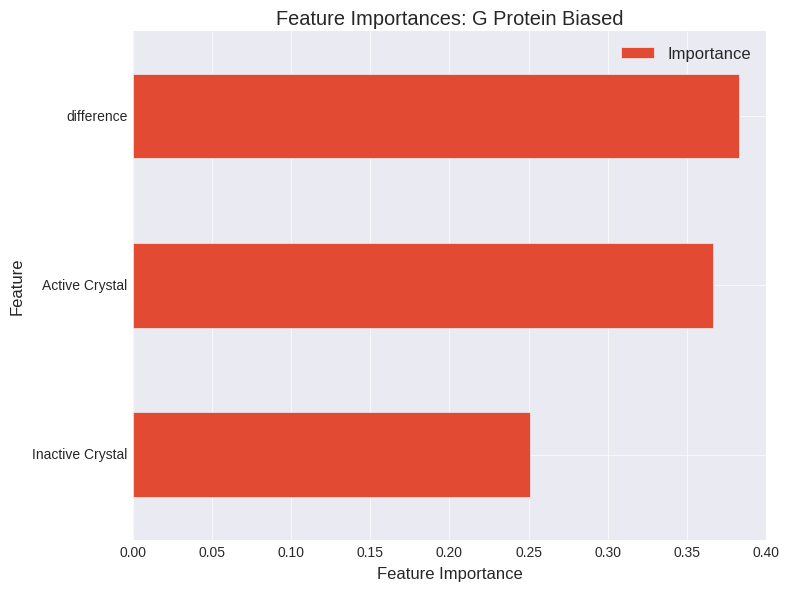

(55,)
(1, 55)


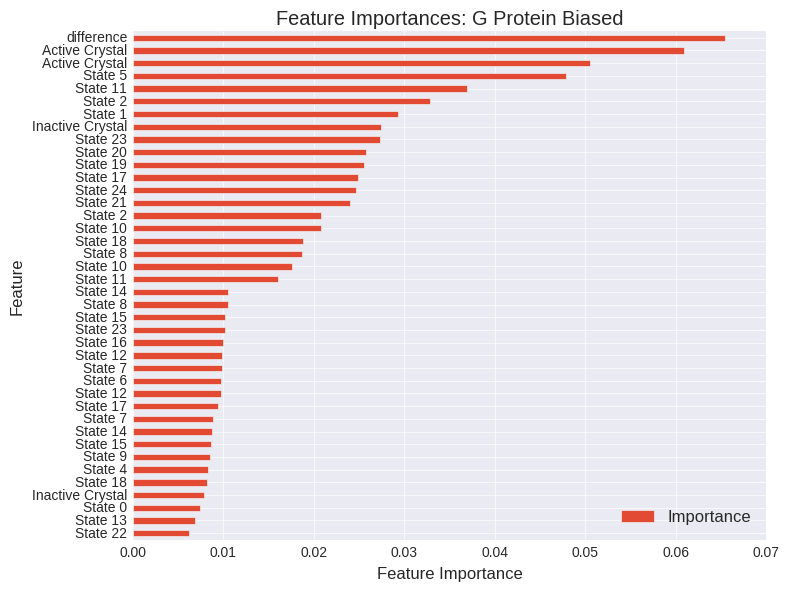

(105,)
(1, 105)


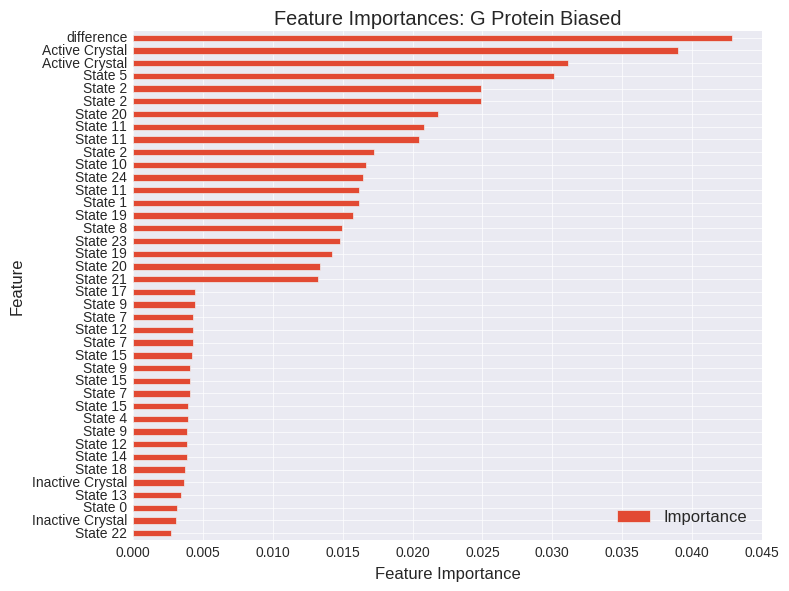

In [445]:
#XP, All ligands, RFR three class, 32 stereoisomers; new crystal grids; 25 clusters
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean, exp_title="0pt4_gap_three_class")


#TRY LOOCV
#crystal structures might just have bigger boxes




In [443]:
y_df["paper_name"] = bret.loc[y_df.index]["PaperName"]
class_titles = []
for i in y_df["class"].values.tolist():
    if i == 0.:
        class_titles.append("Balanced Agonist")
    if i == 1.:
        class_titles.append("G Protein Biased Agonist")
    if i == 2.:
        class_titles.append("Antagonist")
y_df["class"] = class_titles
y_df.sort("class", inplace=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)


,class,paper_name
CID_4546390,Antagonist,ICI 215001
CID_123686,Antagonist,ICI 89406
CID_155774,Antagonist,Xamoterol (ICI 118587)
CID_3682,Antagonist,ICI 118551
CID_4828,Antagonist,Pindolol
CID_4883,Antagonist,Practolol
CID_4930,Antagonist,Pronethalol
CID_4946,Antagonist,Propranolol
CID_5806,Antagonist,Dichloroisoproterenol
CID_5253,Antagonist,Sotalol (betapace)


In [446]:
from importlib import reload
import grids
reload(grids)
from grids import *

grid_center = "64.4, 16.9, 11.99"


#reimaged_dir = samples_dir
#mae_dir = reimaged_dir
#remove_ter(reimaged_dir)
#reorder(reimaged_dir)


#agonist_ligands = [a for a in agonist_ligands if "TA" not in a]

#pprep(mae_dir, ref = active_ref_dir, chosen_receptors = chosen_receptors, worker_pool=None, parallel=True)
#generate_grids(mae_dir, grid_center, grid_dir, remove_lig = "BIA", chosen_receptors = chosen_receptors, worker_pool=None, outer_box=25.)

precision = "SP"
htbc_dir = "/home/enf/htbc/sdfs"
docking_dir = "/home/enf/htbc/b2ar/docking_SP_1-stereoisomer"
#docking_dir = "/home/enf/htbc/b2ar/docking_xp/1_stereoisomer"
grid_dir = "/home/enf/htbc/b2ar/grids"

#lig_dir = "/home/enf/b2ar_analysis/all_ligands/1_stereoisomer"
#df = prepare_ligands(htbc_dir, exts = [".sdf"],
#                     n_ring_conf=1, n_stereoisomers=1,
#                     force_field=16, worker_pool=None,
#                     parallel=True, redo=False,
#                     smiles_df=None, cid_df=None,
#                     binding_db=None,
#                     return_df=True)

if not os.path.exists(docking_dir):
    os.makedirs(docking_dir)
if not os.path.exists(grid_dir):
    os.makedirs(grid_dir)

#chosen_ligands = df.index.values.tolist()[:2000]
chosen_ligands = [n for n in get_ligands(htbc_dir, ".mae")]
#lig_dir = all_ligands_dir
dock_ligands_and_receptors(grid_dir, docking_dir, htbc_dir,
                           precision = precision, ext = "-out.maegz",
                           chosen_ligands=chosen_ligands, chosen_receptors =["3P0G_pymol_prepped_new", "2RH1_prepped"],
                           parallel = False, grid_ext = ".zip", worker_pool=dview,
                           retry_after_failed=True, timeout=60*1200*1000)
#dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*1200)


#dock_ligands_and_receptors(grid_dir, docking_dir,  biased_agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = biased_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)
#dock_ligands_and_receptors(grid_dir, docking_dir, agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = agonist_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)


Creating new directories for each ligand.
Done creating directories. Determining which docking jobs to conduct.
About to do 89028 Docking computations.
Completed docking.


analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.662149          0.000000   
(MSM + Crystal) Docking      0.644254         -0.017895   
MSM ddG + Crystal Docking    0.660146         -0.002003   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.155483598105, 0.218668835784)  
MSM ddG + Crystal Docking  (0.205109989984, 0.274343780426)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.407382          0.000000   
(MSM + Crystal) Docking      0.334177         -0.073206   
MSM ddG + Crystal Docking    0.341025         -0.066358   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.349169831579, 0.428306589359)  
MSM ddG + Crystal Docking   (0.363812421011, 0.44346626498)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.7039            0.0000   
(MSM + Crystal) Docking        0.6595           -0.0444   
MSM ddG + Crystal Docking      0.6755           -0.0284   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.104122139752, 0.158768504606)  
MSM ddG + Crystal Docking   (0.143447717067, 0.20487608711)  


ValueError: list.remove(x): x not in list

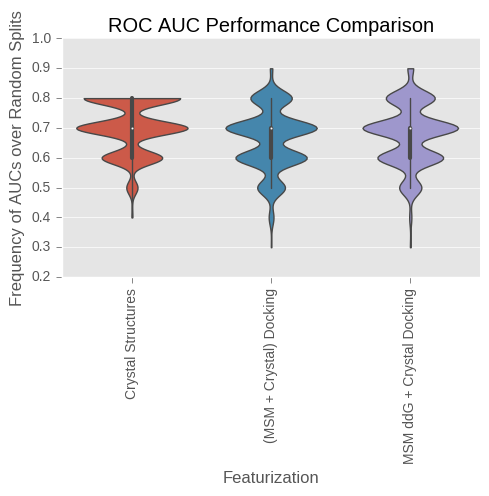

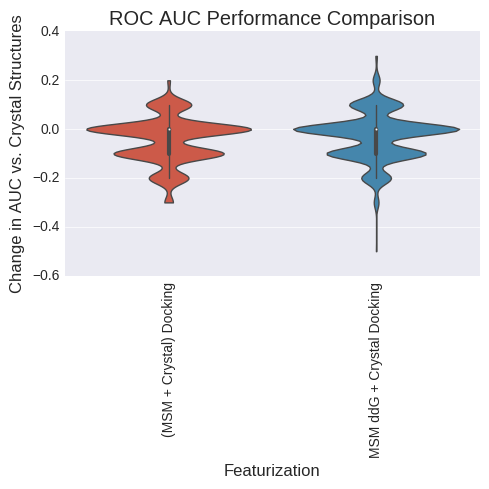

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures            0.88775            0.0000   
(MSM + Crystal) Docking       0.78225           -0.1055   
MSM ddG + Crystal Docking     0.79475           -0.0930   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking    (0.0485015723544, 0.0892195587818)  
MSM ddG + Crystal Docking  (0.0536466609731, 0.0959953761842)  


ValueError: list.remove(x): x not in list

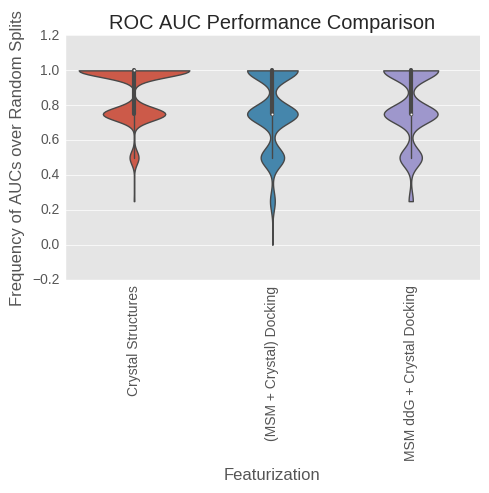

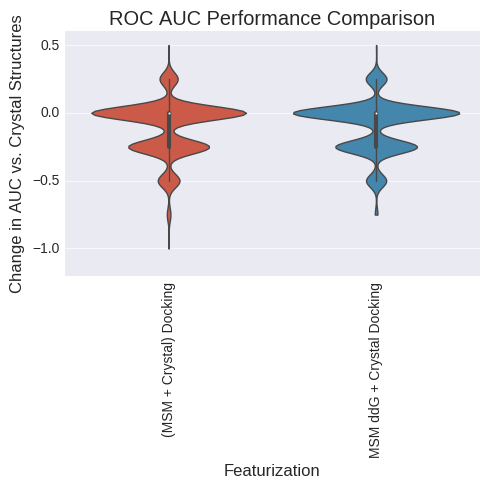

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.636683          0.000000   
(MSM + Crystal) Docking      0.610362         -0.026321   
MSM ddG + Crystal Docking    0.630698         -0.005985   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.206998212731, 0.276429193019)  
MSM ddG + Crystal Docking  (0.261217039722, 0.335458973228)  


ValueError: list.remove(x): x not in list

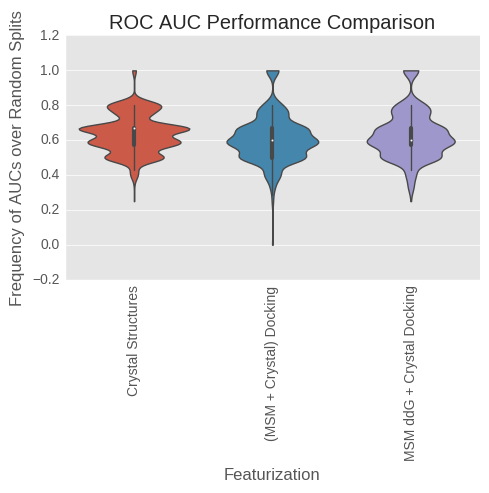

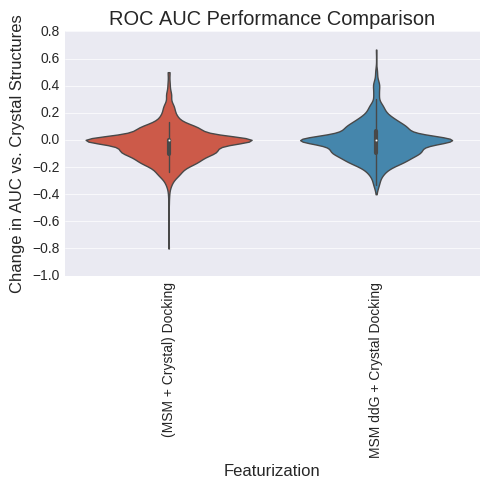

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.363317          0.000000   
(MSM + Crystal) Docking      0.389638          0.026321   
MSM ddG + Crystal Docking    0.369302          0.005985   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.393212284114, 0.473670931984)  
MSM ddG + Crystal Docking  (0.350144793846, 0.429318444763)  


ValueError: list.remove(x): x not in list

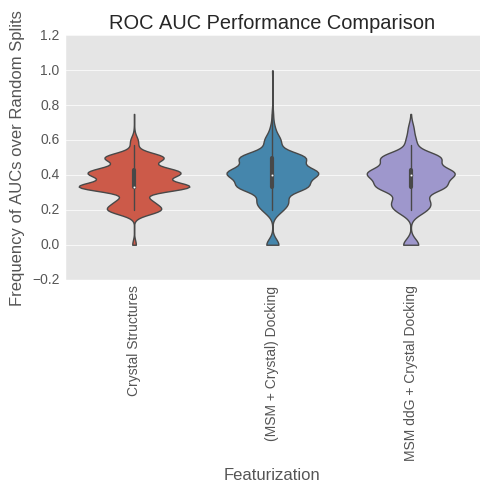

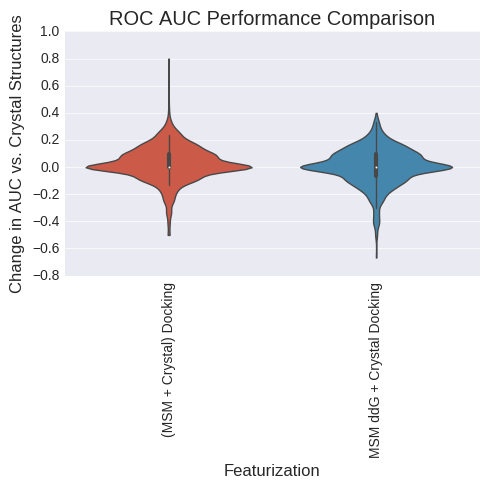

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.7039            0.0000   
(MSM + Crystal) Docking        0.6595           -0.0444   
MSM ddG + Crystal Docking      0.6755           -0.0284   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.104122139752, 0.158768504606)  
MSM ddG + Crystal Docking   (0.143447717067, 0.20487608711)  


ValueError: list.remove(x): x not in list

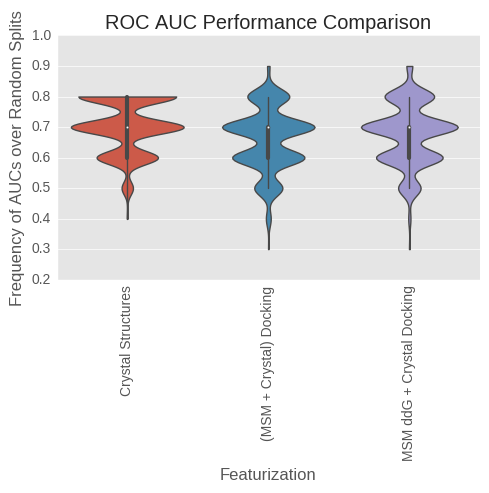

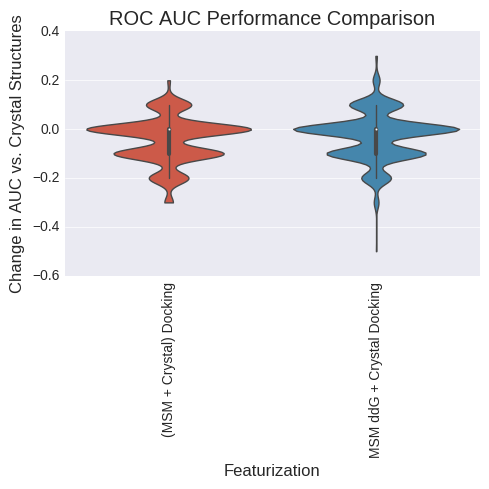

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.585861          0.000000   
(MSM + Crystal) Docking      0.588427          0.002566   
MSM ddG + Crystal Docking    0.600539          0.014678   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.298718421021, 0.375443481067)  
MSM ddG + Crystal Docking  (0.332622328983, 0.411078191562)  


ValueError: list.remove(x): x not in list

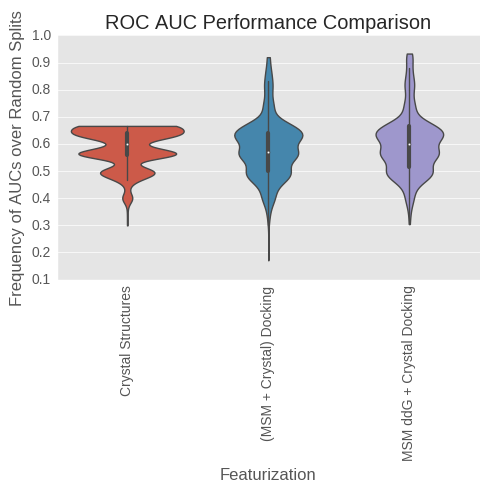

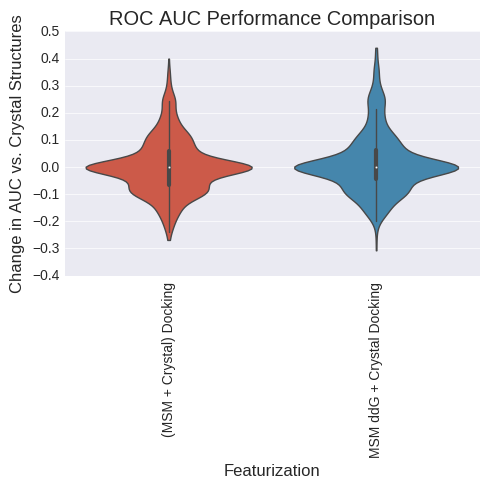

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.414139          0.000000   
(MSM + Crystal) Docking      0.411573         -0.002566   
MSM ddG + Crystal Docking    0.399461         -0.014678   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.355998211368, 0.435385933262)  
MSM ddG + Crystal Docking  (0.331650541571, 0.410063161304)  


ValueError: list.remove(x): x not in list

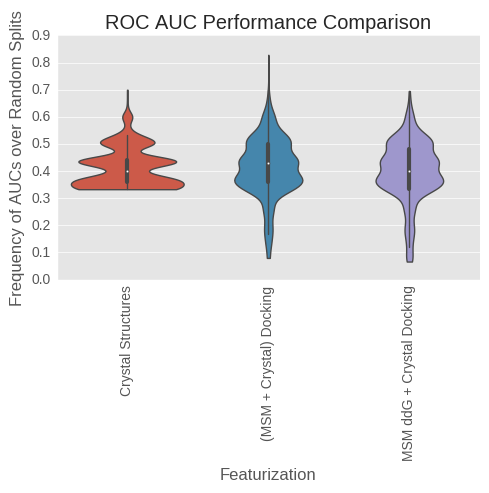

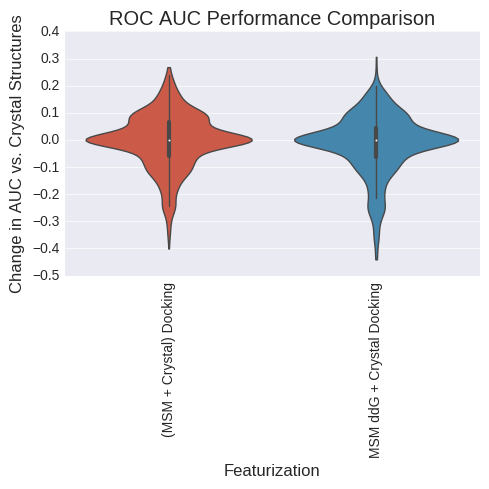

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.757750          0.000000   
(MSM + Crystal) Docking      0.786271          0.028521   
MSM ddG + Crystal Docking    0.810521          0.052771   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.488283745581, 0.569333966854)  
MSM ddG + Crystal Docking  (0.540405765851, 0.620526465434)  


ValueError: list.remove(x): x not in list

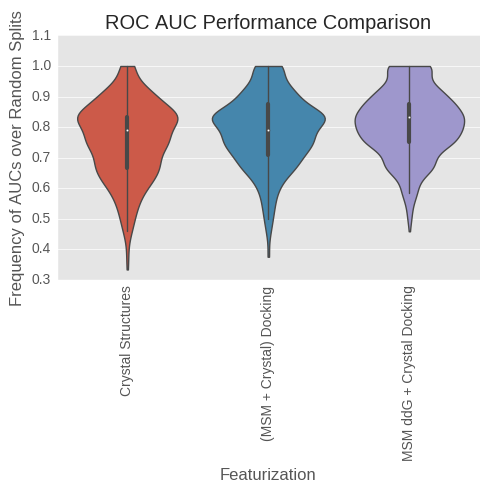

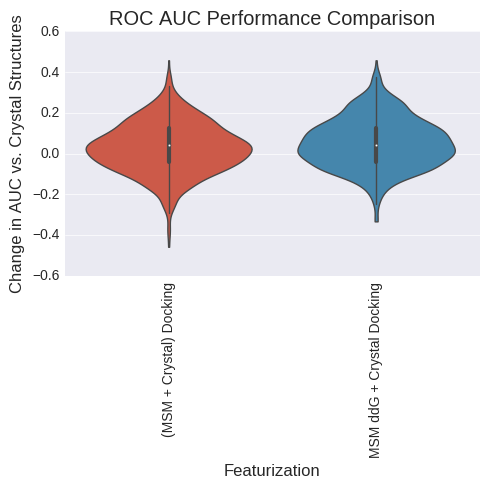

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.716146          0.000000   
(MSM + Crystal) Docking      0.792333          0.076188   
MSM ddG + Crystal Docking    0.809472          0.093326   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.688270090371, 0.760750703093)  
MSM ddG + Crystal Docking     (0.749715642005, 0.816527394)  


ValueError: list.remove(x): x not in list

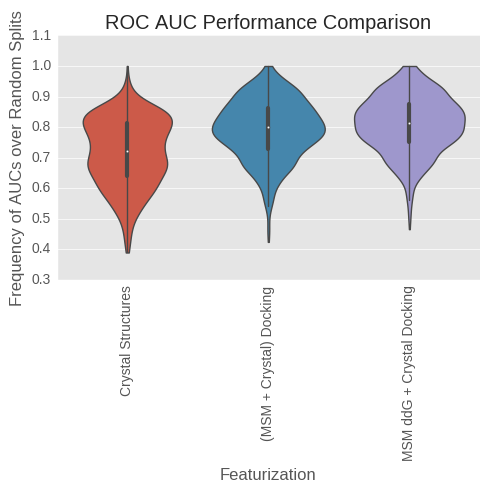

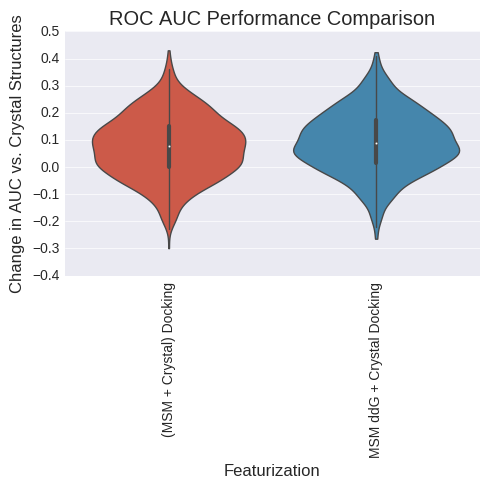

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.691081          0.000000   
(MSM + Crystal) Docking      0.661785         -0.029296   
MSM ddG + Crystal Docking    0.699804          0.008723   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.442542369815, 0.523681729792)  
MSM ddG + Crystal Docking   (0.484292664225, 0.56537777753)  


ValueError: list.remove(x): x not in list

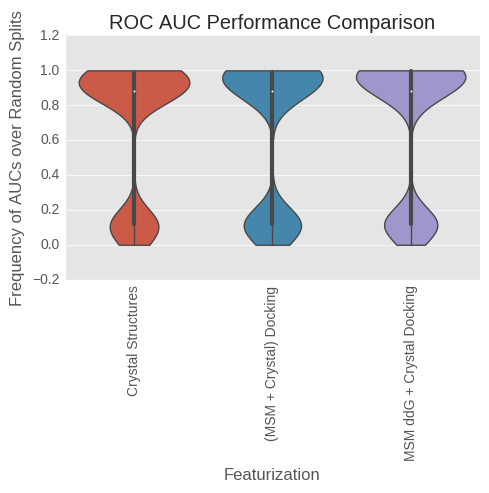

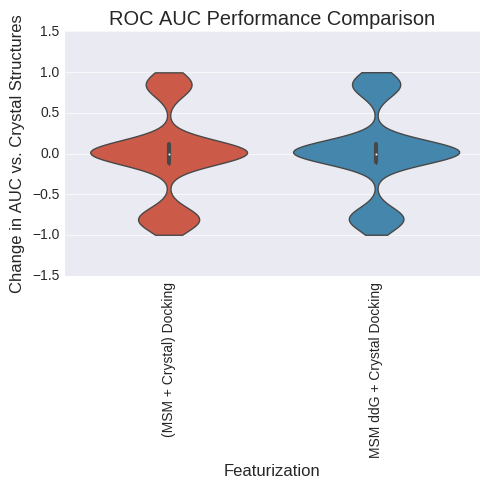

analyzing LogAUC
(1000, 0)
/n
(3, 3)
(3, 3)


/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/efficacy_scripts.py:1631: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  inplace=False)


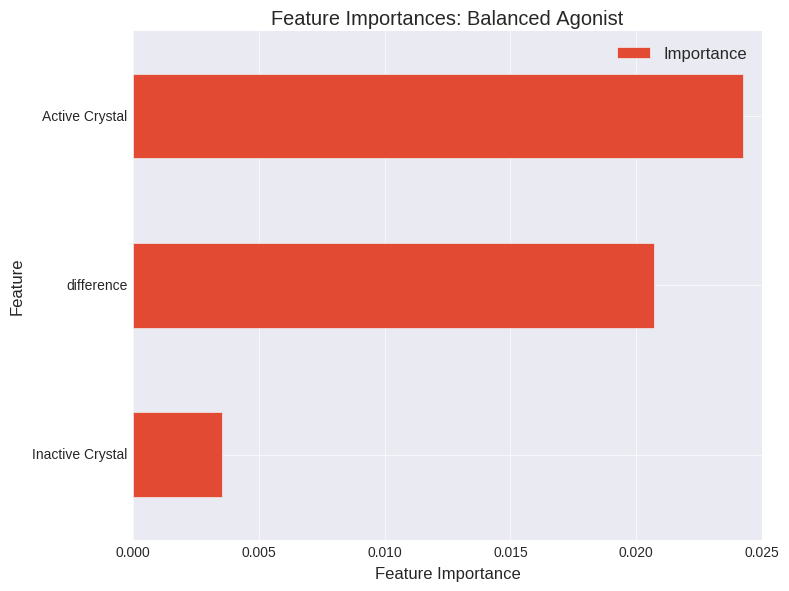

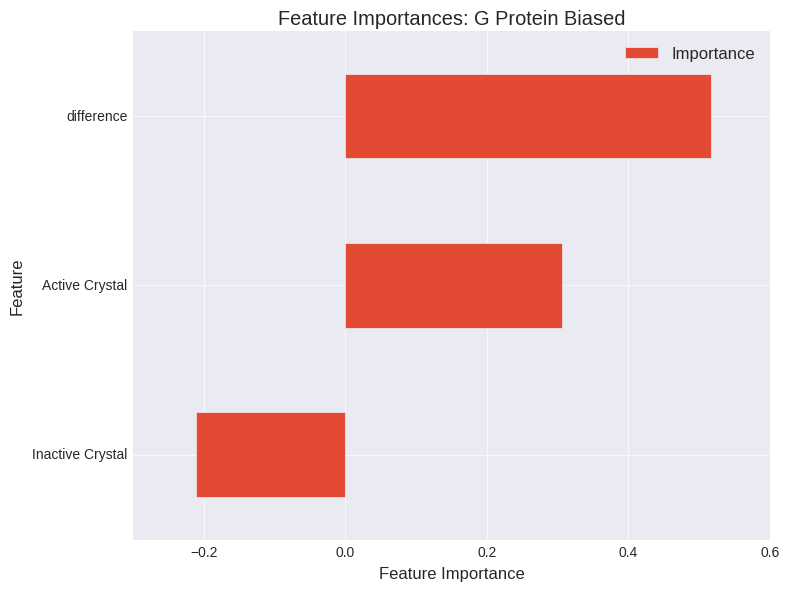

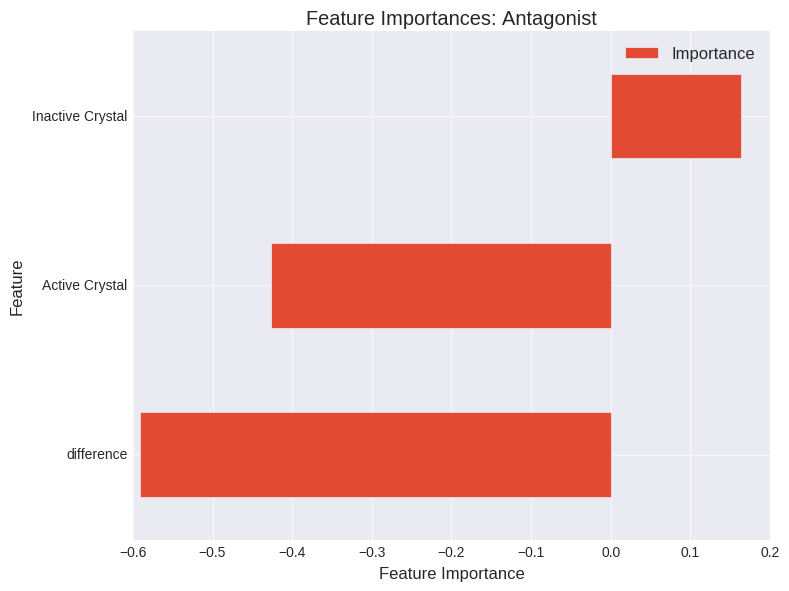

(3, 55)
(3, 55)


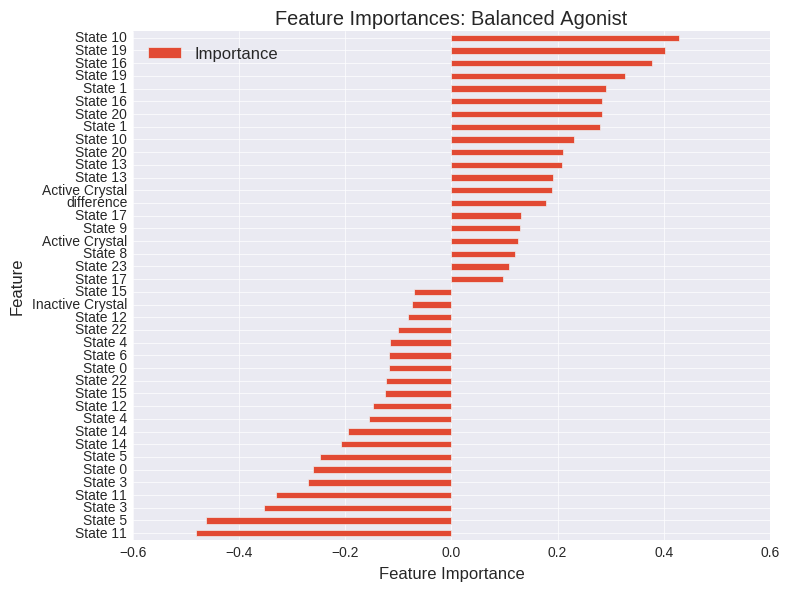

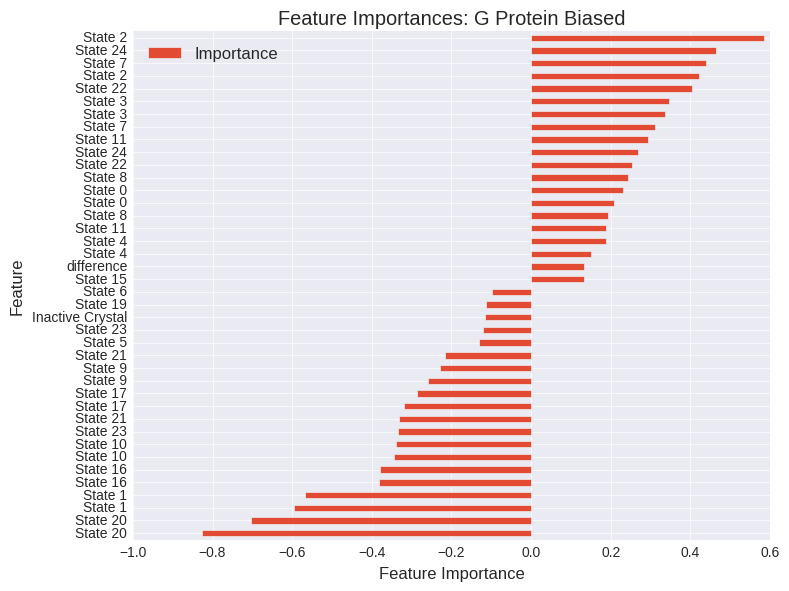

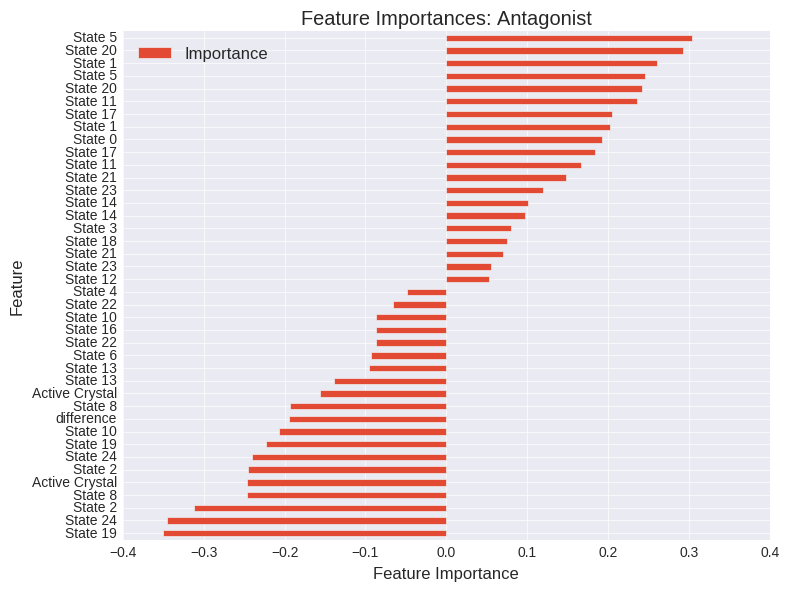

(3, 105)
(3, 105)


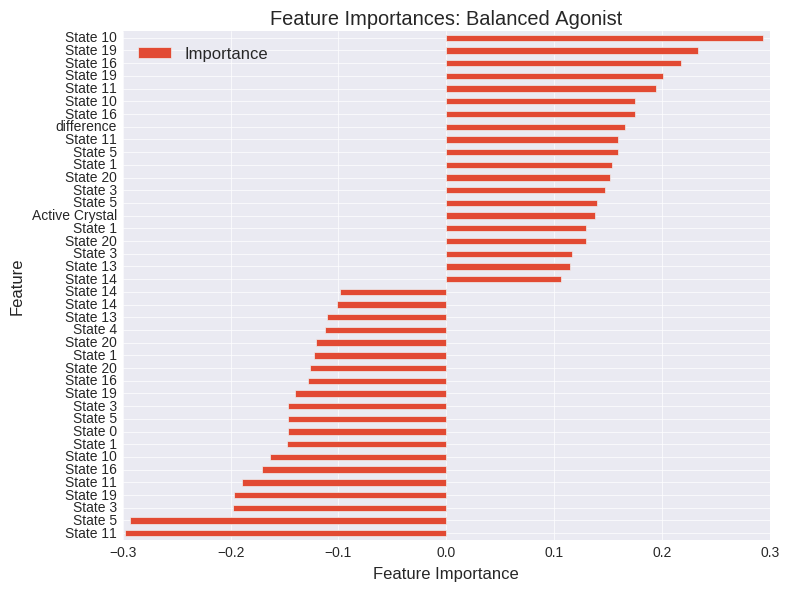

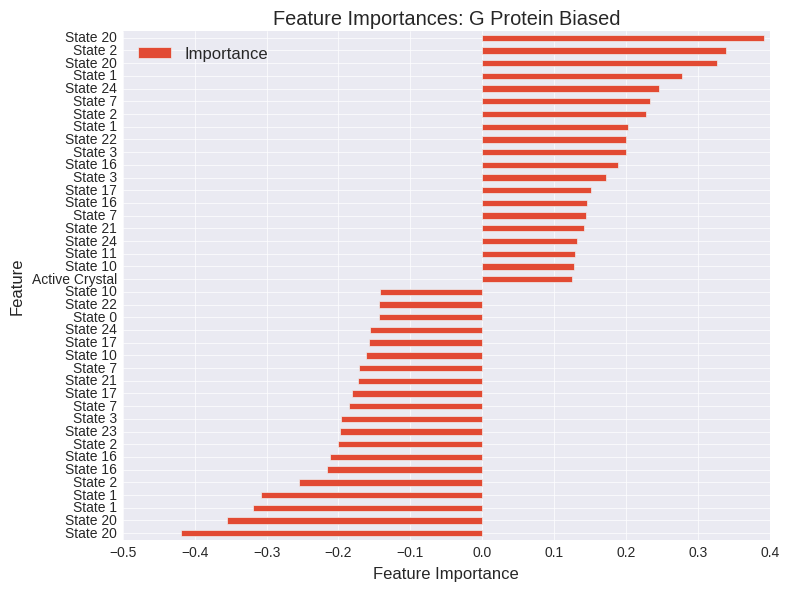

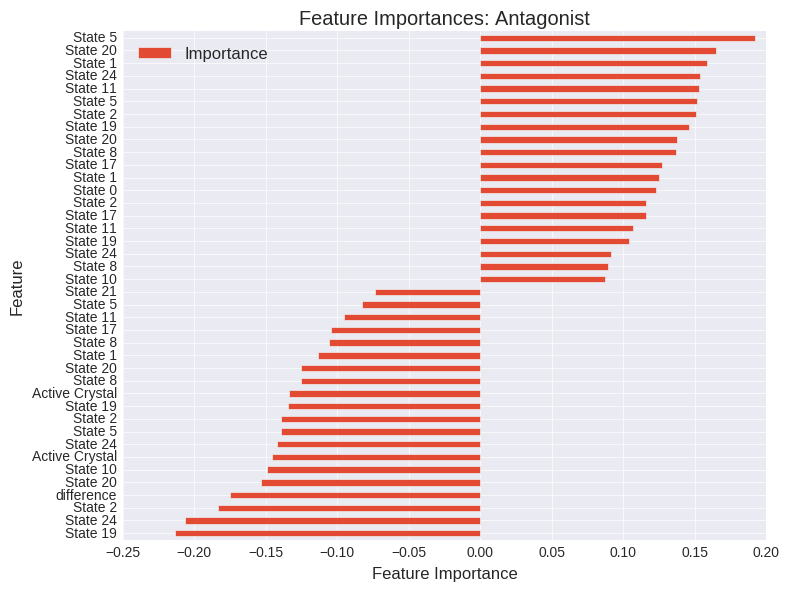

In [425]:
#XP, All ligands, LR three class, 32 stereoisomers; new crystal grids; 25 clusters
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean, exp_title=save_name)


#TRY LOOCV
#crystal structures might just have bigger boxes


In [422]:
df = importance_dfs['MSM ddG + Crystal Docking'].reset_index().drop_duplicates('index', keep='first').set_index('index').sort("Importance", inplace=False, ascending=False)
df

#df.drop_duplicates(keep='first').sort(["Importance"],inplace=False, ascending=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,Importance
index,
difference,0.049572
Active Crystal,0.026974
State 20,0.015245
State 2,0.011647
State 10,0.009451
State 19,0.007757
State 11,0.007621
State 17,0.007324
State 24,0.006861


In [415]:
df.index.drop_duplicates(keep='first')

Index(['State 22', 'State 13', 'State 15', 'State 0', 'State 23', 'State 9',
       'Inactive Crystal', 'State 8', 'State 14', 'State 7', 'State 18',
       'State 12', 'State 16', 'State 5', 'State 21', 'State 4', 'State 6',
       'State 3', 'State 1', 'State 24', 'State 17', 'State 11', 'State 19',
       'State 10', 'State 2', 'State 20', 'Active Crystal', 'difference'],
      dtype='object')

analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.653510          0.000000   
(MSM + Crystal) Docking      0.737178          0.083668   
MSM ddG + Crystal Docking    0.724932          0.071422   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.443533115729, 0.524677801548)  
MSM ddG + Crystal Docking   (0.396160540998, 0.47668312811)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.311577          0.000000   
(MSM + Crystal) Docking      0.387888          0.076311   
MSM ddG + Crystal Docking    0.383335          0.071758   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.709001330541, 0.779755816326)  
MSM ddG + Crystal Docking  (0.709001330541, 0.779755816326)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.6363            0.0000   
(MSM + Crystal) Docking        0.7077            0.0714   
MSM ddG + Crystal Docking      0.7140            0.0777   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.520306163672, 0.60088971421)  
MSM ddG + Crystal Docking  (0.553506434472, 0.633254426526)  


ValueError: list.remove(x): x not in list

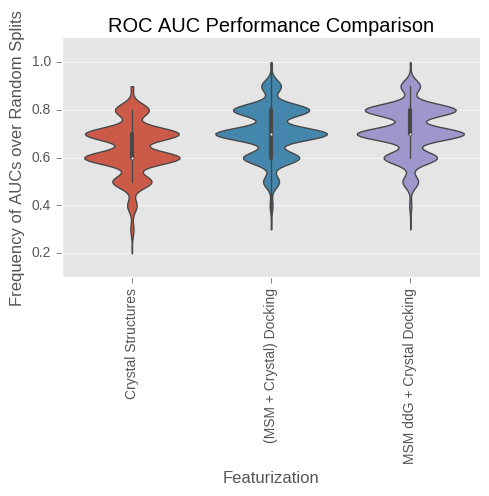

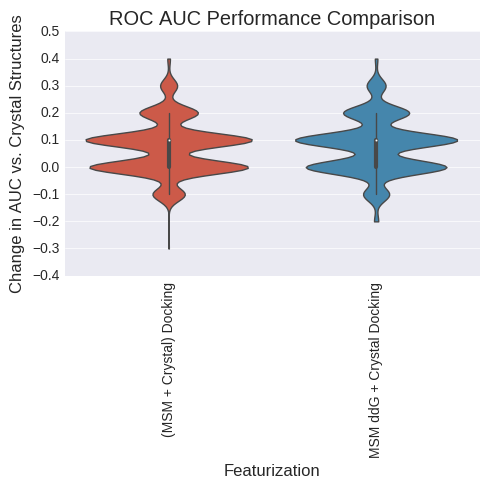

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures            0.72100           0.00000   
(MSM + Crystal) Docking       0.84325           0.12225   
MSM ddG + Crystal Docking     0.83625           0.11525   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking      (0.3677236316, 0.447502325072)  
MSM ddG + Crystal Docking  (0.357950733106, 0.437407046864)  


ValueError: list.remove(x): x not in list

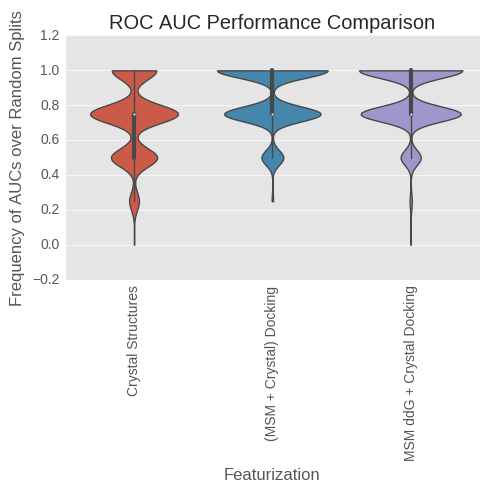

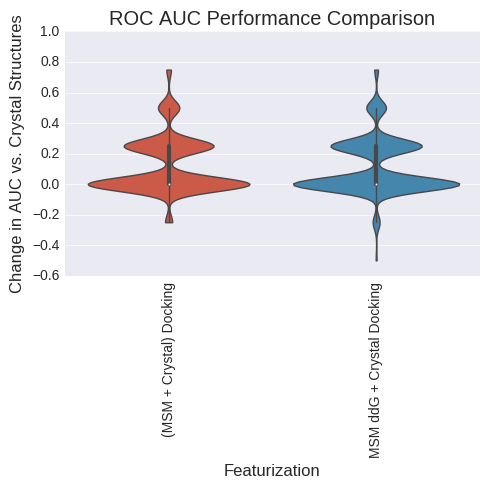

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.620443          0.000000   
(MSM + Crystal) Docking      0.706513          0.086071   
MSM ddG + Crystal Docking    0.697742          0.077299   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.521309567967, 0.601873127585)  
MSM ddG + Crystal Docking  (0.513286945506, 0.594001208684)  


ValueError: list.remove(x): x not in list

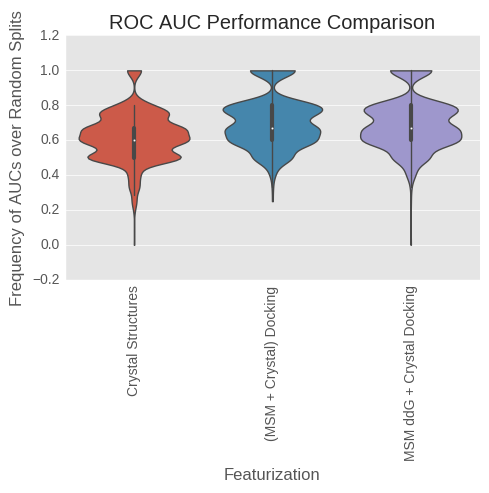

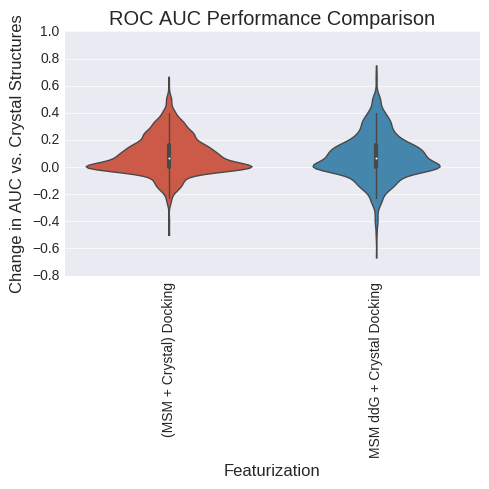

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.379557          0.000000   
(MSM + Crystal) Docking      0.293487         -0.086071   
MSM ddG + Crystal Docking    0.302258         -0.077299   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0888266306778, 0.140288113287)  
MSM ddG + Crystal Docking   (0.153628038128, 0.216550760421)  


ValueError: list.remove(x): x not in list

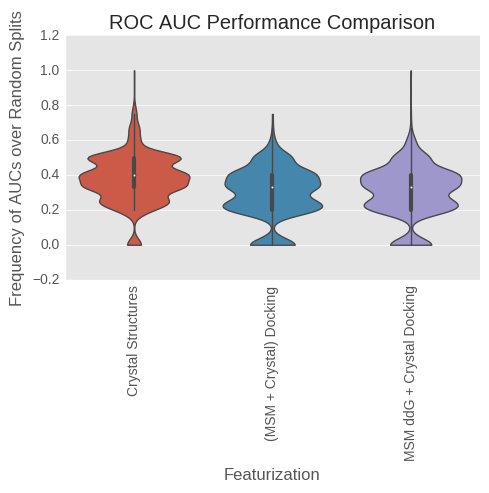

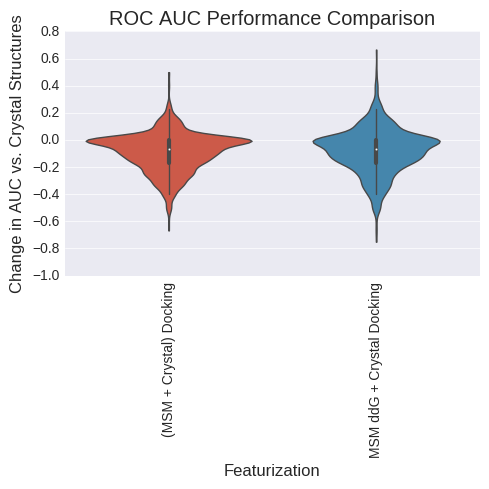

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures             0.6363            0.0000   
(MSM + Crystal) Docking        0.7077            0.0714   
MSM ddG + Crystal Docking      0.7140            0.0777   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.520306163672, 0.60088971421)  
MSM ddG + Crystal Docking  (0.553506434472, 0.633254426526)  


ValueError: list.remove(x): x not in list

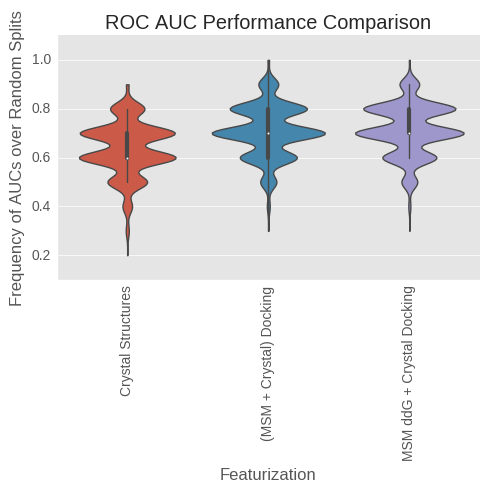

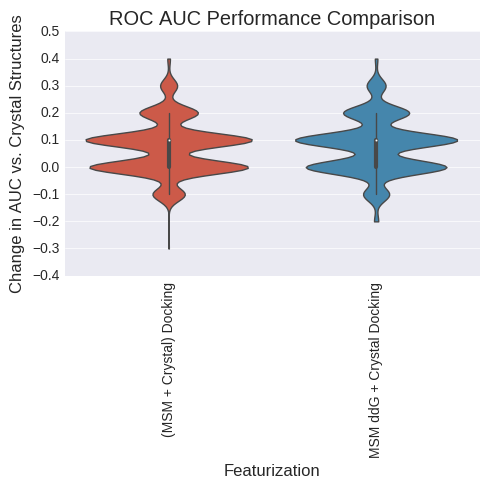

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.592611          0.000000   
(MSM + Crystal) Docking      0.646036          0.053425   
MSM ddG + Crystal Docking    0.649330          0.056719   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.485290191581, 0.566367067844)  
MSM ddG + Crystal Docking  (0.527333464647, 0.607770136927)  


ValueError: list.remove(x): x not in list

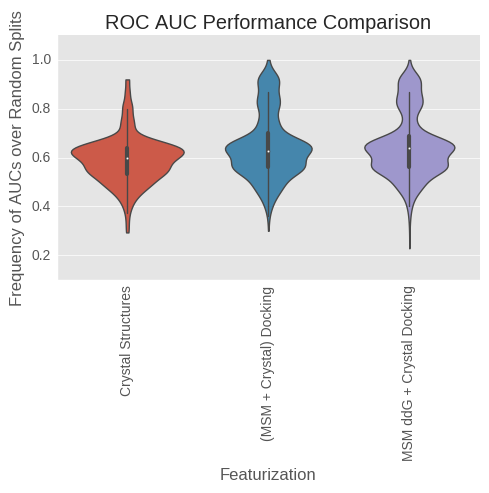

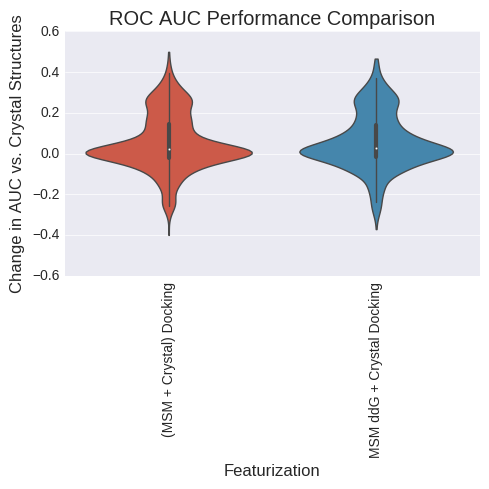

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.407389          0.000000   
(MSM + Crystal) Docking      0.353964         -0.053425   
MSM ddG + Crystal Docking    0.350670         -0.056719   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
(MSM + Crystal) Docking    (0.22688525018, 0.298265326644)  
MSM ddG + Crystal Docking  (0.23544081358, 0.307591122276)  


ValueError: list.remove(x): x not in list

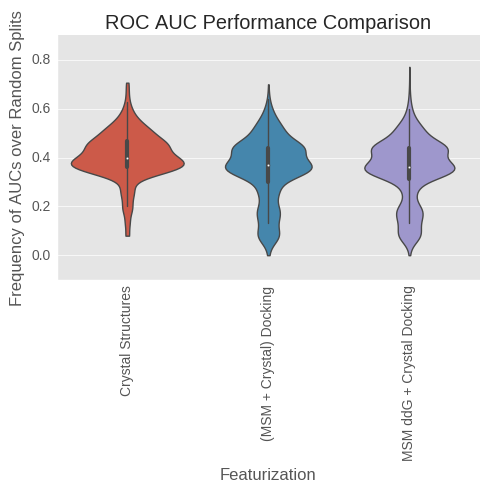

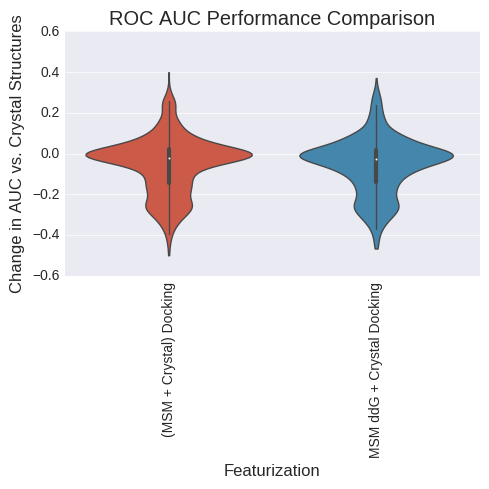

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.781729          0.000000   
(MSM + Crystal) Docking      0.869812          0.088083   
MSM ddG + Crystal Docking    0.868354          0.086625   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.694479647115, 0.76646205237)  
MSM ddG + Crystal Docking  (0.667629625978, 0.741654814082)  


ValueError: list.remove(x): x not in list

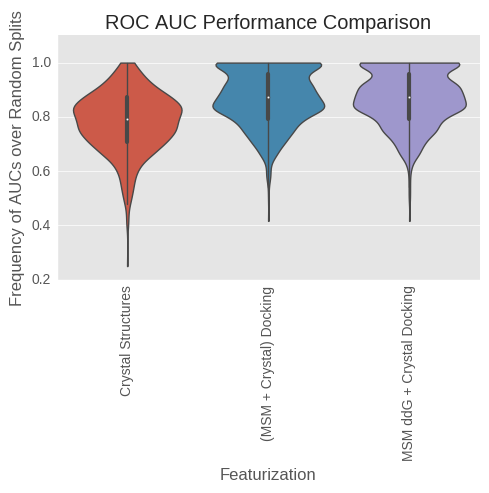

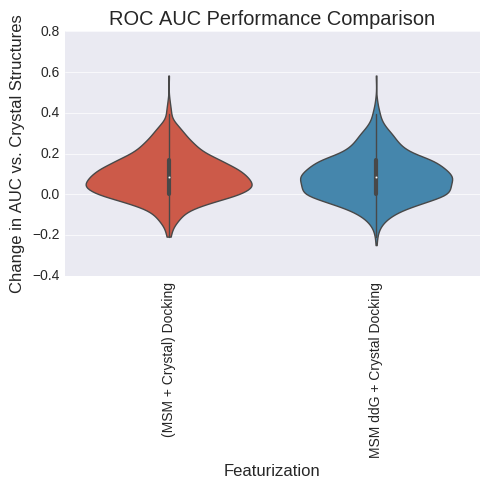

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.761910          0.000000   
(MSM + Crystal) Docking      0.849045          0.087135   
MSM ddG + Crystal Docking    0.858424          0.096514   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking      (0.800445284674, 0.8611649995)  
MSM ddG + Crystal Docking  (0.831511478554, 0.887716518056)  


ValueError: list.remove(x): x not in list

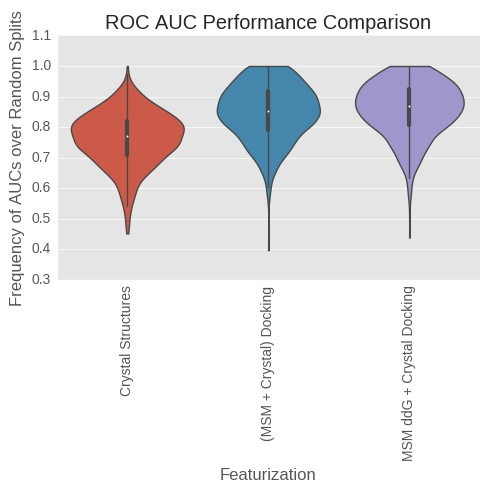

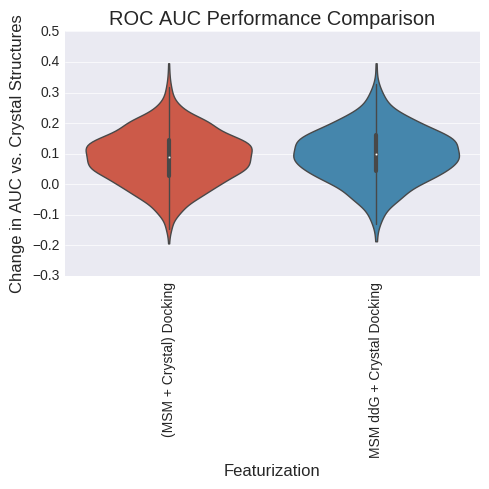

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.656712          0.000000   
(MSM + Crystal) Docking      0.752374          0.095662   
MSM ddG + Crystal Docking    0.791527          0.134816   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.639899267953, 0.715741095012)  
MSM ddG + Crystal Docking  (0.625578014931, 0.702246900651)  


ValueError: list.remove(x): x not in list

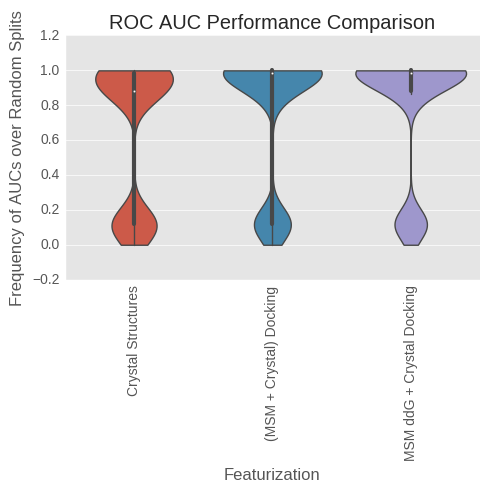

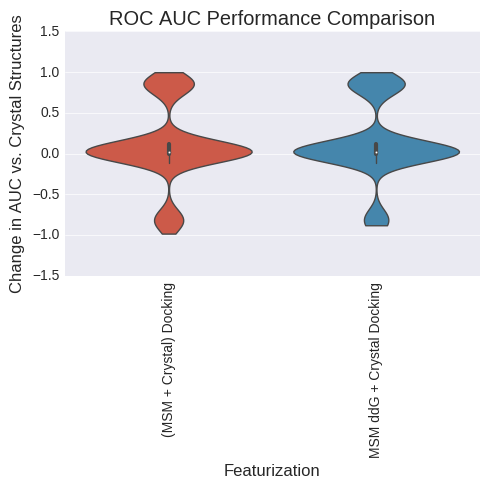

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/efficacy_scripts.py:1631: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  inplace=False)


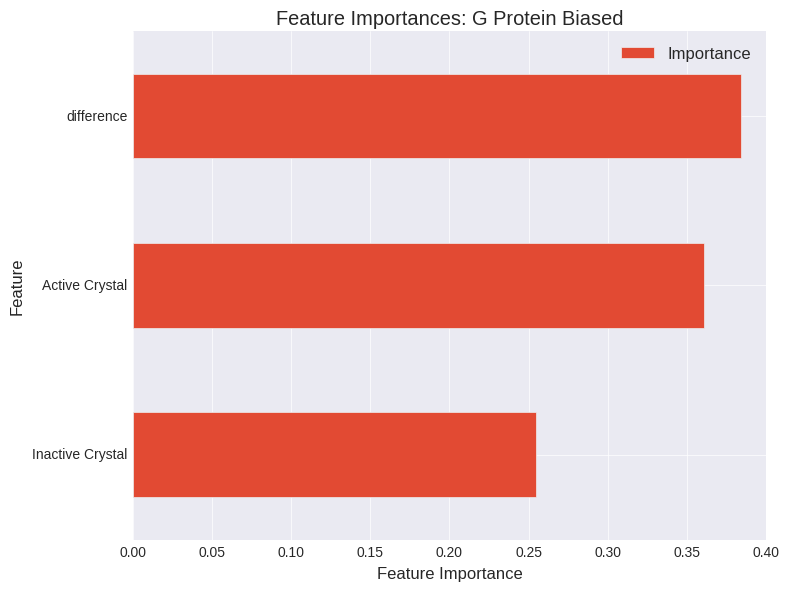

(55,)
(1, 55)


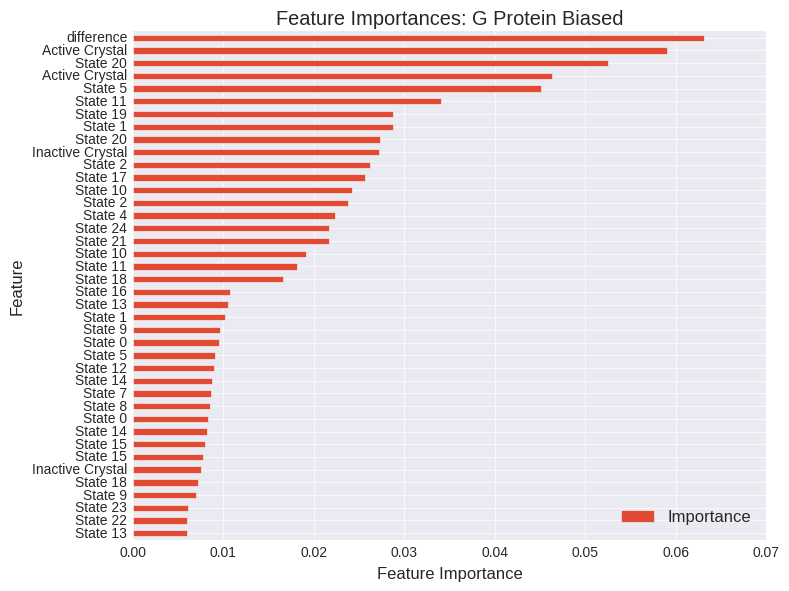

(105,)
(1, 105)


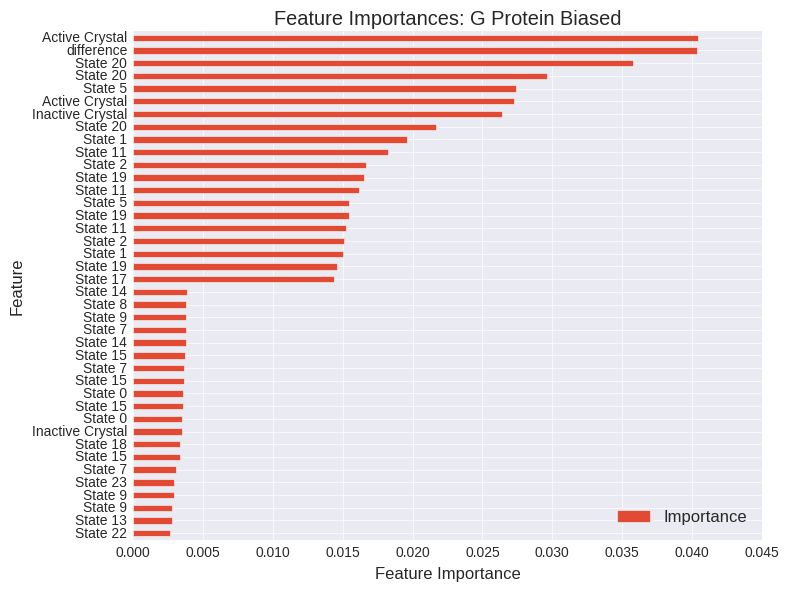

In [343]:
#SP, All ligands, RFR three class, 32 stereoisomers; new crystal grids; 25 clusters; with salmeterol
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes



analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.658018          0.000000   
(MSM + Crystal) Docking      0.775429          0.117411   
MSM ddG + Crystal Docking    0.770764          0.112746   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.490280258729, 0.571311089047)  
MSM ddG + Crystal Docking  (0.486287880891, 0.567356196204)  


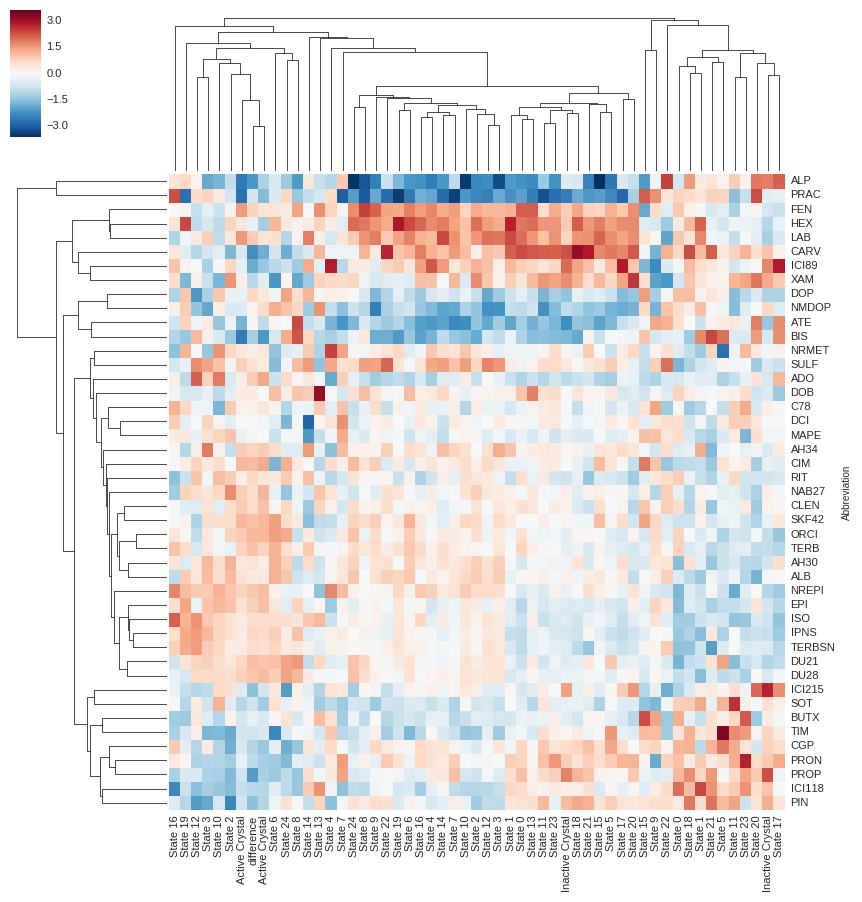

ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.444531          0.000000   
(MSM + Crystal) Docking      0.490582          0.046051   
MSM ddG + Crystal Docking    0.471548          0.027017   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.606201881764, 0.683873498084)  
MSM ddG + Crystal Docking   (0.57979454465, 0.658623575774)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.649444          0.000000   
(MSM + Crystal) Docking      0.703778          0.054333   
MSM ddG + Crystal Docking    0.721556          0.072111   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.39419487087, 0.474675162898)  
MSM ddG + Crystal Docking  (0.498272805682, 0.579213083456)  


ValueError: list.remove(x): x not in list

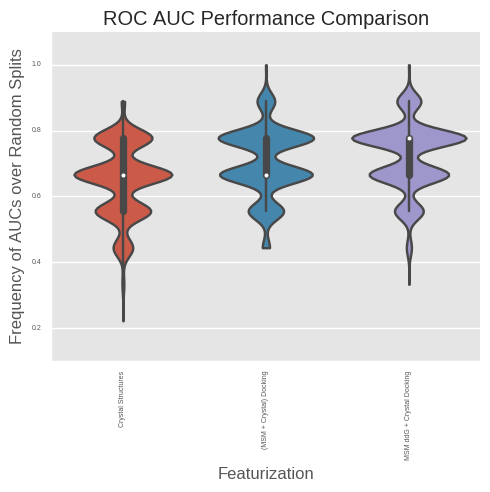

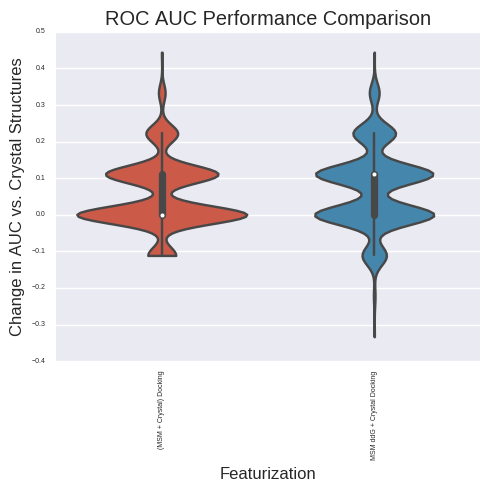

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.783333          0.000000   
(MSM + Crystal) Docking      0.899667          0.116333   
MSM ddG + Crystal Docking    0.901667          0.118333   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.285221505133, 0.361124949573)  
MSM ddG + Crystal Docking  (0.294858285184, 0.371356346223)  


ValueError: list.remove(x): x not in list

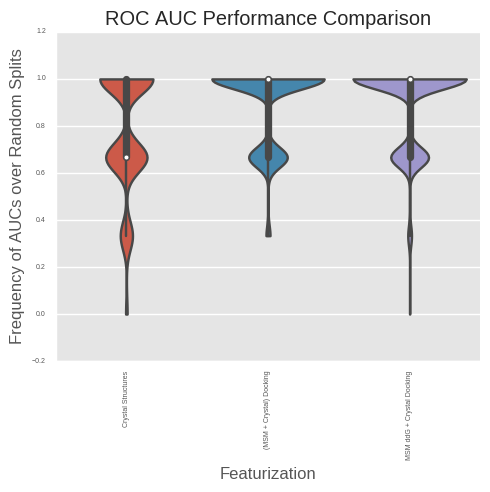

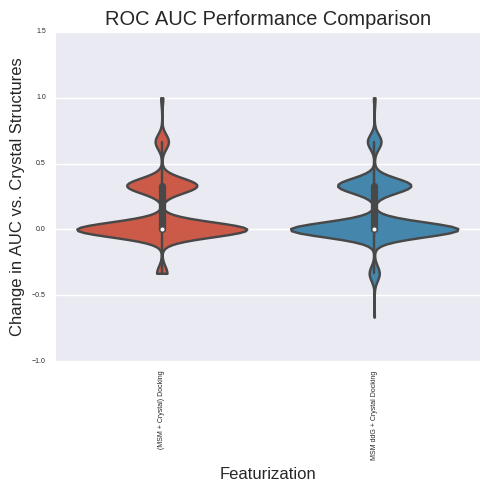

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.579252           0.00000   
(MSM + Crystal) Docking      0.653843           0.07459   
MSM ddG + Crystal Docking    0.663862           0.08461   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.404029824485, 0.484708385984)  
MSM ddG + Crystal Docking   (0.50227298352, 0.583160176298)  


ValueError: list.remove(x): x not in list

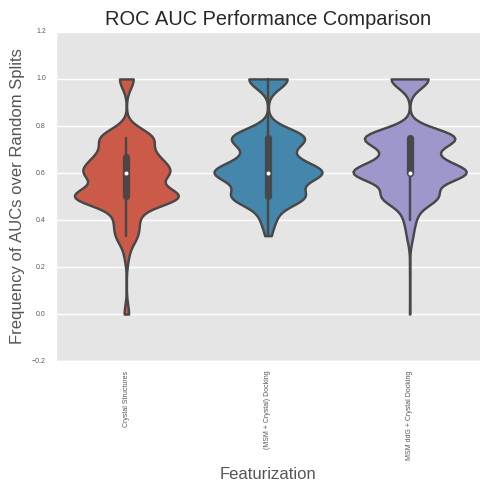

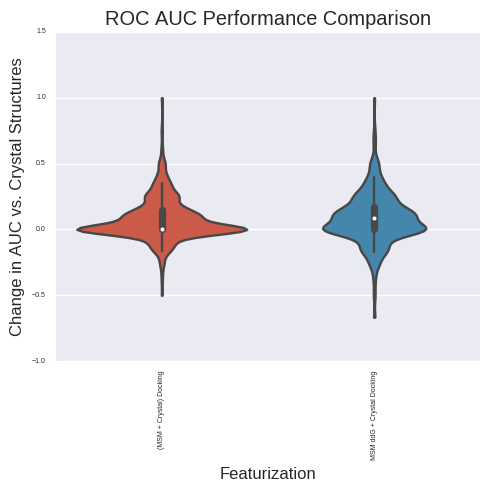

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.420748           0.00000   
(MSM + Crystal) Docking      0.346157          -0.07459   
MSM ddG + Crystal Docking    0.336138          -0.08461   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0897216203161, 0.141379941319)  
MSM ddG + Crystal Docking   (0.137913603134, 0.198489295022)  


ValueError: list.remove(x): x not in list

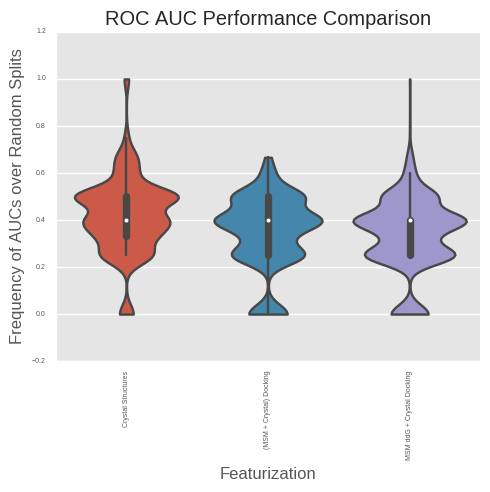

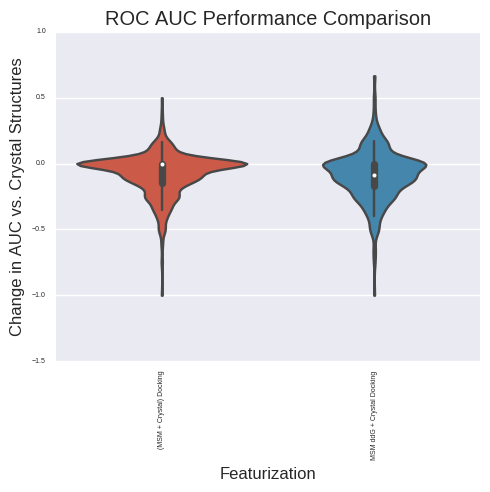

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.649444          0.000000   
(MSM + Crystal) Docking      0.703778          0.054333   
MSM ddG + Crystal Docking    0.721556          0.072111   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.39419487087, 0.474675162898)  
MSM ddG + Crystal Docking  (0.498272805682, 0.579213083456)  


ValueError: list.remove(x): x not in list

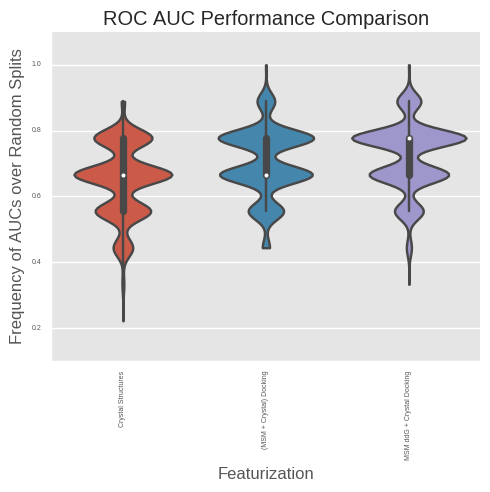

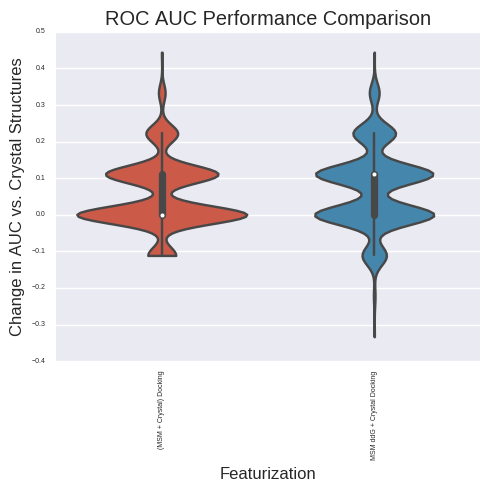

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.585406          0.000000   
(MSM + Crystal) Docking      0.635163          0.049757   
MSM ddG + Crystal Docking    0.646546          0.061139   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.405998791316, 0.486713054494)  
MSM ddG + Crystal Docking  (0.543426465795, 0.623466218501)  


ValueError: list.remove(x): x not in list

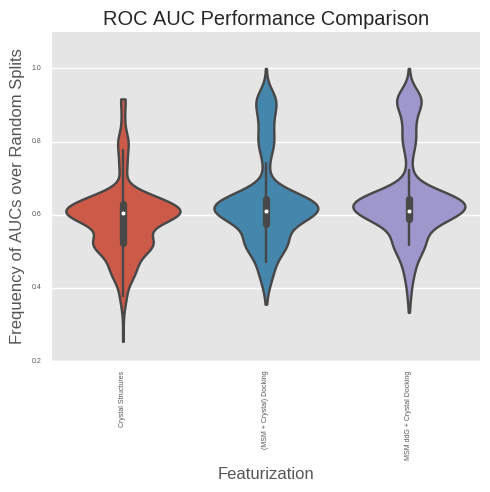

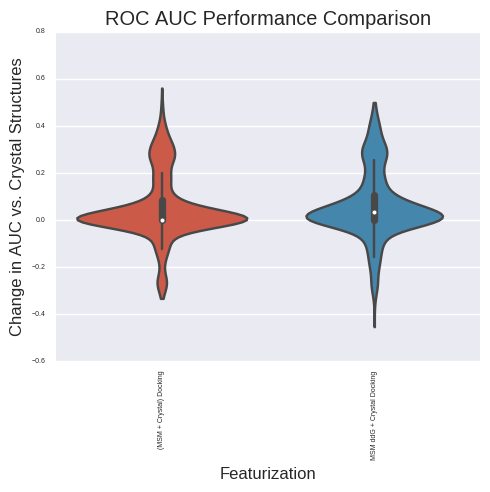

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.414594          0.000000   
(MSM + Crystal) Docking      0.364837         -0.049757   
MSM ddG + Crystal Docking    0.353454         -0.061139   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.127804498547, 0.186743405236)  
MSM ddG + Crystal Docking  (0.154555645965, 0.217609970254)  


ValueError: list.remove(x): x not in list

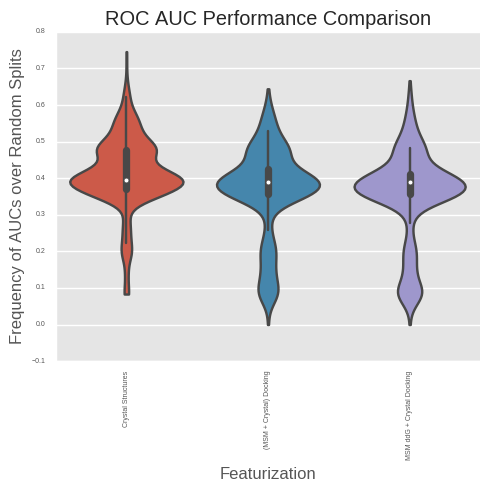

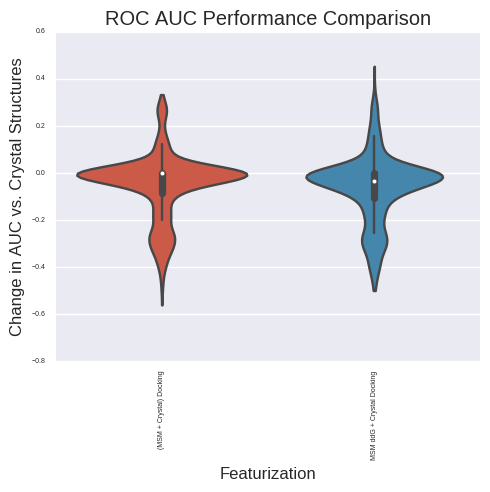

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.810972          0.000000   
(MSM + Crystal) Docking      0.891722          0.080750   
MSM ddG + Crystal Docking    0.894028          0.083056   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.629665918438, 0.706106267824)  
MSM ddG + Crystal Docking  (0.640923683338, 0.716703497297)  


ValueError: list.remove(x): x not in list

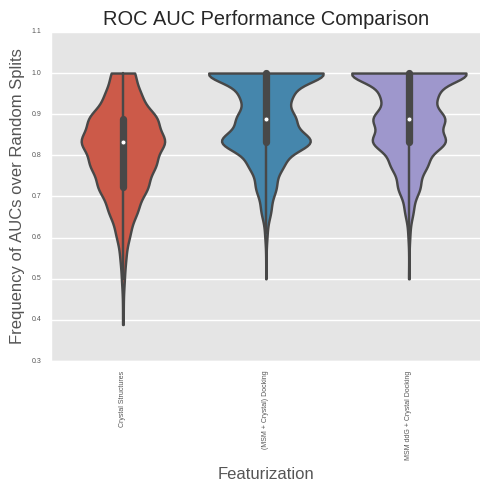

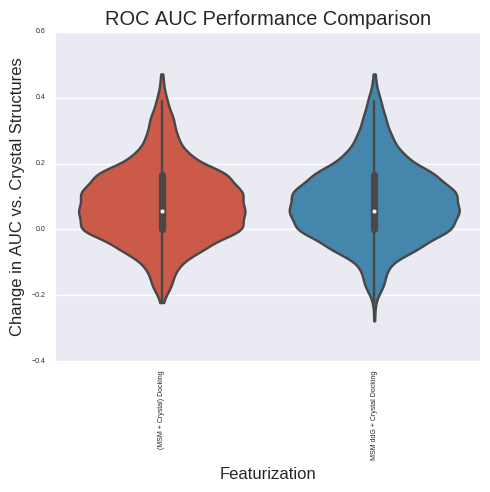

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.778938          0.000000   
(MSM + Crystal) Docking      0.860942          0.082004   
MSM ddG + Crystal Docking    0.870058          0.091120   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.769705776421, 0.834286795318)  
MSM ddG + Crystal Docking  (0.803642713348, 0.863928023837)  


ValueError: list.remove(x): x not in list

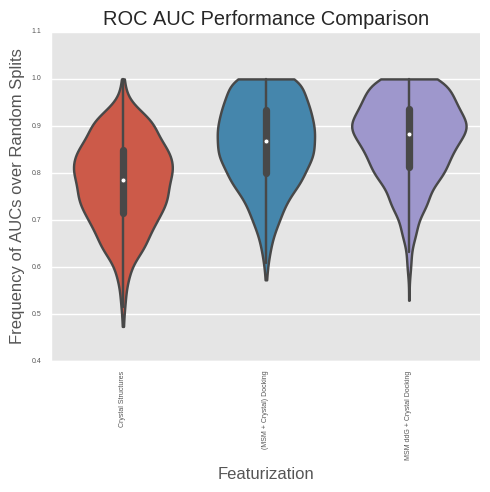

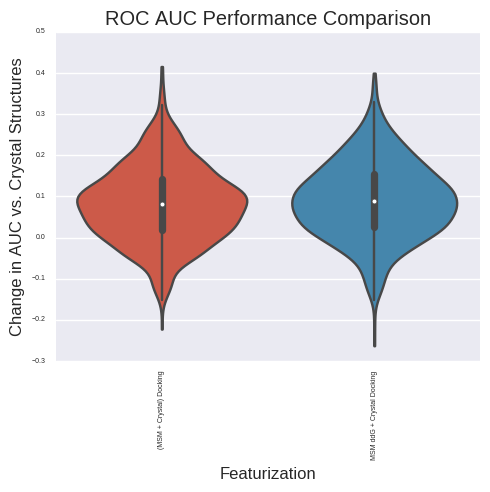

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.573796          0.000000   
(MSM + Crystal) Docking      0.707247          0.133451   
MSM ddG + Crystal Docking    0.755230          0.181434   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.57979454465, 0.658623575774)  
MSM ddG + Crystal Docking  (0.591967436599, 0.670292495867)  


ValueError: list.remove(x): x not in list

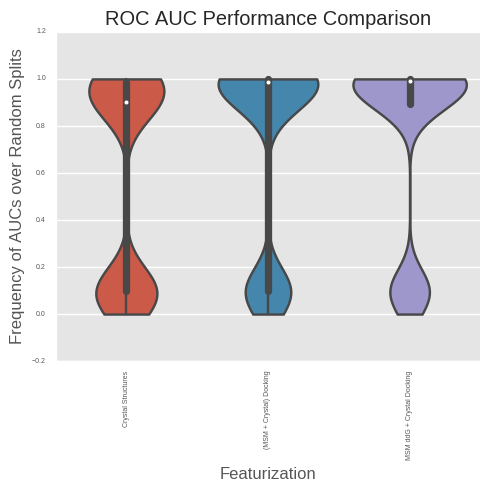

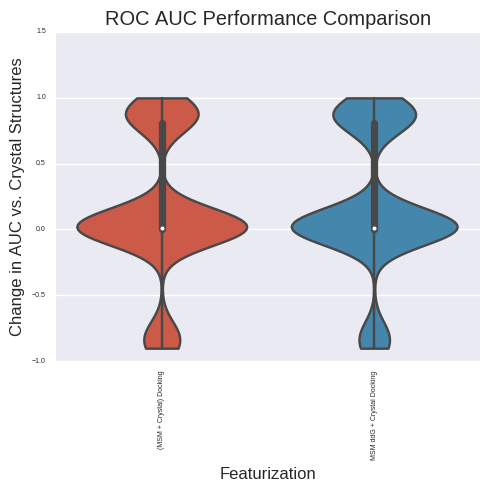

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


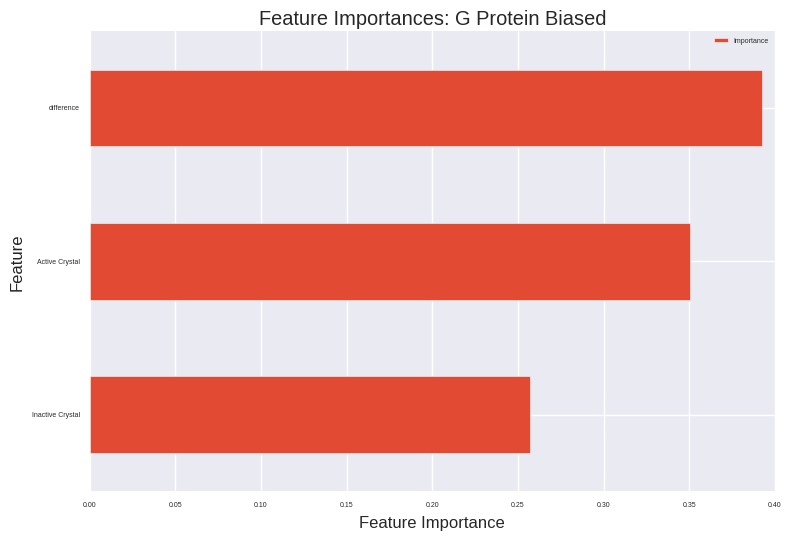

(55,)
(1, 55)


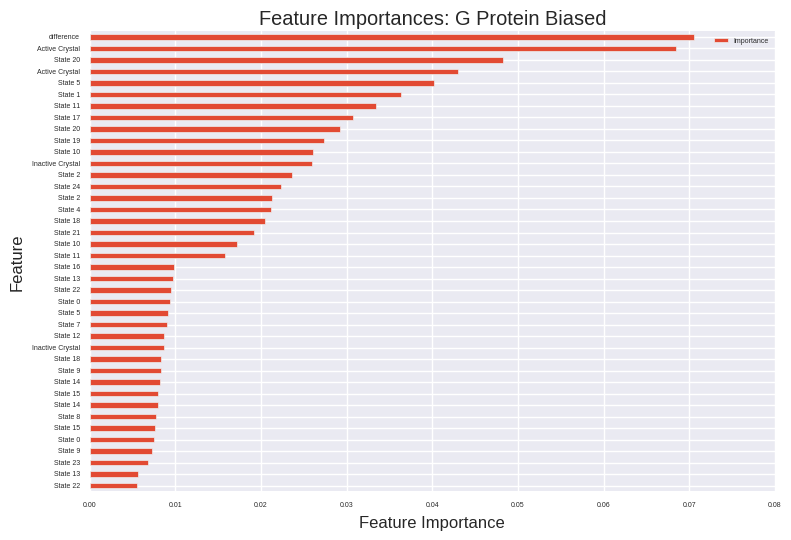

(105,)
(1, 105)


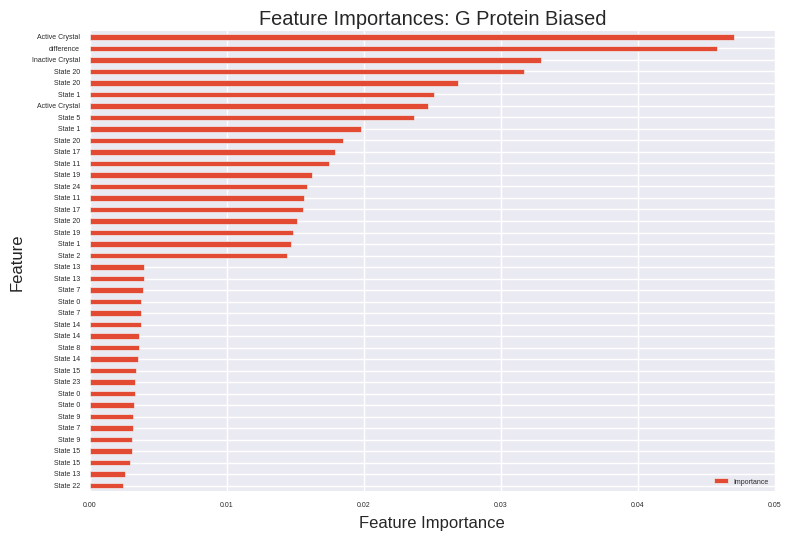

In [294]:
#XP, All ligands, RFR three class, 32 stereoisomers; new crystal grids; 25 clusters
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=True, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes


analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.665821          0.000000   
(MSM + Crystal) Docking      0.734712          0.068890   
MSM ddG + Crystal Docking    0.752515          0.086694   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.357950733106, 0.437407046864)  
MSM ddG + Crystal Docking  (0.422761439934, 0.503726306269)  


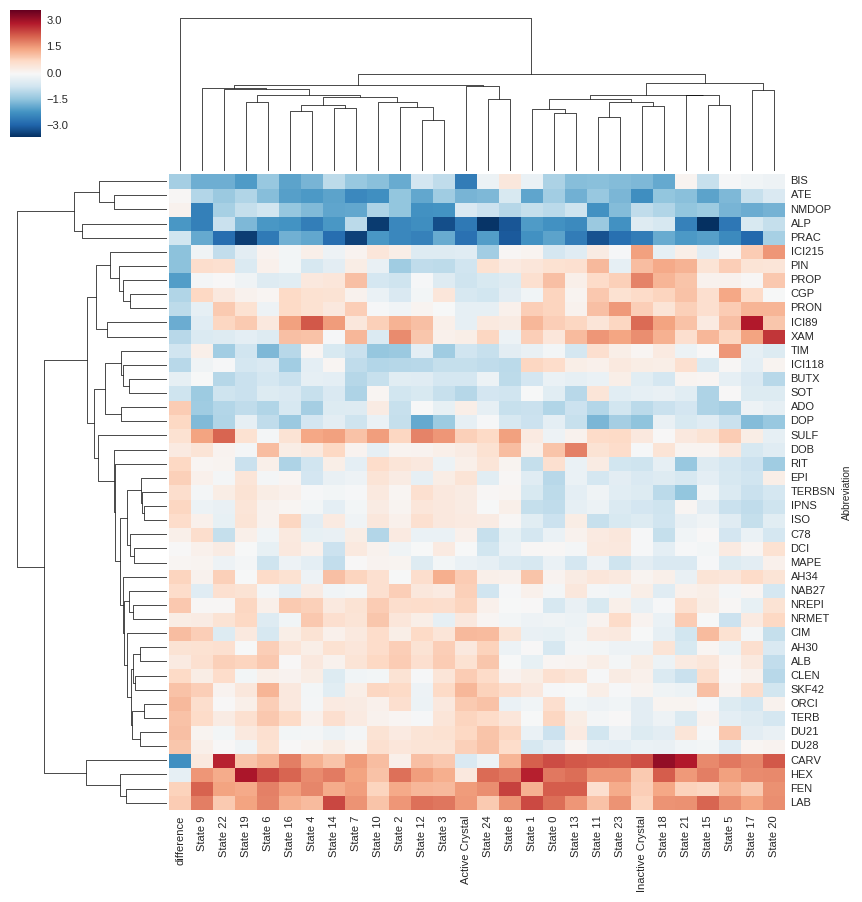

ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.446967          0.000000   
(MSM + Crystal) Docking      0.450629          0.003662   
MSM ddG + Crystal Docking    0.449769          0.002802   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.514289197634, 0.594985774227)  
MSM ddG + Crystal Docking  (0.466364819143, 0.547542904548)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.653778          0.000000   
(MSM + Crystal) Docking      0.674444          0.020667   
MSM ddG + Crystal Docking    0.715222          0.061444   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.269843926991, 0.344713444992)  
MSM ddG + Crystal Docking  (0.450472858943, 0.531645782025)  


ValueError: list.remove(x): x not in list

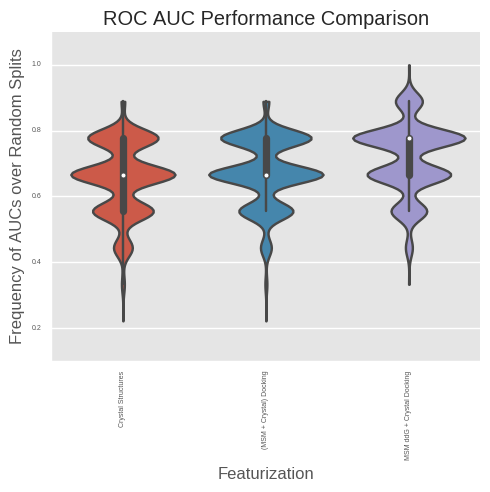

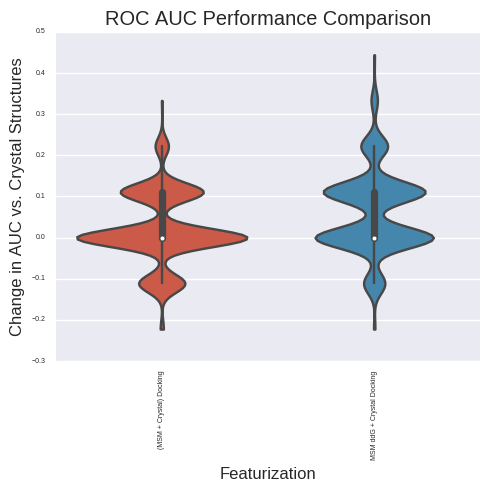

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.797000          0.000000   
(MSM + Crystal) Docking      0.850333          0.053333   
MSM ddG + Crystal Docking    0.876667          0.079667   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.216454629457, 0.286840952995)  
MSM ddG + Crystal Docking  (0.225935807277, 0.297227951877)  


ValueError: list.remove(x): x not in list

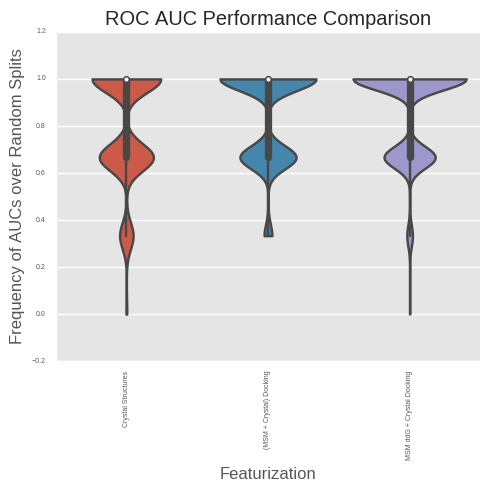

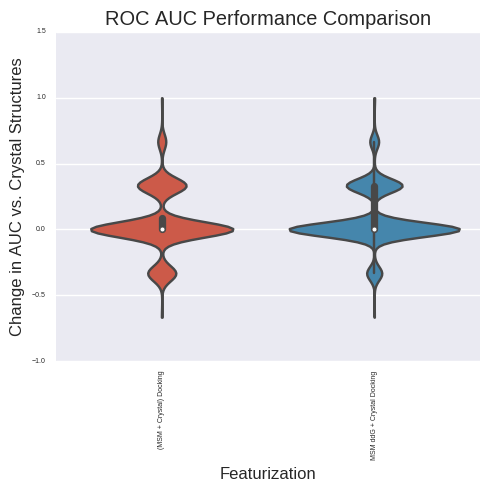

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.594267          0.000000   
(MSM + Crystal) Docking      0.633576          0.039310   
MSM ddG + Crystal Docking    0.677277          0.083011   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.318064456295, 0.395833799198)  
MSM ddG + Crystal Docking  (0.456427504571, 0.537612042418)  


ValueError: list.remove(x): x not in list

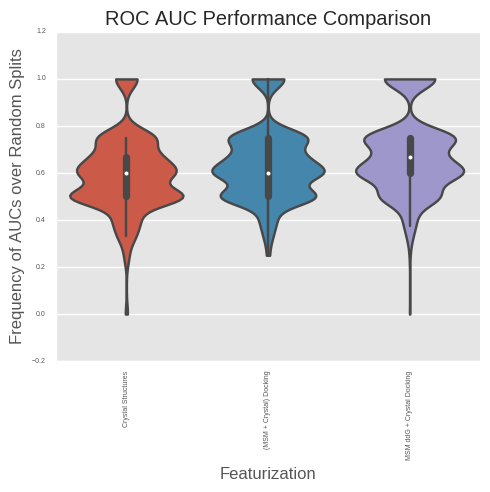

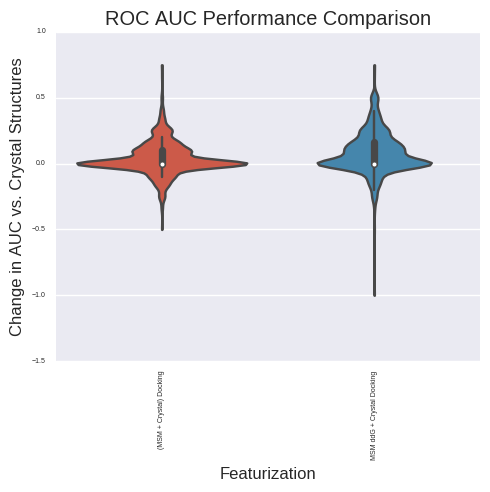

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.405733          0.000000   
(MSM + Crystal) Docking      0.366424         -0.039310   
MSM ddG + Crystal Docking    0.322723         -0.083011   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking      (0.12048424366, 0.178169118762)  
MSM ddG + Crystal Docking  (0.0790252528016, 0.128234496791)  


ValueError: list.remove(x): x not in list

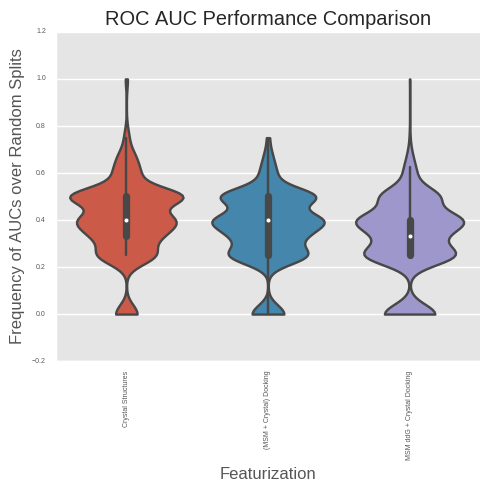

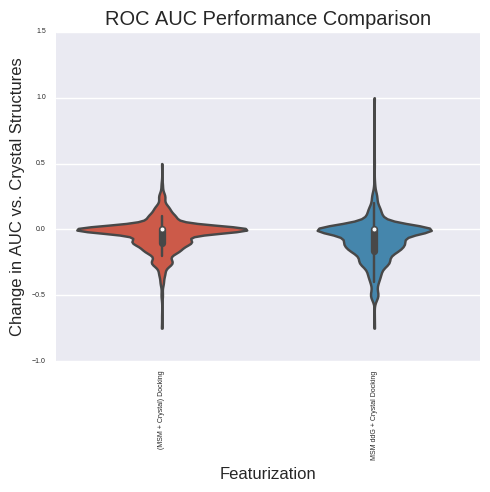

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.653778          0.000000   
(MSM + Crystal) Docking      0.674444          0.020667   
MSM ddG + Crystal Docking    0.715222          0.061444   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.269843926991, 0.344713444992)  
MSM ddG + Crystal Docking  (0.450472858943, 0.531645782025)  


ValueError: list.remove(x): x not in list

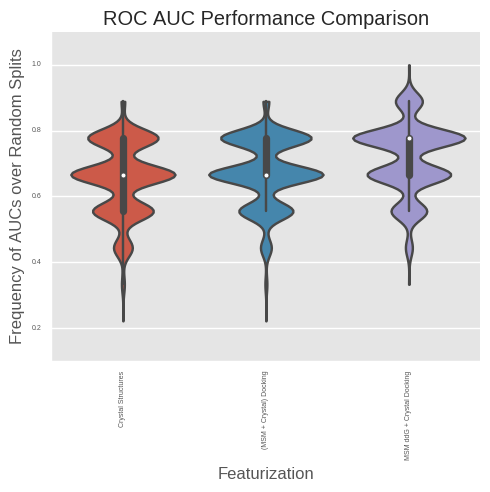

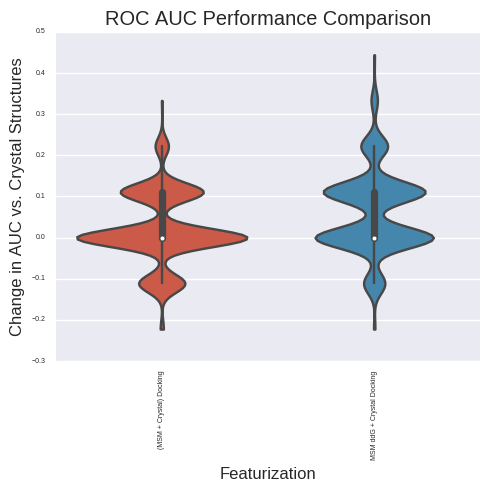

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.590450          0.000000   
(MSM + Crystal) Docking      0.597782          0.007332   
MSM ddG + Crystal Docking    0.644451          0.054001   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.282334298764, 0.358051702931)  
MSM ddG + Crystal Docking  (0.452457095452, 0.533635180857)  


ValueError: list.remove(x): x not in list

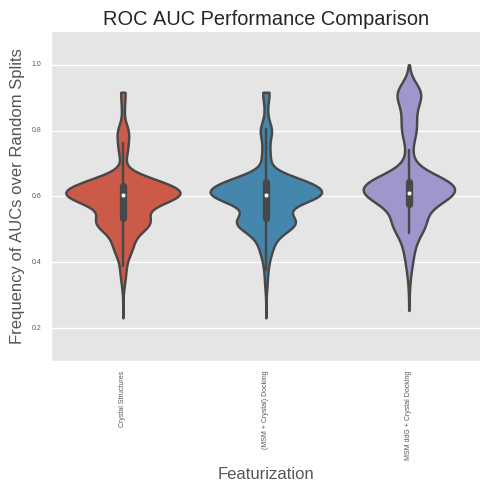

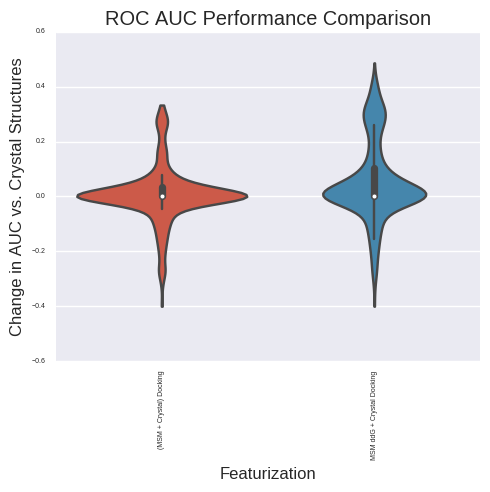

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.409550          0.000000   
(MSM + Crystal) Docking      0.402218         -0.007332   
MSM ddG + Crystal Docking    0.355549         -0.054001   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.19850946321, 0.267036583508)  
MSM ddG + Crystal Docking  (0.170375998288, 0.235565518324)  


ValueError: list.remove(x): x not in list

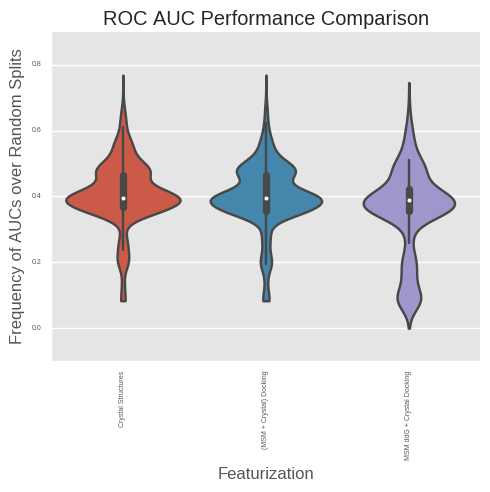

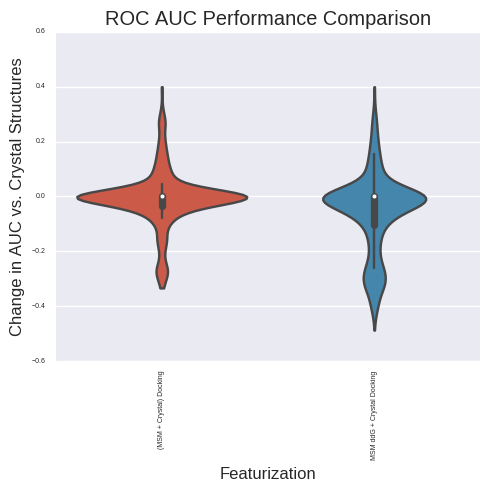

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.811139          0.000000   
(MSM + Crystal) Docking      0.867750          0.056611   
MSM ddG + Crystal Docking    0.878417          0.067278   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.55653373502, 0.636187578989)  
MSM ddG + Crystal Docking  (0.588921808438, 0.667377671017)  


ValueError: list.remove(x): x not in list

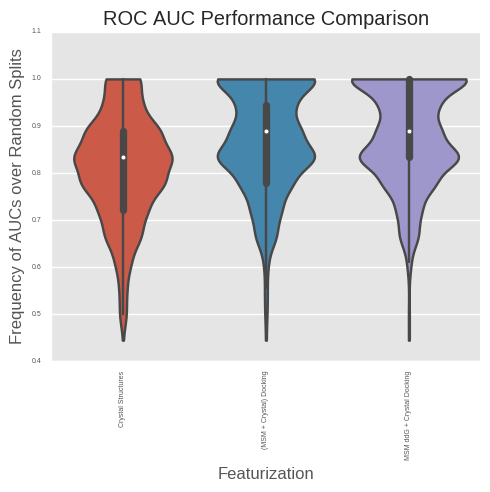

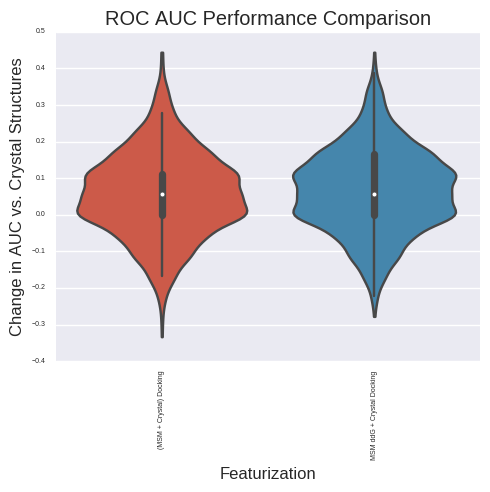

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.776032          0.000000   
(MSM + Crystal) Docking      0.811714          0.035682   
MSM ddG + Crystal Docking    0.852906          0.076874   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.604166200802, 0.681935543705)  
MSM ddG + Crystal Docking  (0.754965641835, 0.821211482521)  


ValueError: list.remove(x): x not in list

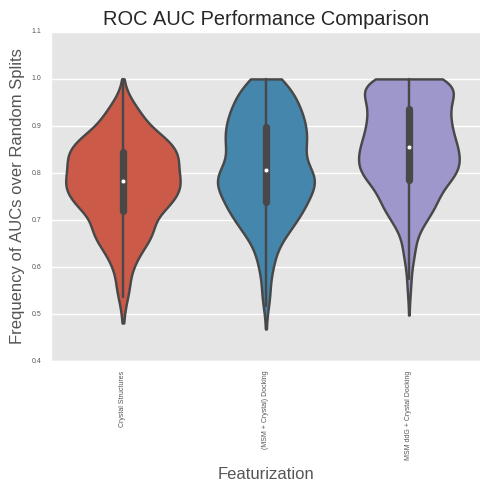

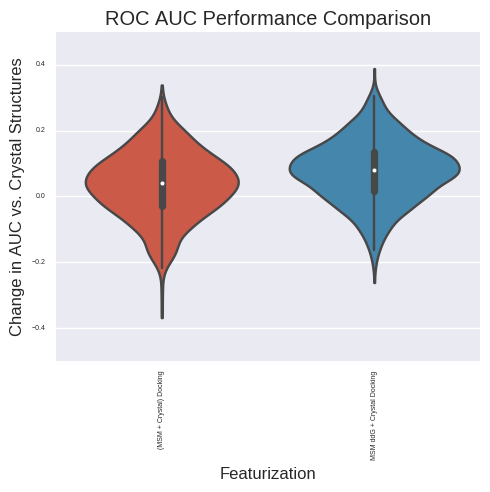

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.560119          0.000000   
(MSM + Crystal) Docking      0.654667          0.094549   
MSM ddG + Crystal Docking    0.669717          0.109598   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.627621581926, 0.704176968996)  
MSM ddG + Crystal Docking   (0.548464334717, 0.62836243793)  


ValueError: list.remove(x): x not in list

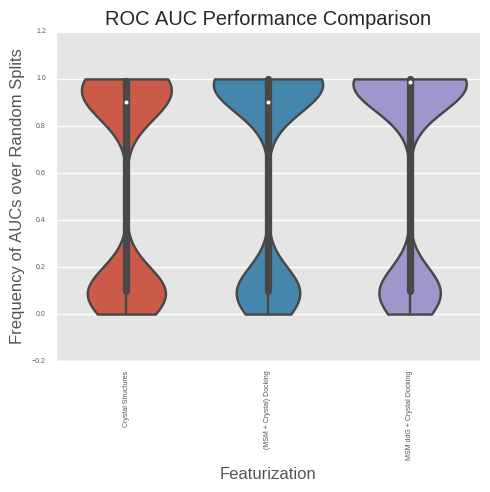

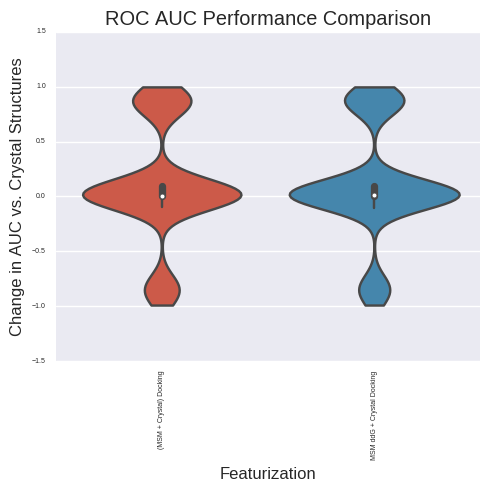

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


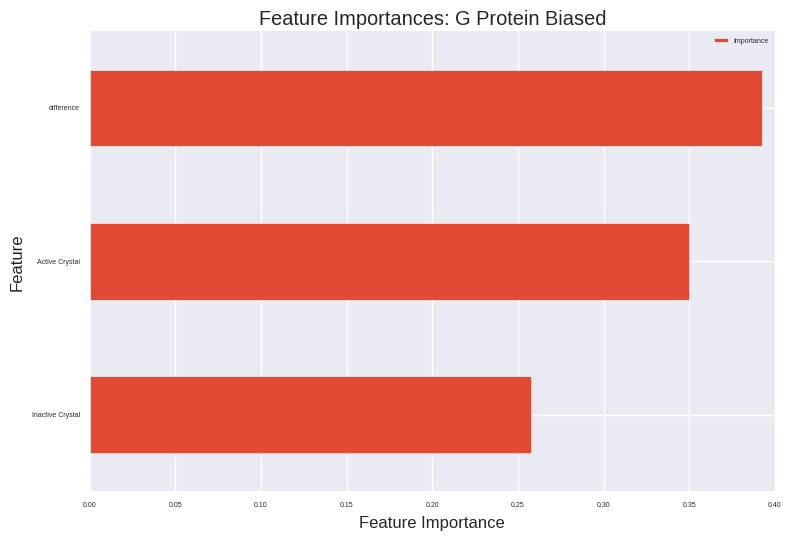

(28,)
(1, 28)


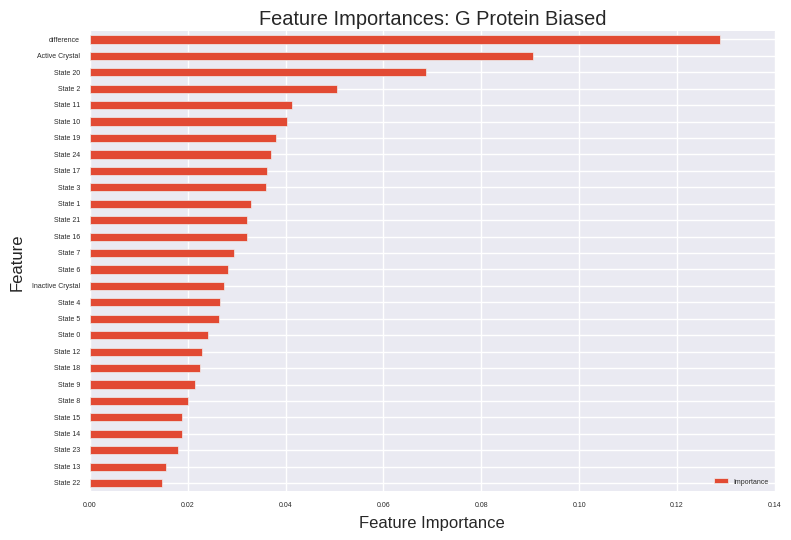

(53,)
(1, 53)


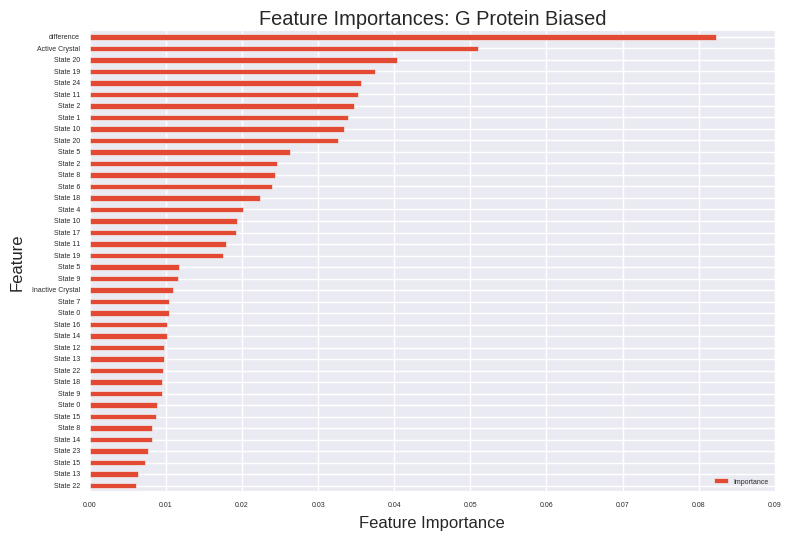

In [316]:
#XP, All ligands, RFR three class, 32 stereoisomers; new crystal grids; 25 clusters; no norm
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["Abbreviation"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=True, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes



In [202]:
def custom_lim_finder(values, n_stds=1.):
    mins = np.min(values, axis=0)
    maxs = np.max(values, axis=0)
    stds = np.std(values, axis=0)
    custom_lims = [[mins[i] - n_stds*stds[i], maxs[i] + n_stds*stds[i]] for i in range(0,len(mins))]
    return custom_lims

rf_model = results_dict[save_name]
#features_eq_conc = pd.concat(all_feature_dfs, axis=0)[["tIC.1", "tIC.2"]]
cid = "CID_71739"
lig_name = "CARA"
features_eq_conc = lig_features_eq[cid][["tIC.1", "tIC.2"]]

custom_lims = custom_lim_finder([features_eq_conc[["tIC.1", "tIC.2"]].values])

In [203]:
refcoords_py3 = '/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_py3_regularization_wolf_autoShrinkage_rho0pt01/reference_receptors/refcoords.csv'
ref_tica = np.array(pd.read_csv(refcoords_py3, index_col=None, header=None))
ref_tica

cols = ["tIC.1", "tIC.2"]
custom_lims = custom_lim_finder(features_eq_conc[cols].values, n_stds=1.5)



hi
(2, 20002)
Computed 2D KDE
min_density=0.0
Computed Density. Now plotting.
(0.0, 10.0)


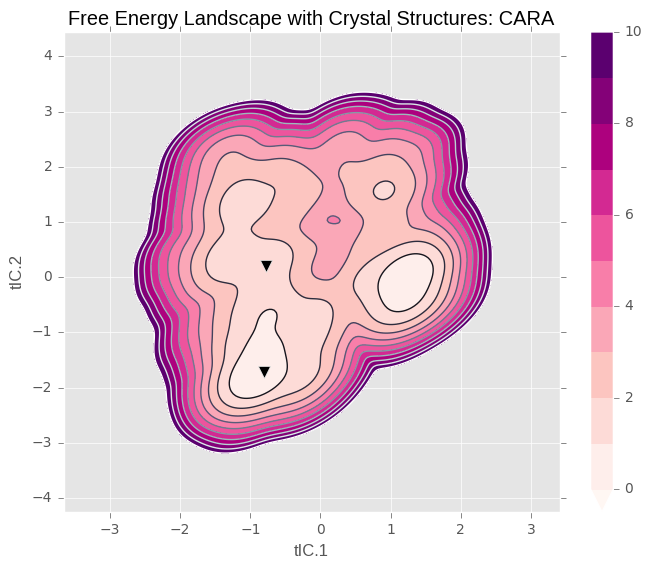

In [205]:
from jointplot_d3 import *
jointplot((0,1), features_eq_conc[cols].values, save_dir=analysis_dir, titles=cols,
              main="Free Energy Landscape with Crystal Structures: %s" %lig_name, custom_lims=custom_lims,
              max_tIC=5, min_density=None, max_diff=10., n_levels=11, n_pts=200j,
              remake=True, refcoords=ref_tica,
              cmap=plt.cm.get_cmap("RdPu"))

hi
(2, 20001)
Computed 2D KDE
min_density=0.0
Computed Density. Now plotting.
(0.0, 10.0)


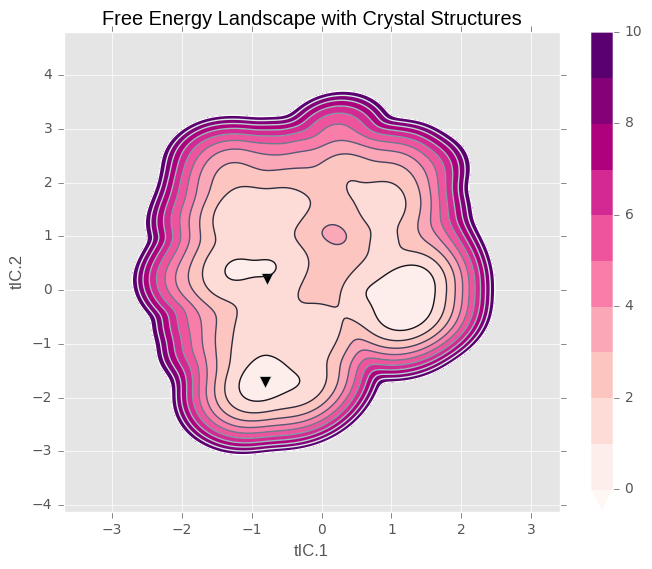

In [75]:
from jointplot_d3 import *
jointplot((0,1), features_eq_conc[cols].values, save_dir=analysis_dir, titles=cols,
              main="Free Energy Landscape with Crystal Structures: %s" %lig_name, custom_lims=custom_lims,
              max_tIC=5, min_density=None, max_diff=10., n_levels=11, n_pts=20j,
              remake=True, refcoords=ref_tica,
              cmap=plt.cm.get_cmap("RdPu"))

hi
(2, 20001)
Computed 2D KDE
min_density=0.0
Computed Density. Now plotting.
(0.0, 10.0)


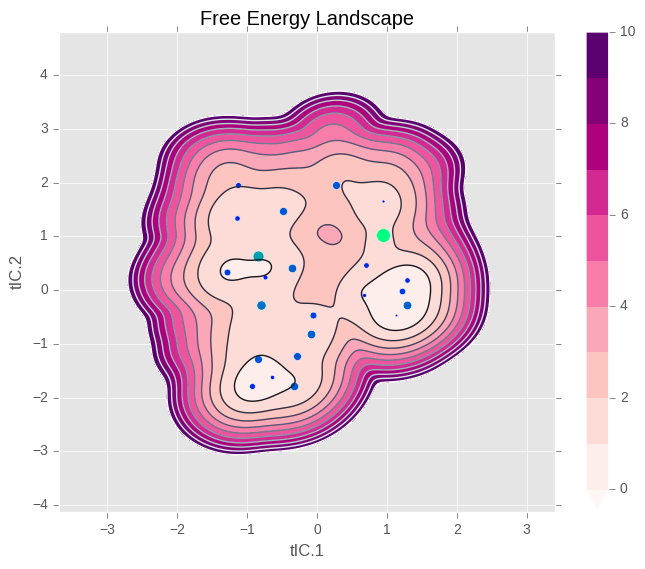

In [332]:
from jointplot_d3 import *

new_cols = [n for n in full_docking_df.columns.values if "state" in n.lower()]
importance_df = pd.DataFrame(rf_model['(MSM + Crystal) Docking'][1].reshape((-1,1)), index=full_docking_df.columns, columns=["feature_importance"])
importance_df = importance_df.loc[new_cols]
coords_df = pd.DataFrame(clusterer.cluster_centers_, index=["State %d" %i for i in range(0, n_clusters)], columns=["tIC.%d" %j for j in range(1,3)])
coords_df = coords_df.loc[importance_df.index]

df = pd.concat([coords_df, importance_df], axis=1).sort("feature_importance", ascending=False, inplace=False)
df["feature_importance"]


jointplot((0,1), features_eq_conc[cols].values, save_dir=analysis_dir, titles=cols,
              main="Free Energy Landscape", custom_lims=custom_lims,
              max_tIC=5, min_density=None, max_diff=10., n_levels=11, n_pts=200j,
              remake=True, superpose_circles={"radii": importance_df.values, "coords": coords_df[cols].values},
              cmap=plt.cm.get_cmap("RdPu"))

#jointplot((0,1), lig_features_eq["3p0g_lig"][["tIC.1", "tIC.2"]].values, save_dir=analysis_dir, make_animation=False, trajectory=None, video_file=None, titles=["tIC.1", "tIC.2"],
#              main="MSM Based Free Energy of B2AR bound to BI-167107", include_1d_kde=False, custom_lims=None, custom_lims_j=None, axes=None, data_j=None, titles_j=None, refcoords=None, 
#              refcoords_j=None, max_tIC=5, min_density=None, max_diff=5., tpt_paths=None, tpt_paths_j=None, n_levels=11, n_pts=200j,
#              all_apo_data=None, remake=True, min_i=None)



In [356]:
cluster_features_averages[["tIC.1", "tIC.2"]].sort("tIC.1", ascending=False, inplace=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,tIC.1,tIC.2
cluster18,1.291122,0.203839
cluster10,1.283093,-0.295647
cluster0,1.214025,-0.027302
cluster13,1.117396,-0.470313
cluster20,0.925695,0.995703
cluster23,0.901806,1.660999
cluster12,0.720541,0.437515
cluster14,0.675180,-0.096553
cluster3,0.293050,1.977974
cluster6,-0.069492,-0.466138


analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.630307          0.000000   
(MSM + Crystal) Docking      0.677025          0.046718   
MSM ddG + Crystal Docking    0.699171          0.068864   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.342349986166, 0.421218711081)  
MSM ddG + Crystal Docking  (0.404029824485, 0.484708385984)  


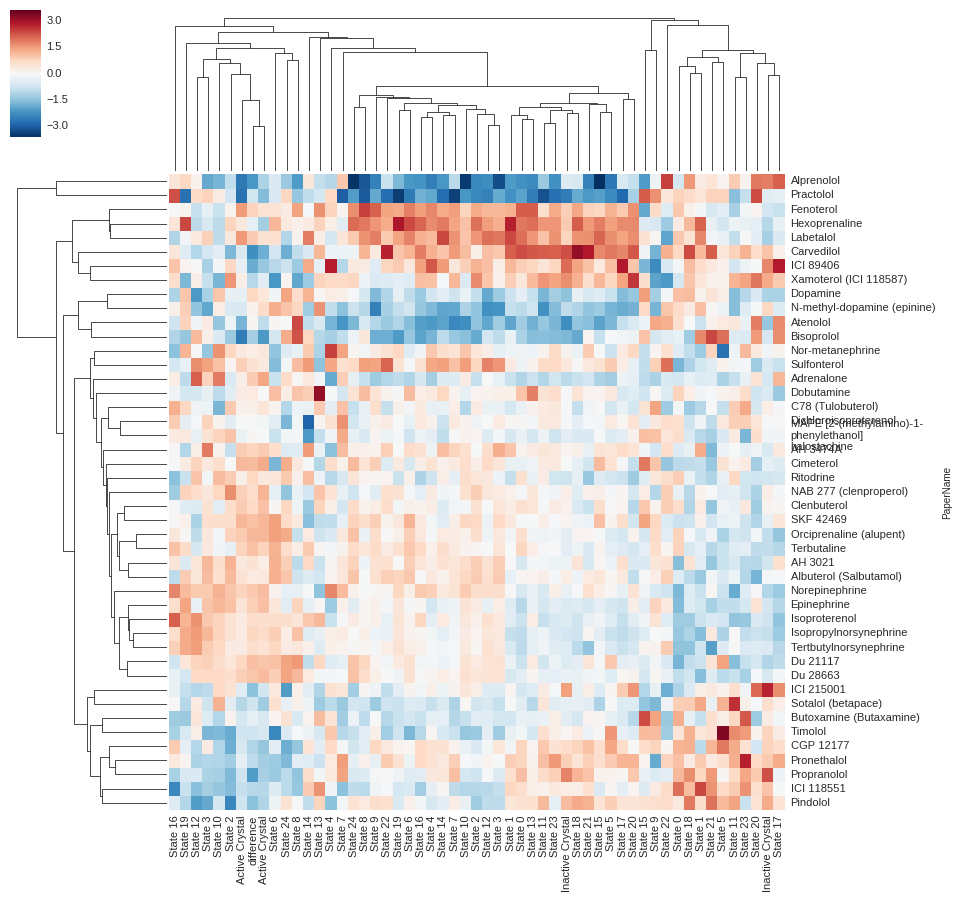

ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.475993          0.000000   
(MSM + Crystal) Docking      0.457103         -0.018890   
MSM ddG + Crystal Docking    0.476040          0.000048   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.472334952356, 0.553493677357)  
MSM ddG + Crystal Docking  (0.510281173582, 0.591046527598)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.692222          0.000000   
(MSM + Crystal) Docking      0.673889         -0.018333   
MSM ddG + Crystal Docking    0.692333          0.000111   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.168509933878, 0.233457947393)  
MSM ddG + Crystal Docking  (0.227834930413, 0.299302464081)  


ValueError: list.remove(x): x not in list

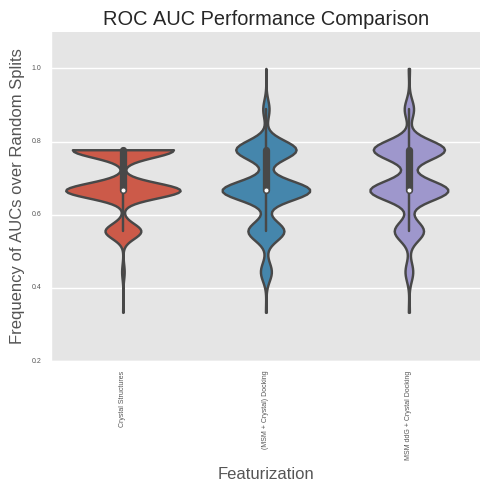

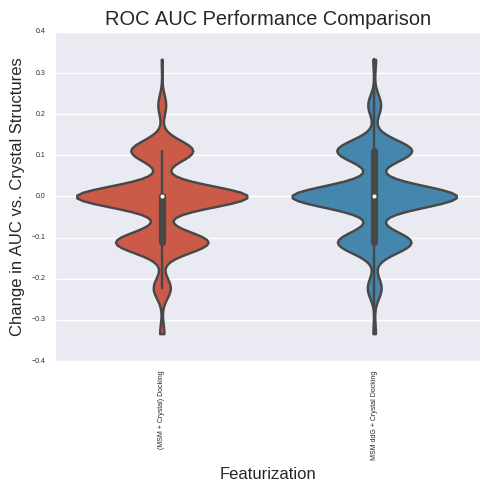

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.920000          0.000000   
(MSM + Crystal) Docking      0.831000         -0.089000   
MSM ddG + Crystal Docking    0.844333         -0.075667   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0719514491584, 0.119413759073)  
MSM ddG + Crystal Docking  (0.0763668714963, 0.124932425086)  


ValueError: list.remove(x): x not in list

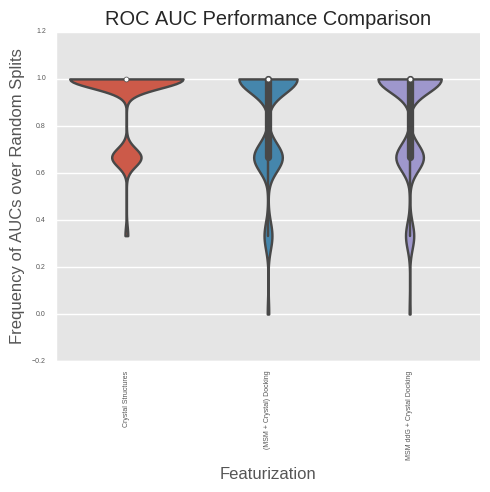

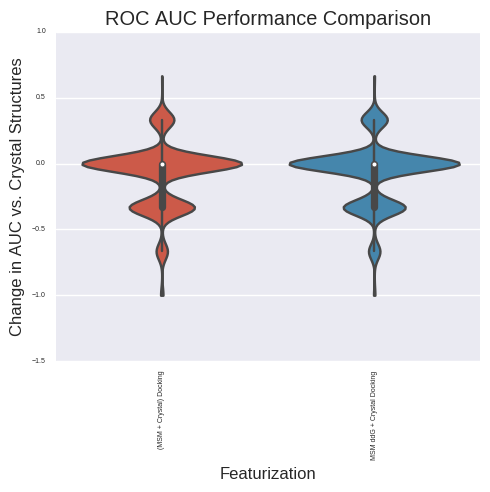

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.580327          0.000000   
(MSM + Crystal) Docking      0.579515         -0.000812   
MSM ddG + Crystal Docking    0.602995          0.022668   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.292929372415, 0.369311623652)  
MSM ddG + Crystal Docking   (0.341376424226, 0.42020545535)  


ValueError: list.remove(x): x not in list

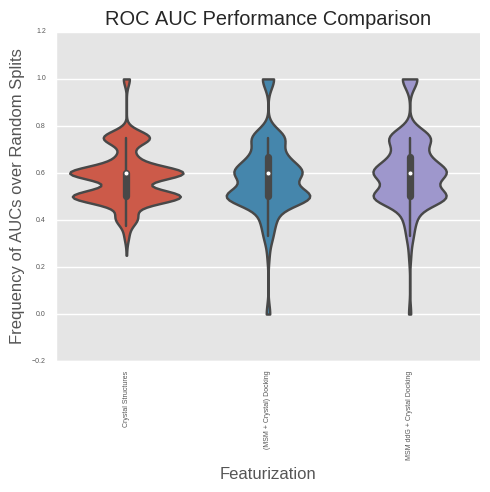

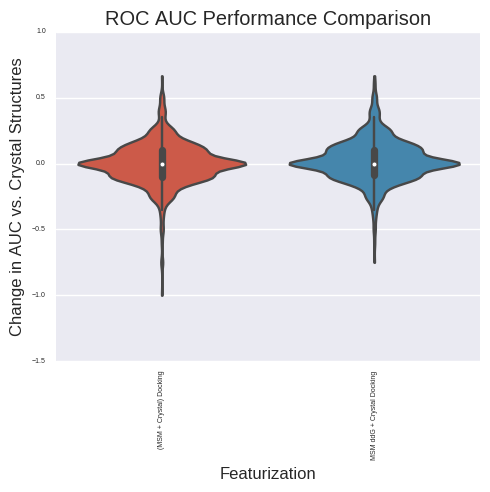

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.419673          0.000000   
(MSM + Crystal) Docking      0.420485          0.000812   
MSM ddG + Crystal Docking    0.397005         -0.022668   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.298718421021, 0.375443481067)  
MSM ddG + Crystal Docking  (0.251651671235, 0.325156165014)  


ValueError: list.remove(x): x not in list

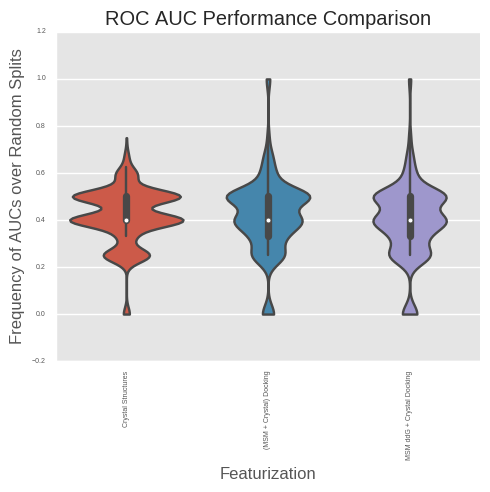

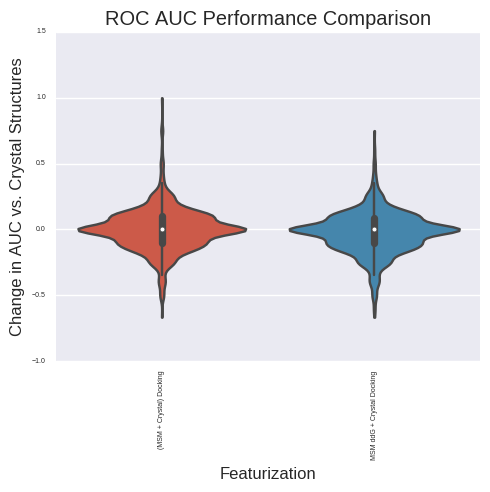

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.692222          0.000000   
(MSM + Crystal) Docking      0.673889         -0.018333   
MSM ddG + Crystal Docking    0.692333          0.000111   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.168509933878, 0.233457947393)  
MSM ddG + Crystal Docking  (0.227834930413, 0.299302464081)  


ValueError: list.remove(x): x not in list

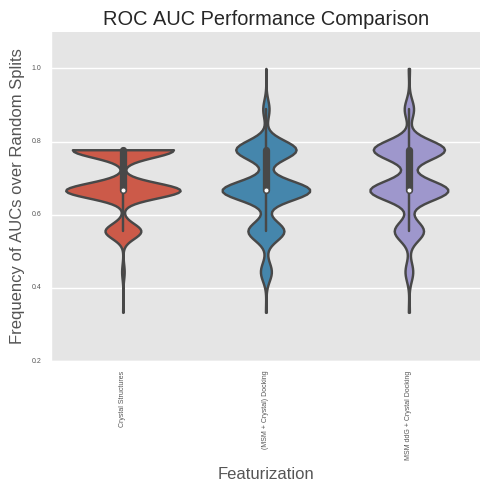

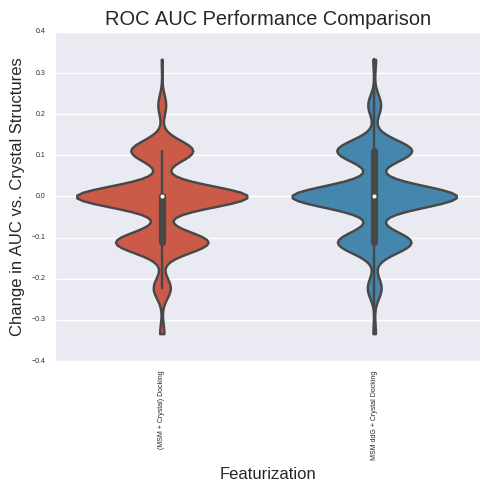

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.577652          0.000000   
(MSM + Crystal) Docking      0.604476          0.026824   
MSM ddG + Crystal Docking    0.619861          0.042209   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.375554200244, 0.455566297789)  
MSM ddG + Crystal Docking  (0.417826352474, 0.498727305378)  


ValueError: list.remove(x): x not in list

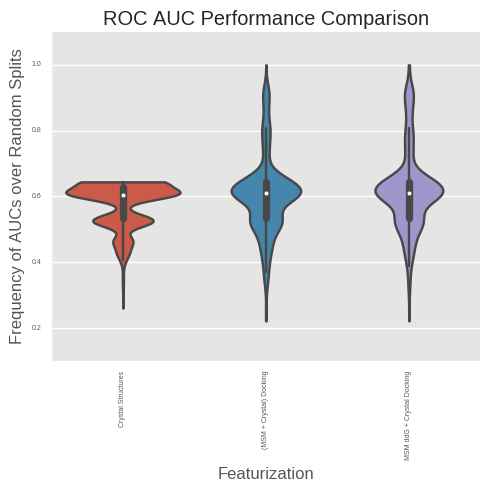

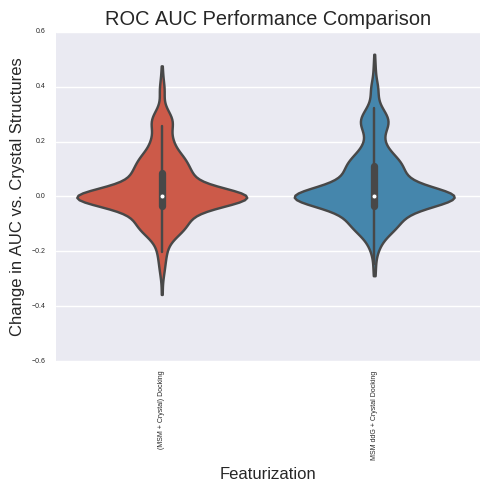

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.422348          0.000000   
(MSM + Crystal) Docking      0.395524         -0.026824   
MSM ddG + Crystal Docking    0.380139         -0.042209   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.291965206344, 0.368288972053)  
MSM ddG + Crystal Docking  (0.269843926991, 0.344713444992)  


ValueError: list.remove(x): x not in list

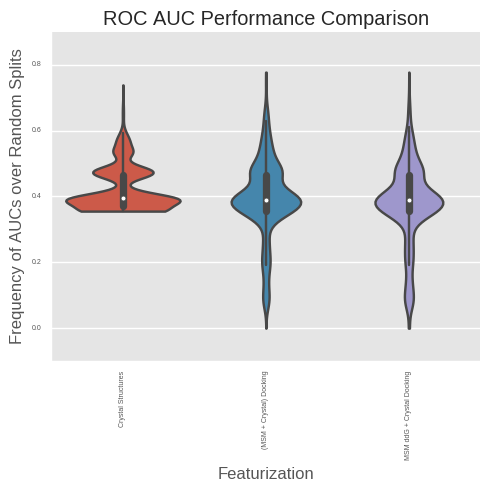

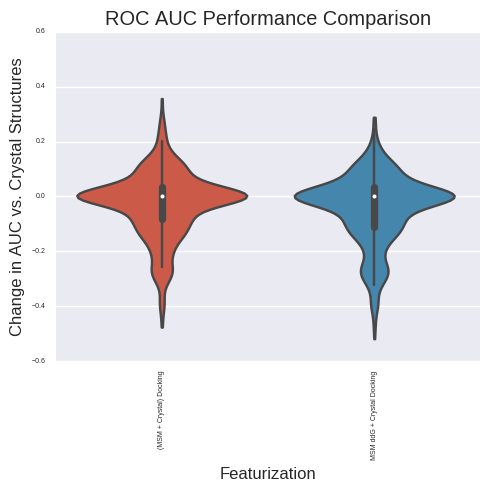

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.774833          0.000000   
(MSM + Crystal) Docking      0.836944          0.062111   
MSM ddG + Crystal Docking    0.855611          0.080778   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.565624882197, 0.644977790843)  
MSM ddG + Crystal Docking   (0.598063551337, 0.67611728715)  


ValueError: list.remove(x): x not in list

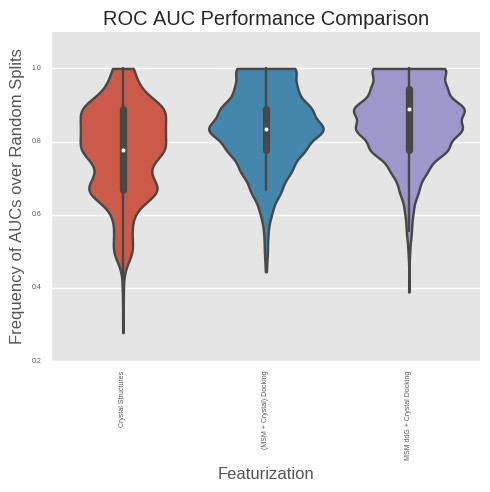

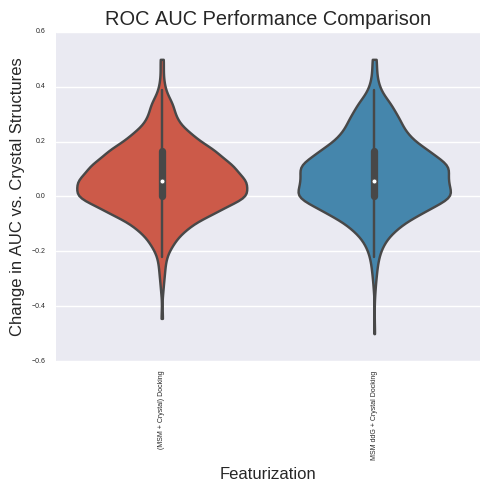

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.723668          0.000000   
(MSM + Crystal) Docking      0.819884          0.096216   
MSM ddG + Crystal Docking    0.837551          0.113883   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.751814763352, 0.818401907993)  
MSM ddG + Crystal Docking    (0.8057762976, 0.865768074926)  


ValueError: list.remove(x): x not in list

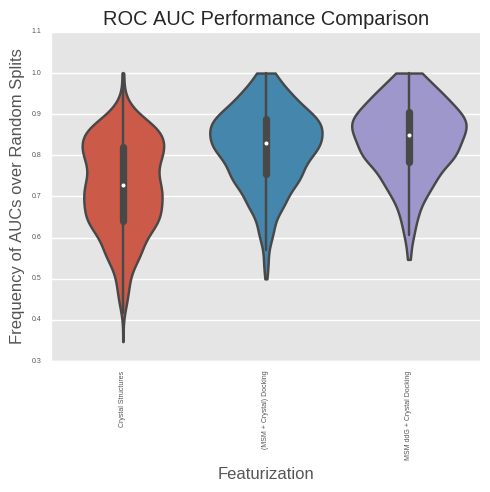

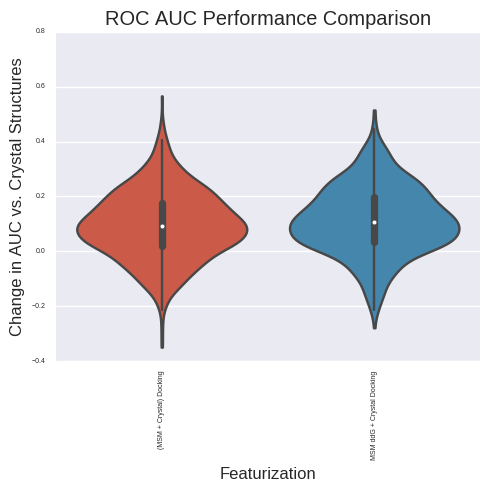

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.674152          0.000000   
(MSM + Crystal) Docking      0.661668         -0.012483   
MSM ddG + Crystal Docking    0.708477          0.034325   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.452457095452, 0.533635180857)  
MSM ddG + Crystal Docking  (0.488283745581, 0.569333966854)  


ValueError: list.remove(x): x not in list

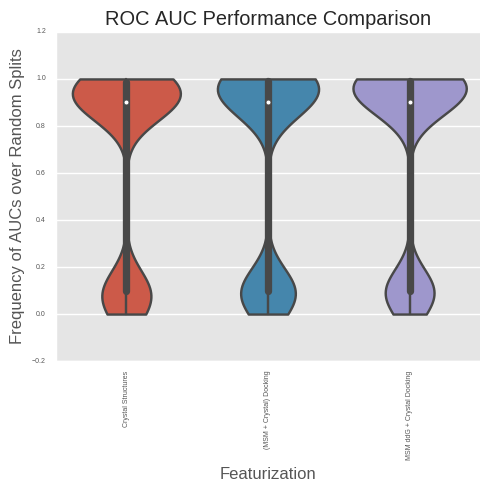

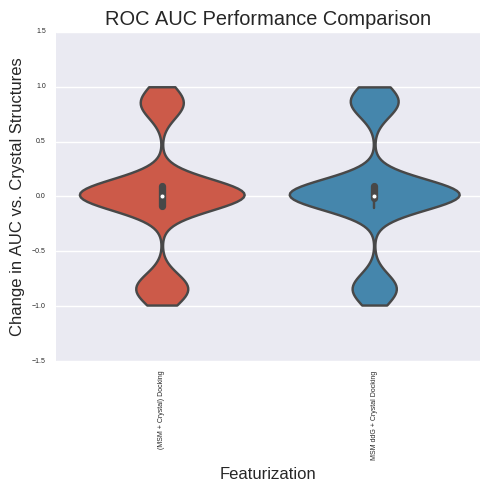

analyzing LogAUC
(1000, 0)
/n
(3, 3)
(3, 3)


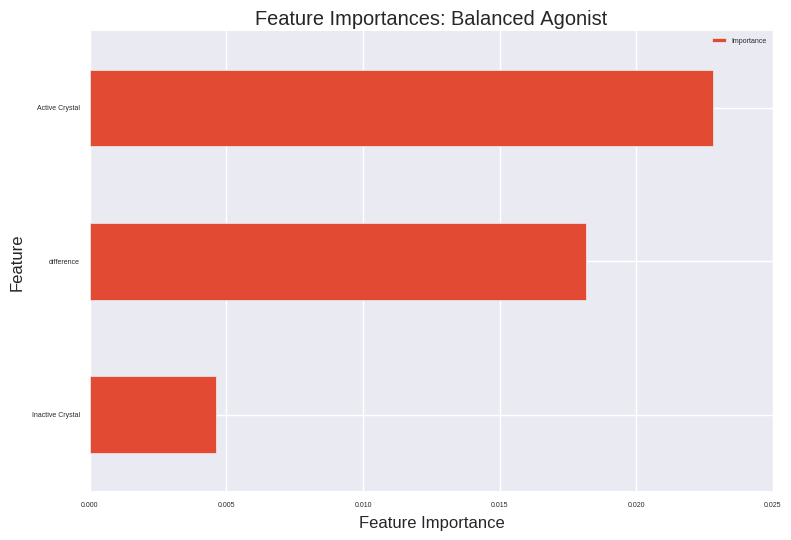

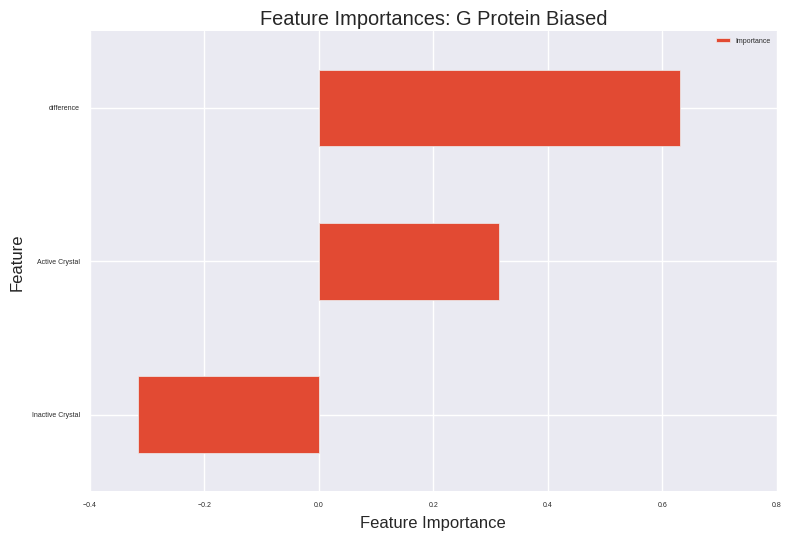

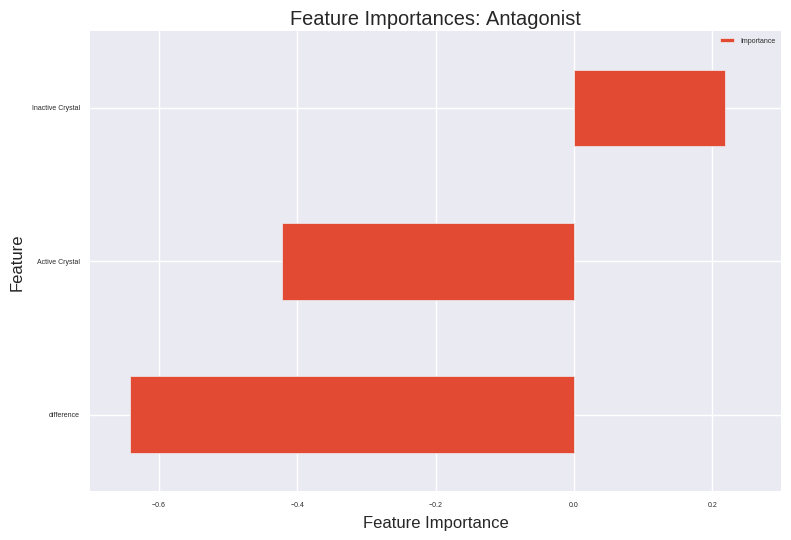

(3, 55)
(3, 55)


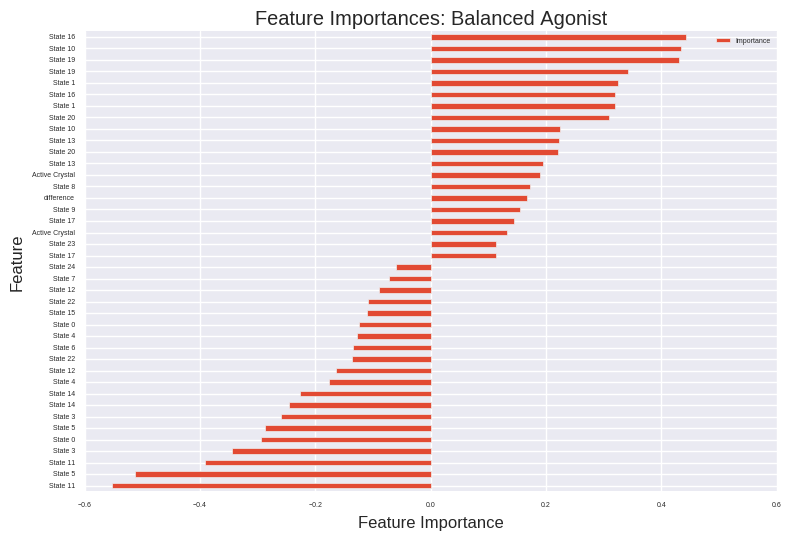

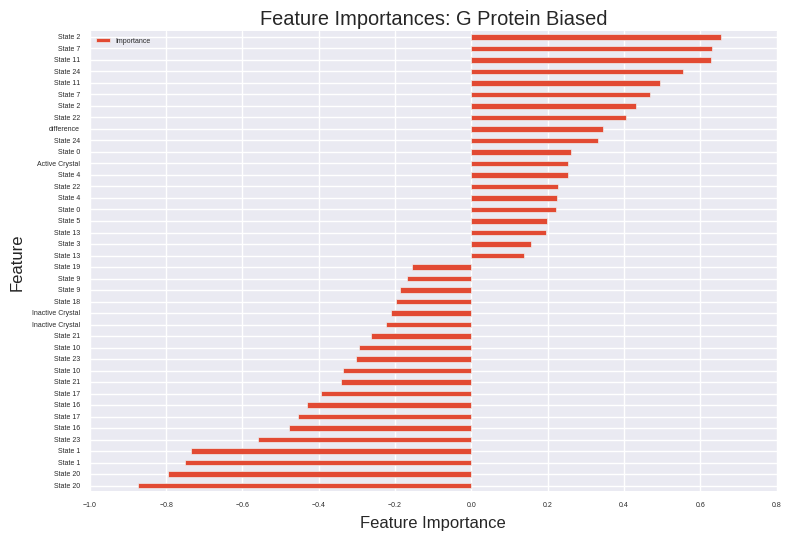

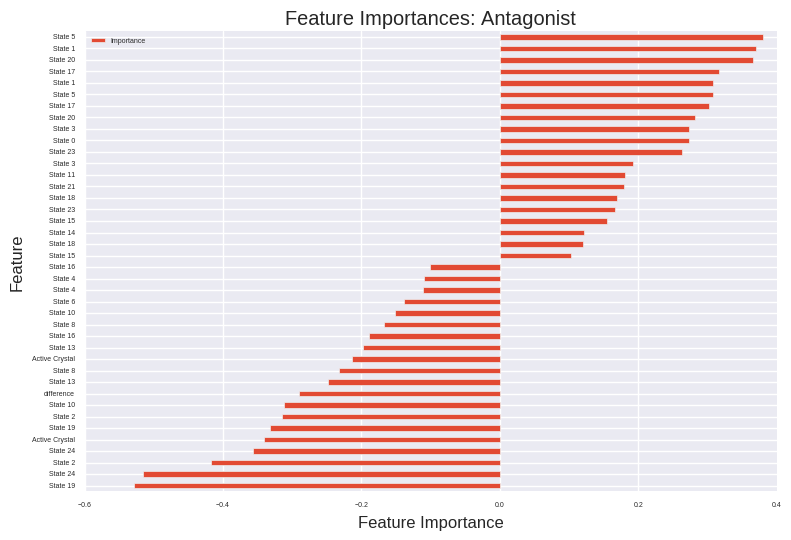

(3, 105)
(3, 105)


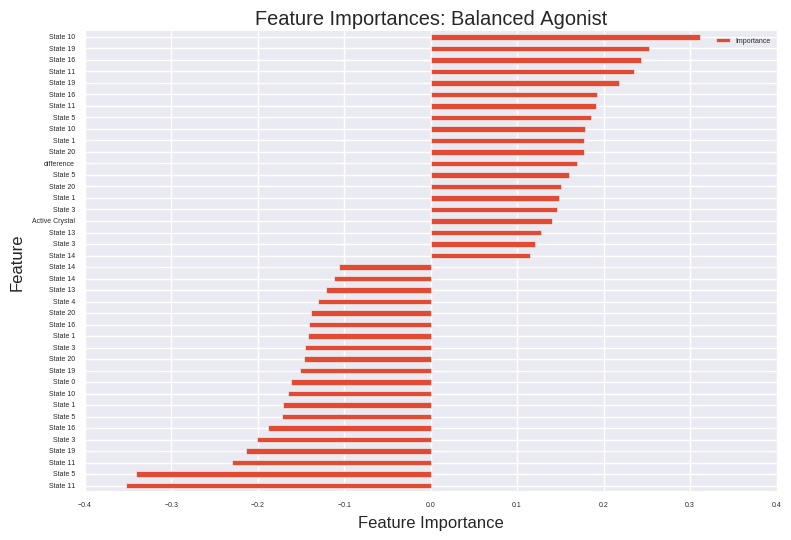

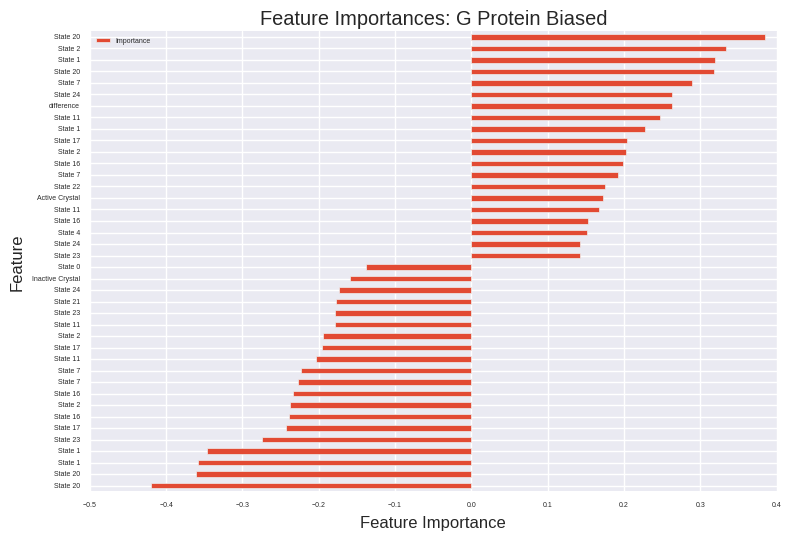

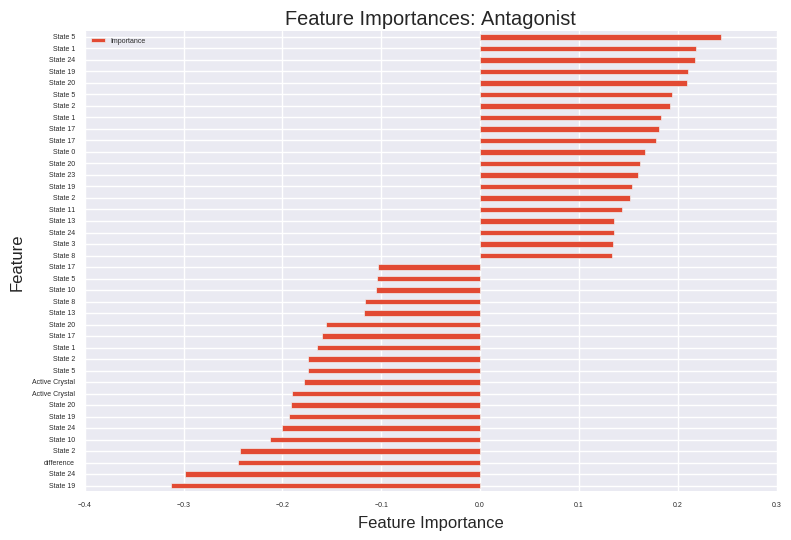

In [296]:
#XP, All ligands, LR three class, 32 stereoisomers; new crystal grids; 25 clusters

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], bret.loc[model_agonists]["PaperName"], analysis_dir,
                                                                ["Balanced Agonist", "G Protein Biased", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=True, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes



In [239]:
from sklearn import preprocessing

from importlib import reload
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


top_clusters = delta_delta_g.index.values
y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
y_ori = y_gpr - y_arr
#y_ori = y_arr
#y = preprocessing.binarize(bret[gprot_col].loc[common_ligands].values, .2).reshape((-1,1))
diff_cutoff = 0.3
abs_cutoff = 0.2

inactive_ligands = [n for n in full_docking_df.index.values.tolist() if "inactive" in n]

def generate_bias_features(bret, gprot_col, arr_col, common_ligands, diff_cutoff=0.3, abs_cutoff=0.2):
    total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
    #common_agonists = set(bret.loc[bret[arr_col] > abs_cutoff].index.values.tolist()).union(set(bret.loc[bret[gprot_col] > abs_cutoff].index.values.tolist()))
    common_agonists = total_activity.loc[total_activity > abs_cutoff].index.values
    y = np.zeros(len(common_ligands)).reshape((-1,1))
    y_arr = bret[arr_col].loc[common_ligands].values.reshape((-1,1))
    y_gpr = bret[gprot_col].loc[common_ligands].values.reshape((-1,1))
    for idx, lig in enumerate(common_ligands):
        if lig in common_agonists:
            if y_gpr[idx] - y_arr[idx] > diff_cutoff:
                y[idx] = 1.
            else:
                y[idx] = 1.
        else:
            y[idx] = 1.

    y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])
    return y, y_df
total_activity = bret[arr_col].loc[common_ligands].add(bret[gprot_col].loc[common_ligands])
#model_agonists = total_activity.loc[total_activity > abs_cutoff].index.values 
model_agonists = copy.deepcopy(common_ligands)

y, y_df = generate_bias_features(bret, gprot_col, arr_col, model_agonists,
                                 diff_cutoff=diff_cutoff, abs_cutoff=abs_cutoff)

cutoff = [0.2]
#y = multi_binarizer(y_gpr, cutoff)
#y = multi_binarizer(y_arr, cutoff)

#y_df = pd.DataFrame(y, index=common_ligands, columns=["class"])

inactive_df = pd.DataFrame(np.array([0. for i in range(0, len(inactive_ligands))]).reshape((-1,1)), columns=["class"], index=inactive_ligands)
y_df = pd.concat([y_df, inactive_df], axis=0)
y = y_df.values
model_agonists += inactive_ligands

def replace_columns(X_df):
    old_cols = X_df.columns.values.tolist()
    new_cols = []
    for col in old_cols:
        if "2rh1" in col.lower():
            col = "Inactive Crystal"
        if "3p0g" in col.lower():
            col = "Active Crystal"
        if "null" in col:
            col = "difference"
        if "cluster" in col:
            col = col.replace("cluster", "State ")
        new_cols.append(col)
    X_df.columns = new_cols
    X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
    return(X_df)

X_df = full_docking_df
X_df = replace_columns(X_df)


ddg_df = new_docking_df
ddg_df = replace_columns(ddg_df)
ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]].multiply(-1.0)
#ddg_df[[c for c in ddg_df.columns.values if "state" in c.lower()]] = eq_pops_df.loc[common_agonists]



C_df = X_df[[c for c in X_df.columns.values.tolist() if "State" not in c]]

X = X_df.values
ddg = ddg_df.values

#deer_names = [n for n in X_onehot_df.columns.values.tolist() if "_ca_dist" in n or "closest_dist" in n]
#all_features_df = pd.concat([ddg_df, X_onehot_df], axis=1).dropna().loc[common_agonists]



#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
#X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
#X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_df = pd.DataFrame(X_scaled, columns =  top_clusters.tolist() + null_features.columns.values.tolist(), index=common_agonists)

#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
#D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C*-1.0])
#X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
#k=0
#for i in range(0,X.shape[1]):
#    for j in range(i+1,X.shape[1]):
#        X_diff[:,k] = X[:,i] - X[:,j]
#        k+=1
#X_diff = np.hstack([X_scaled, X_diff, C*-1.0])
#all_features = all_features_df.values
#features_y = [C*-1.0, X_scaled]
feature_names = ["Crystal Structures", "(MSM + Crystal) Docking", "MSM ddG + Crystal Docking"]#, "MSM Features Reweighted"]#, "Docking ddG and Observables"]




n_trials = 1000
train_test_split_prop = 0.8
model_type = "rfr"
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

normalize = False
normalize_axis0 = True
if normalize_axis0:
    double_features = 2
    X_df = normalize_per_ligand(X_df)
    ddg_df = normalize_per_ligand(ddg_df)

else: 
    double_features = 1
n_estimators = 1000
ddg_df = pd.concat([ddg_df, X_df.ix[:, [i for i in range(0, X_df.shape[1]) if "state" in X_df.columns.values[i].lower()]]], axis=1)

features = [C_df.loc[model_agonists], X_df.loc[model_agonists], ddg_df.loc[model_agonists]]#, all_features_df]#, all_features]
print([f.shape for f in features])
#save_name = "arr-cutoff%s_%s_trials%d_split%s" %(str(cutoff), model_type, n_trials, str(train_test_split_prop))
save_name = "antagonist_vs_agonist_vs_dud-%s_%s_trials%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(str(diff_cutoff), model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)
#save_name = "a_vs_g_vs_inactive-%s_%s_trials%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(str(diff_cutoff), model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=dview, parallel=True, n_estimators=n_estimators, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=normalize, normalize_axis0=False,
                                                 loocv=False)


[(151, 3), (151, 55), (151, 105)]
Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.571113          0.000000   
(MSM + Crystal) Docking      0.738071          0.166958   
MSM ddG + Crystal Docking    0.740404          0.169291   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.656313999351, 0.731115446336)  
MSM ddG + Crystal Docking  (0.655286555008, 0.730156073009)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.343946          0.000000   
(MSM + Crystal) Docking      0.399065          0.055119   
MSM ddG + Crystal Docking    0.357238          0.013292   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.607219998375, 0.684842199144)  
MSM ddG + Crystal Docking  (0.491278758618, 0.572299406828)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.716548          0.000000   
(MSM + Crystal) Docking      0.788065          0.071516   
MSM ddG + Crystal Docking    0.799581          0.083032   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.820757559644, 0.878602260264)  
MSM ddG + Crystal Docking  (0.845565043754, 0.899491582569)  


ValueError: list.remove(x): x not in list

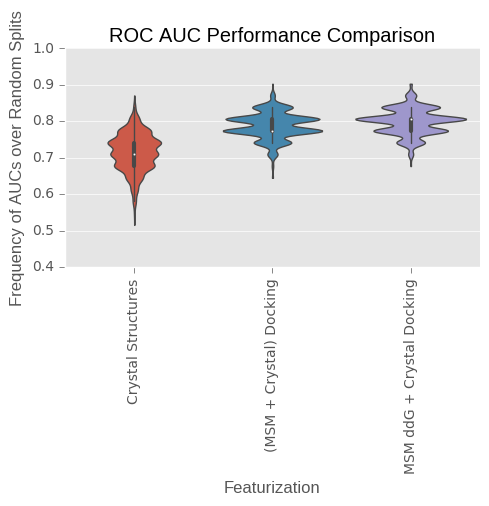

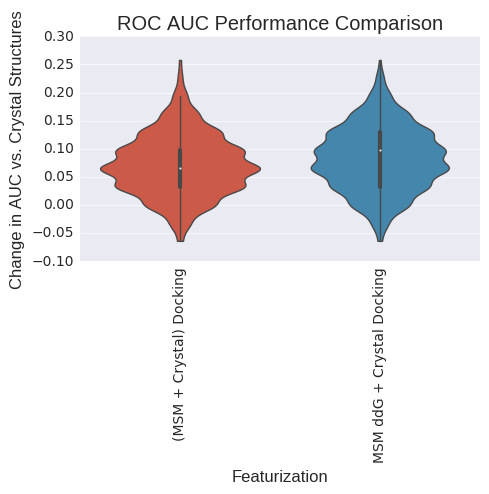

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.673667          0.000000   
(MSM + Crystal) Docking      0.853000          0.179333   
MSM ddG + Crystal Docking    0.833667          0.160000   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.456427504571, 0.537612042418)  
MSM ddG + Crystal Docking  (0.430666033146, 0.511716254419)  


ValueError: list.remove(x): x not in list

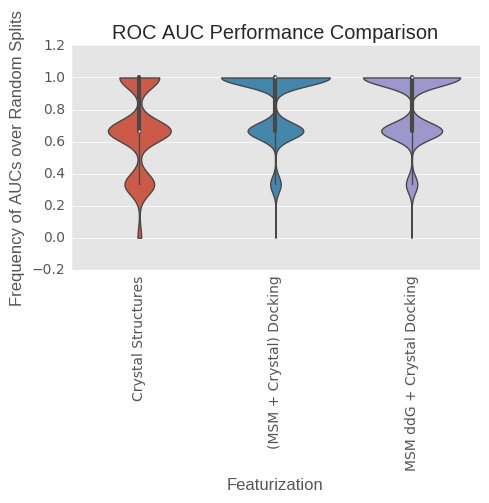

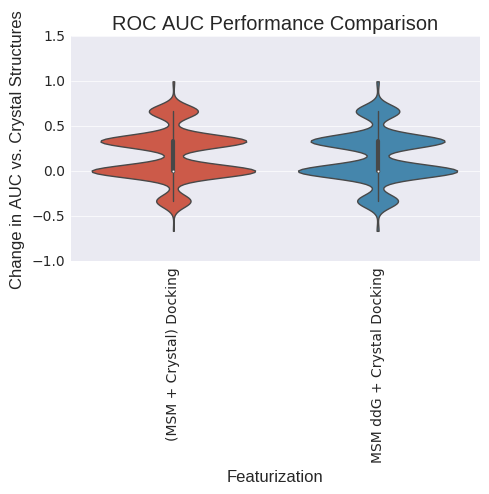

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.467325          0.000000   
(MSM + Crystal) Docking      0.615062          0.147737   
MSM ddG + Crystal Docking    0.689136          0.221811   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.66248301631, 0.736867335399)  
MSM ddG + Crystal Docking  (0.781331164216, 0.844516401895)  


ValueError: list.remove(x): x not in list

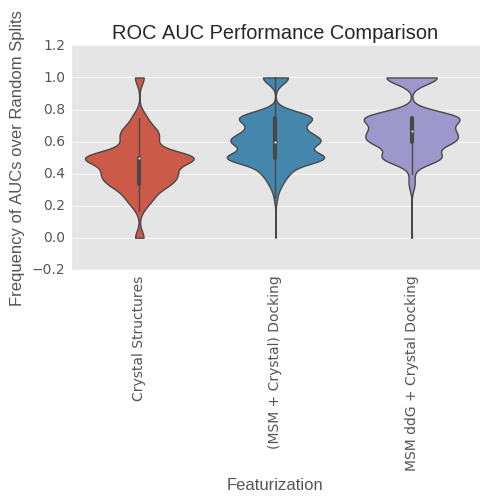

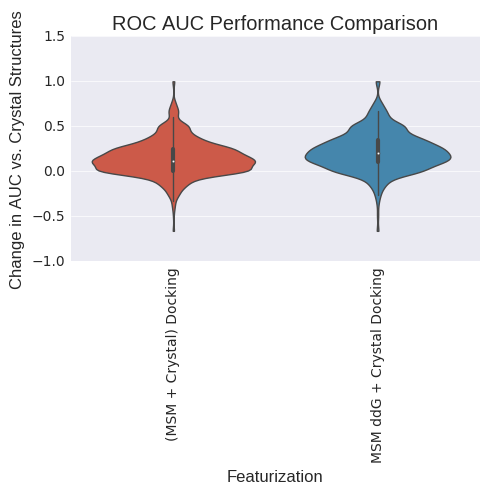

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.532675          0.000000   
(MSM + Crystal) Docking      0.384938         -0.147737   
MSM ddG + Crystal Docking    0.310864         -0.221811   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking     (0.0834702570557, 0.133723580888)  
MSM ddG + Crystal Docking  (0.0485015723544, 0.0892195587818)  


ValueError: list.remove(x): x not in list

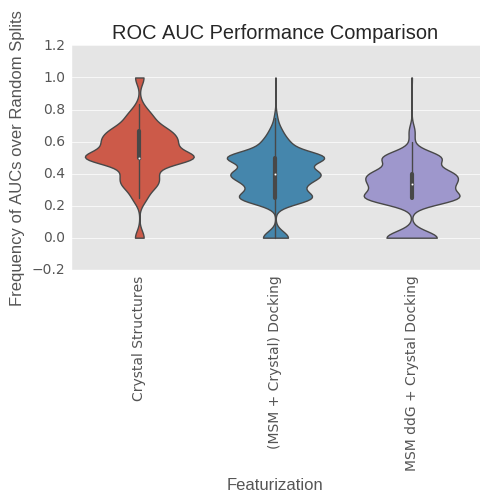

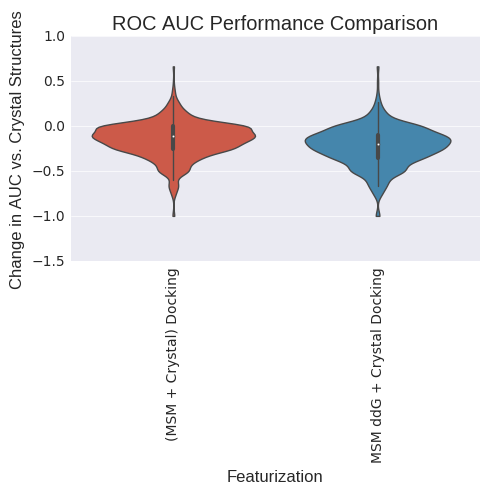

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.716548          0.000000   
(MSM + Crystal) Docking      0.788065          0.071516   
MSM ddG + Crystal Docking    0.799581          0.083032   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.820757559644, 0.878602260264)  
MSM ddG + Crystal Docking  (0.845565043754, 0.899491582569)  


ValueError: list.remove(x): x not in list

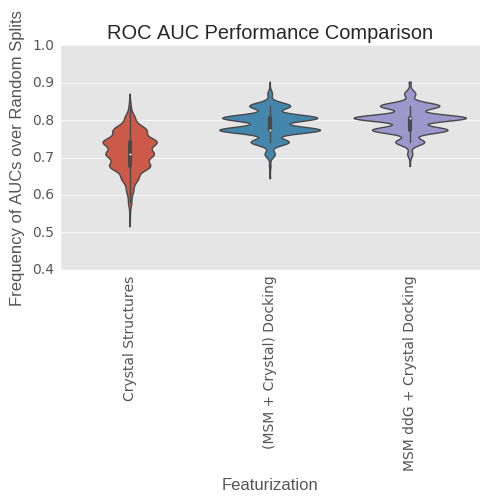

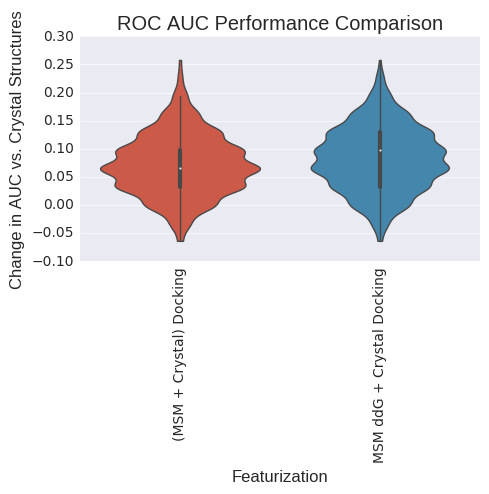

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.650561          0.000000   
(MSM + Crystal) Docking      0.701481          0.050920   
MSM ddG + Crystal Docking    0.708929          0.058368   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.68930444525, 0.761703165883)  
MSM ddG + Crystal Docking  (0.693444147113, 0.765510734701)  


ValueError: list.remove(x): x not in list

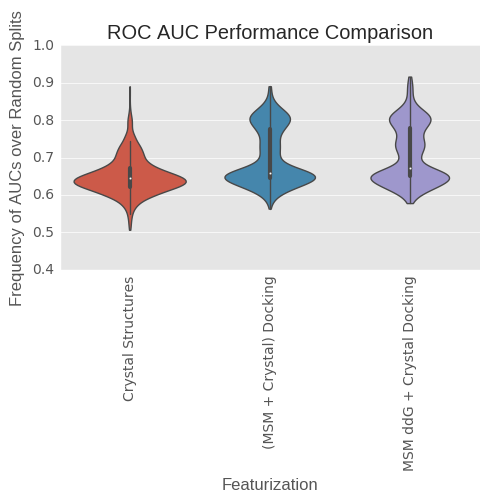

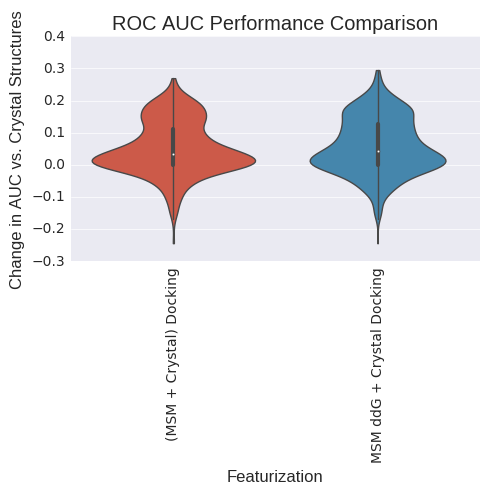

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.349439          0.000000   
(MSM + Crystal) Docking      0.298519         -0.050920   
MSM ddG + Crystal Docking    0.291071         -0.058368   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.221192183808, 0.292037486995)  
MSM ddG + Crystal Docking    (0.224986602583, 0.2961903389)  


ValueError: list.remove(x): x not in list

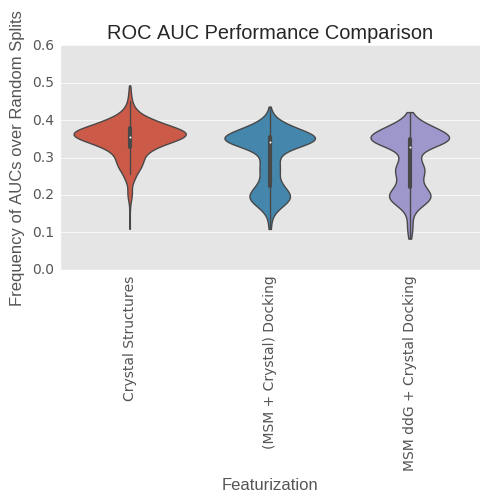

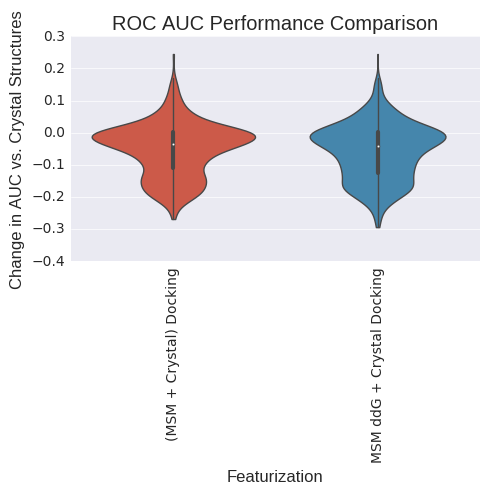

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.940292          0.000000   
(MSM + Crystal) Docking      0.974208          0.033917   
MSM ddG + Crystal Docking    0.973798          0.033506   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.812186741749, 0.871278536797)  
MSM ddG + Crystal Docking  (0.791935579321, 0.853780163492)  


ValueError: list.remove(x): x not in list

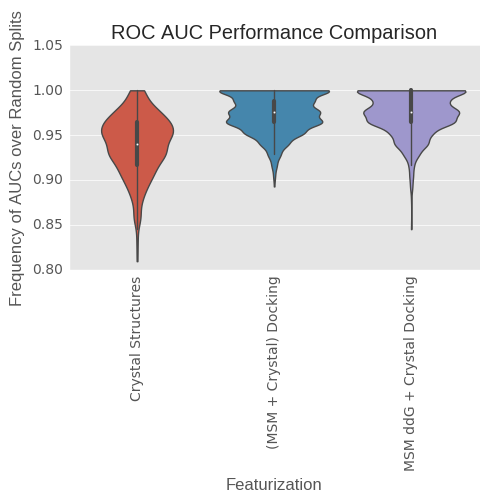

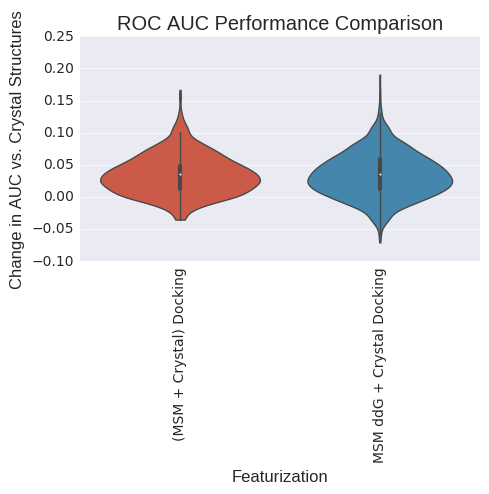

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.852752          0.000000   
(MSM + Crystal) Docking      0.920392          0.067639   
MSM ddG + Crystal Docking    0.917712          0.064960   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.906258443209, 0.948073154974)  
MSM ddG + Crystal Docking  (0.889458748487, 0.935070584643)  


ValueError: list.remove(x): x not in list

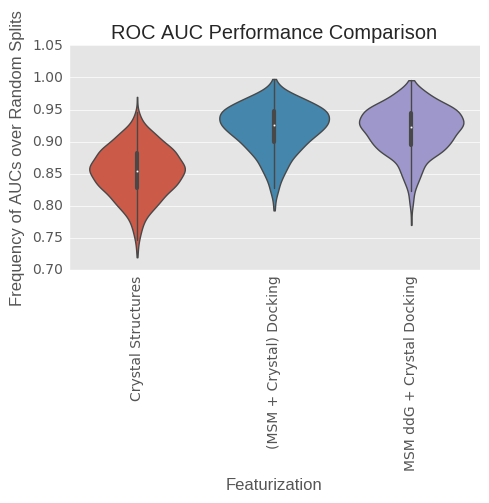

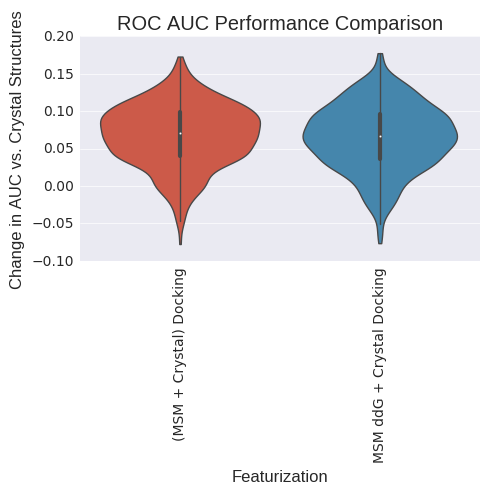

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.825252          0.000000   
(MSM + Crystal) Docking      0.960370          0.135118   
MSM ddG + Crystal Docking    0.966273          0.141021   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.757067709463, 0.823083050233)  
MSM ddG + Crystal Docking  (0.724613383787, 0.793946028134)  


ValueError: list.remove(x): x not in list

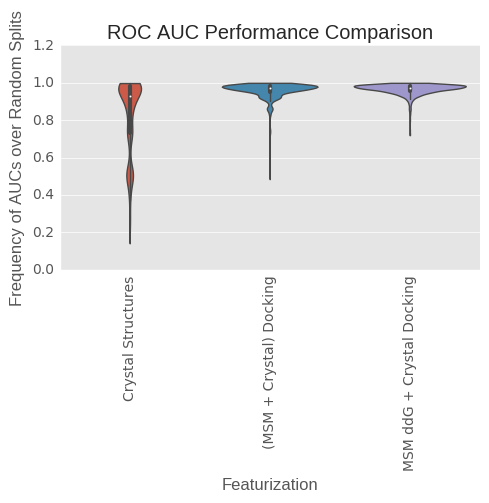

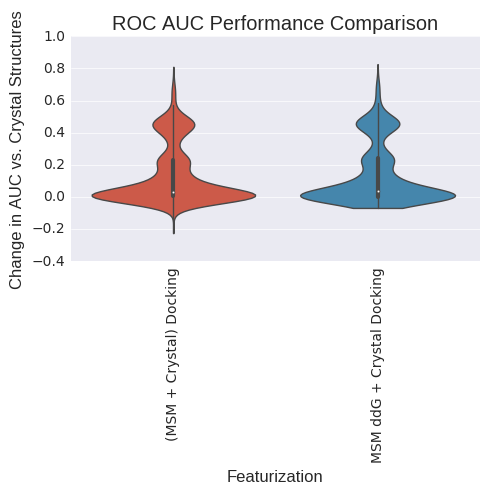

analyzing LogAUC
(1000, 0)
/n
(3,)
(1, 3)


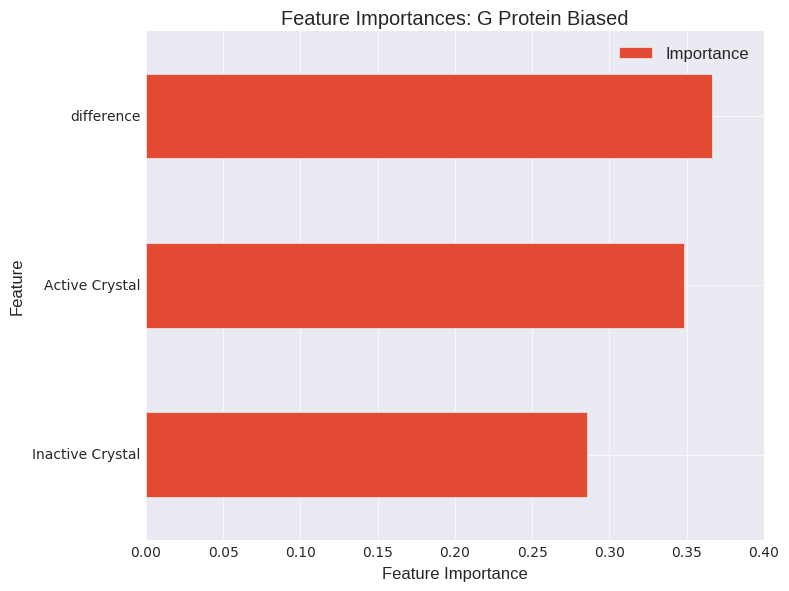

(55,)
(1, 55)


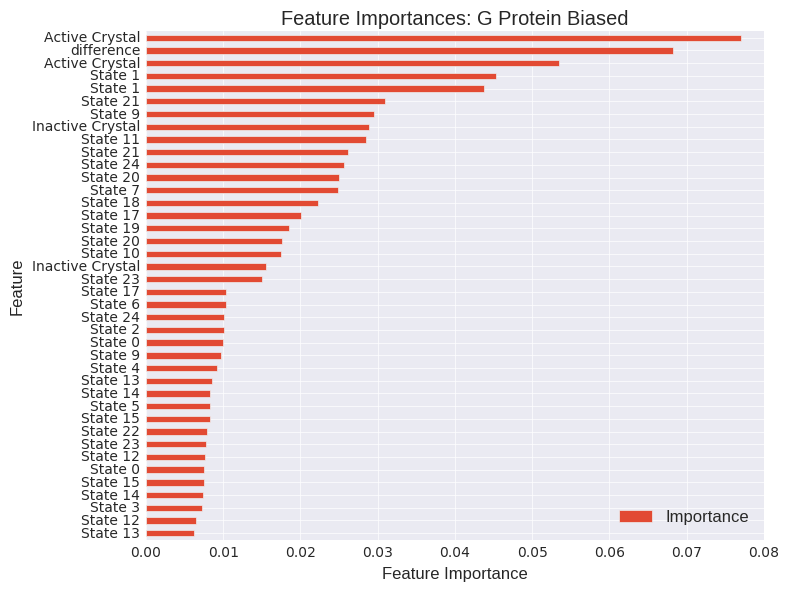

(105,)
(1, 105)


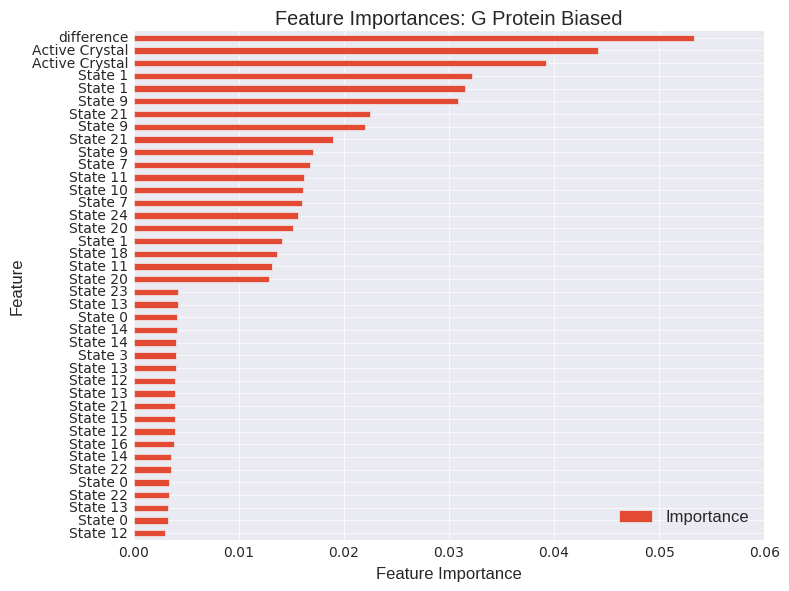

In [222]:
#SP, All ligands, Four class, 32 stereoisomers; new crystal grids; 25 clusters

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Dud", "G Protein Biased", "Balanced Agonist", "Antagonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes



analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.532540          0.000000   
(MSM + Crystal) Docking      0.619489          0.086950   
MSM ddG + Crystal Docking    0.600992          0.068452   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.636827207033, 0.712852702921)  
MSM ddG + Crystal Docking  (0.596030790439, 0.674176412707)  


ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.113789          0.000000   
(MSM + Crystal) Docking      0.220793          0.107004   
MSM ddG + Crystal Docking    0.217840          0.104051   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.783449239579, 0.846371961872)  
MSM ddG + Crystal Docking  (0.779214457552, 0.842659473219)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.818387          0.000000   
(MSM + Crystal) Docking      0.872871          0.054484   
MSM ddG + Crystal Docking    0.872000          0.053613   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.739237174994, 0.807137684309)  
MSM ddG + Crystal Docking  (0.717320724077, 0.787330964152)  


ValueError: list.remove(x): x not in list

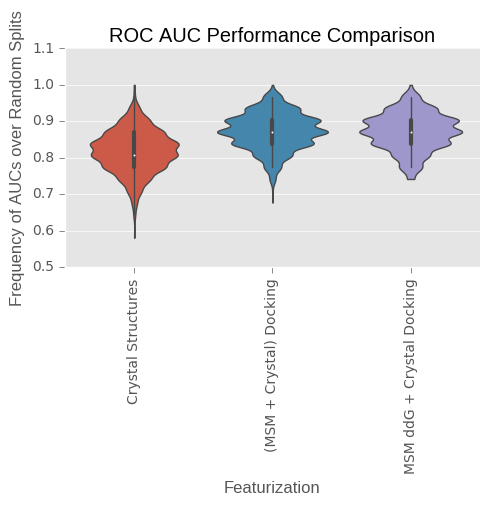

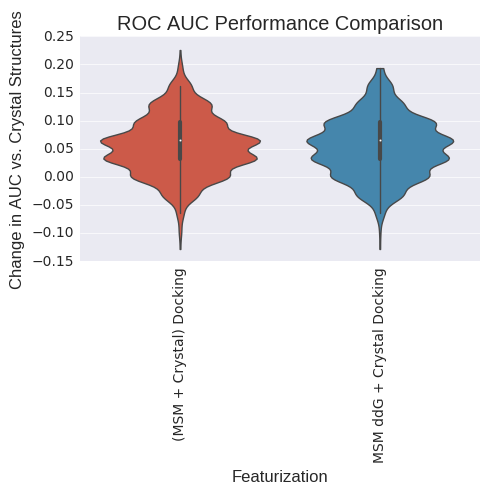

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.619889          0.000000   
(MSM + Crystal) Docking      0.675333          0.055444   
MSM ddG + Crystal Docking    0.676556          0.056667   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.438581002308, 0.519695826618)  
MSM ddG + Crystal Docking  (0.446506322643, 0.527665047644)  


ValueError: list.remove(x): x not in list

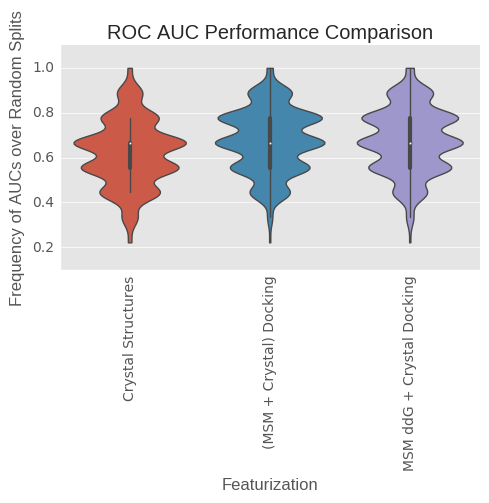

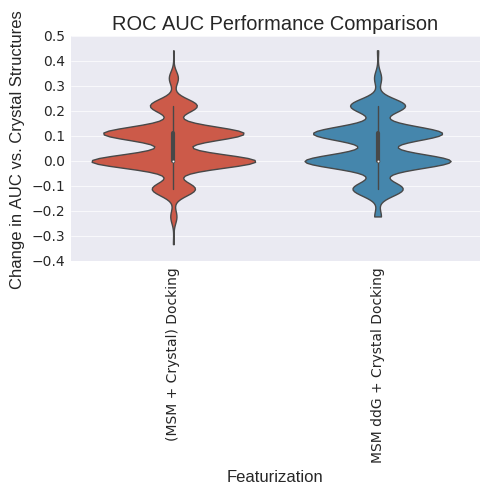

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.735598          0.000000   
(MSM + Crystal) Docking      0.870321          0.134723   
MSM ddG + Crystal Docking    0.865463          0.129866   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.734008365187, 0.802432405765)  
MSM ddG + Crystal Docking  (0.726699315456, 0.795833731805)  


ValueError: list.remove(x): x not in list

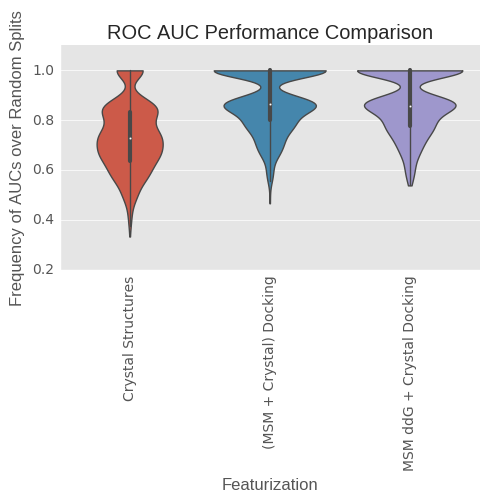

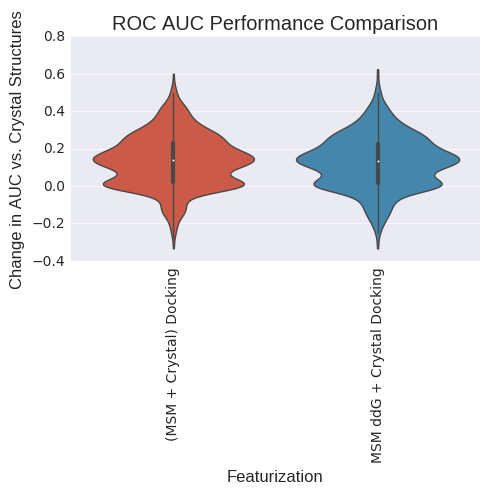

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.264402          0.000000   
(MSM + Crystal) Docking      0.129679         -0.134723   
MSM ddG + Crystal Docking    0.134537         -0.129866   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0701908543204, 0.117200718571)  
MSM ddG + Crystal Docking   (0.0942058216261, 0.14682982836)  


ValueError: list.remove(x): x not in list

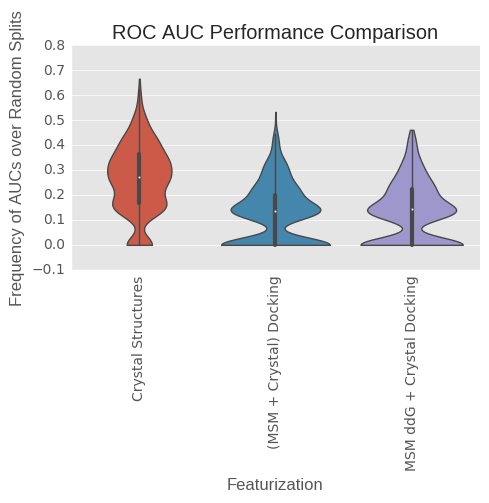

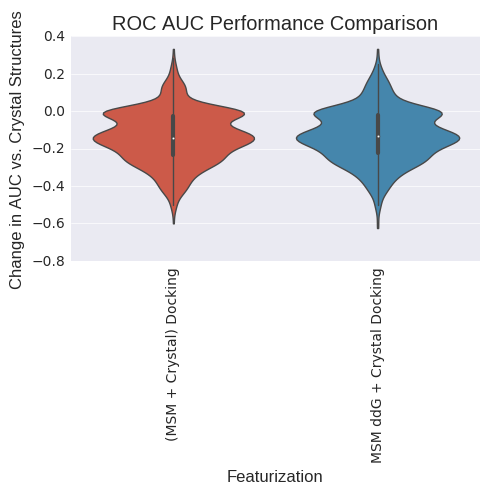

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.619889          0.000000   
(MSM + Crystal) Docking      0.675333          0.055444   
MSM ddG + Crystal Docking    0.676556          0.056667   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.438581002308, 0.519695826618)  
MSM ddG + Crystal Docking  (0.446506322643, 0.527665047644)  


ValueError: list.remove(x): x not in list

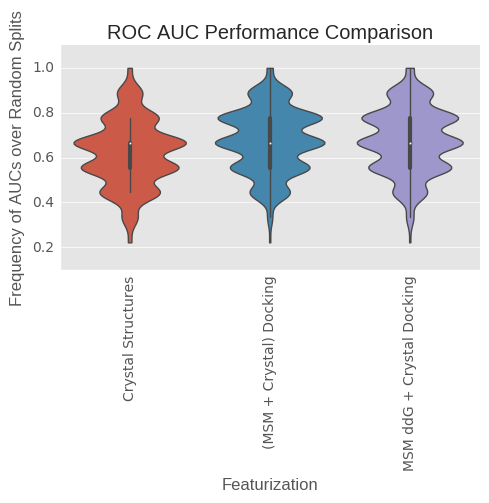

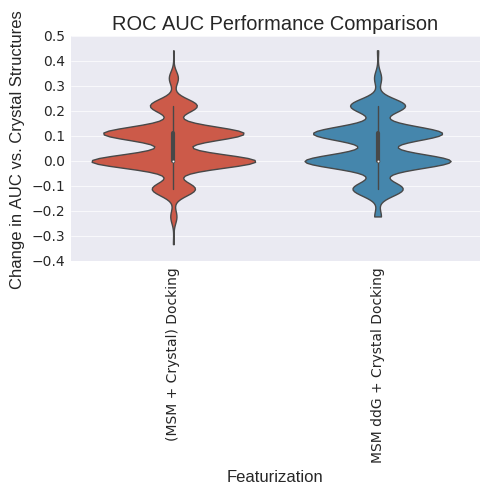

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.735598          0.000000   
(MSM + Crystal) Docking      0.870321          0.134723   
MSM ddG + Crystal Docking    0.865463          0.129866   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.734008365187, 0.802432405765)  
MSM ddG + Crystal Docking  (0.726699315456, 0.795833731805)  


ValueError: list.remove(x): x not in list

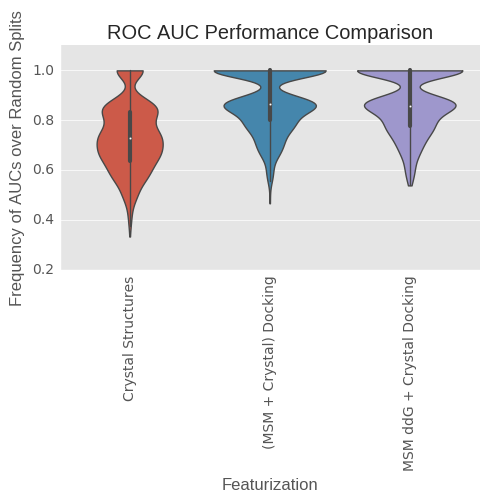

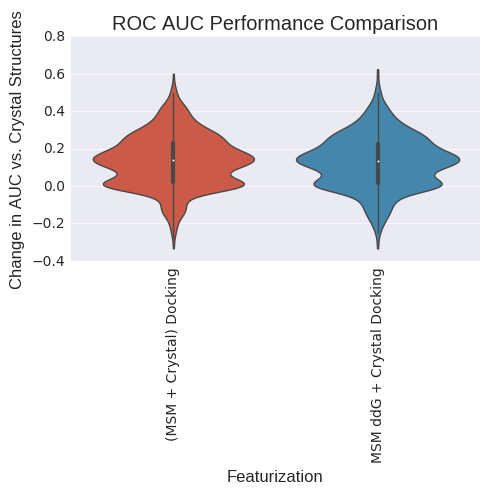

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.264402          0.000000   
(MSM + Crystal) Docking      0.129679         -0.134723   
MSM ddG + Crystal Docking    0.134537         -0.129866   

                                            Sign Test 99% CI  
Crystal Structures                                  (0, 0.0)  
(MSM + Crystal) Docking    (0.0701908543204, 0.117200718571)  
MSM ddG + Crystal Docking   (0.0942058216261, 0.14682982836)  


ValueError: list.remove(x): x not in list

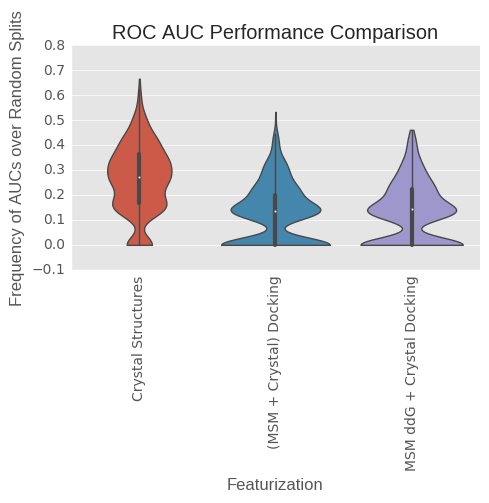

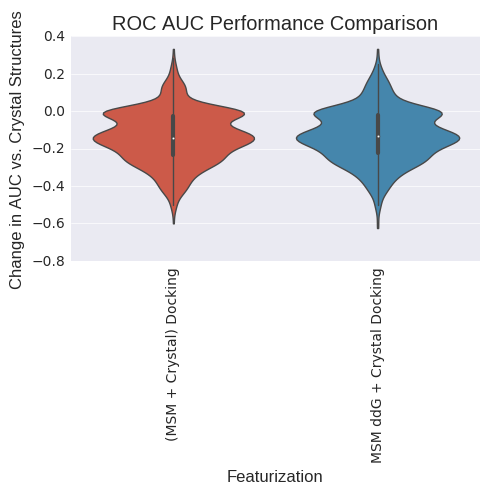

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.883341          0.000000   
(MSM + Crystal) Docking      0.932462          0.049121   
MSM ddG + Crystal Docking    0.928030          0.044689   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.823978877242, 0.881341395677)  
MSM ddG + Crystal Docking   (0.80791148098, 0.867606526885)  


ValueError: list.remove(x): x not in list

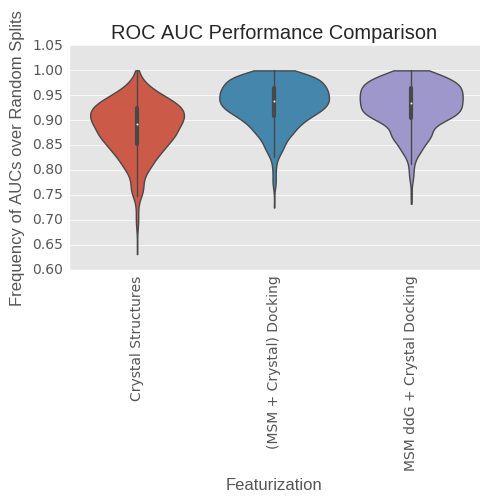

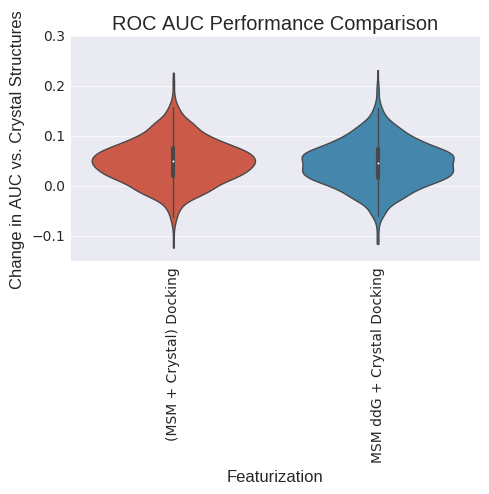

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.883341          0.000000   
(MSM + Crystal) Docking      0.932462          0.049121   
MSM ddG + Crystal Docking    0.928030          0.044689   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.822904652511, 0.880428802737)  
MSM ddG + Crystal Docking  (0.808979679805, 0.868525145731)  


ValueError: list.remove(x): x not in list

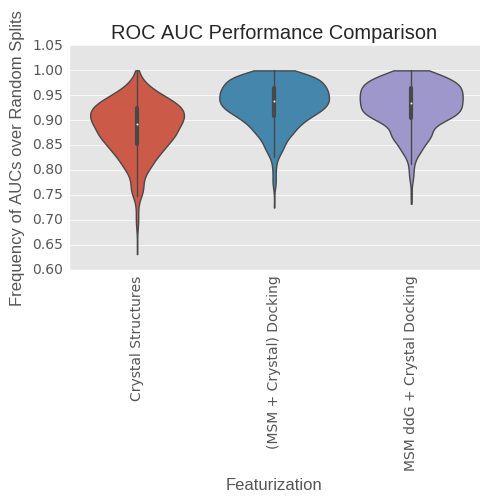

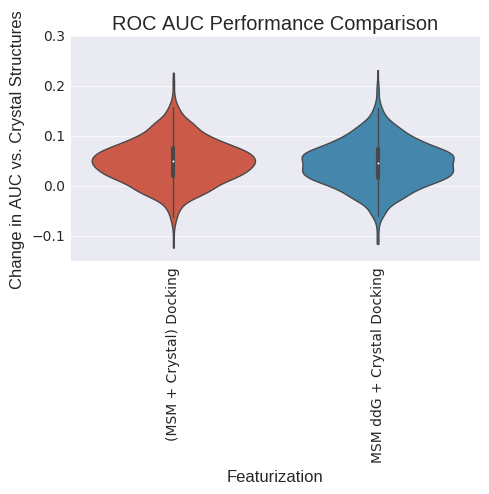

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.885365          0.000000   
(MSM + Crystal) Docking      0.948389          0.063024   
MSM ddG + Crystal Docking    0.957403          0.072038   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.850994409266, 0.903996305408)  
MSM ddG + Crystal Docking  (0.855348303331, 0.907589682023)  


ValueError: list.remove(x): x not in list

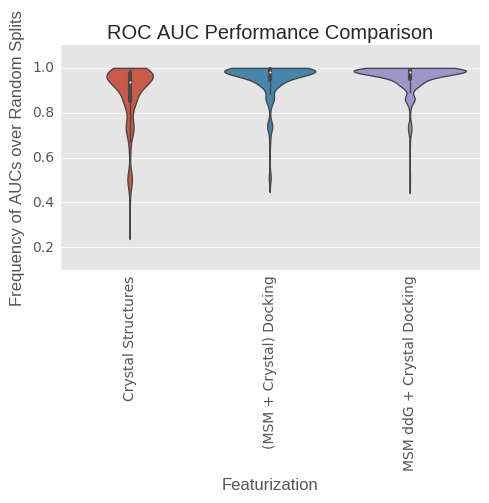

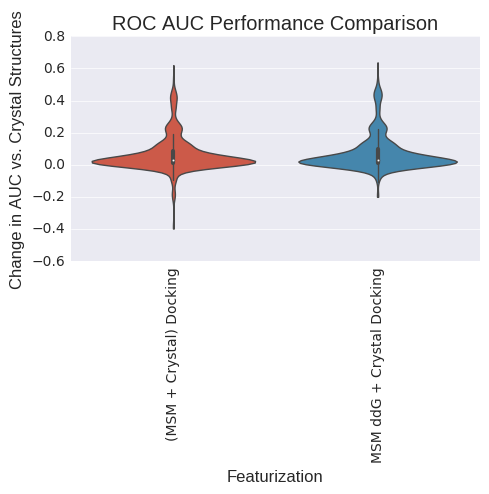

analyzing LogAUC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.318623          0.000000   
(MSM + Crystal) Docking      0.345754          0.027131   
MSM ddG + Crystal Docking    0.340120          0.021497   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.667629625978, 0.741654814082)  
MSM ddG + Crystal Docking  (0.641948297069, 0.717665701236)  


ValueError: list.remove(x): x not in list

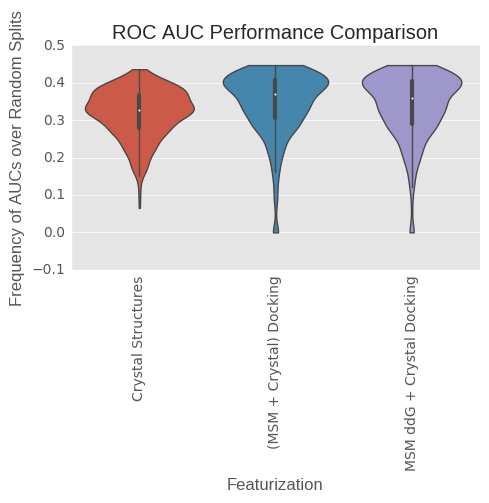

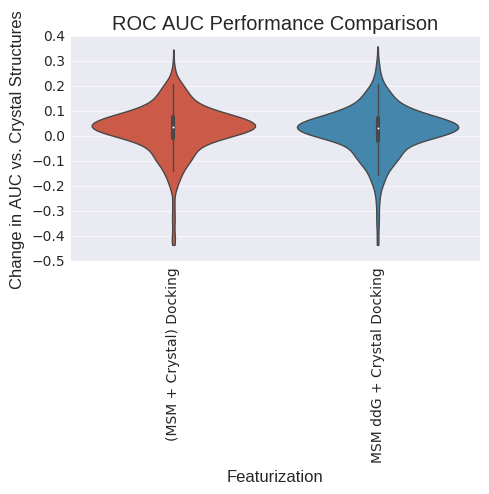

(3,)
(1, 3)


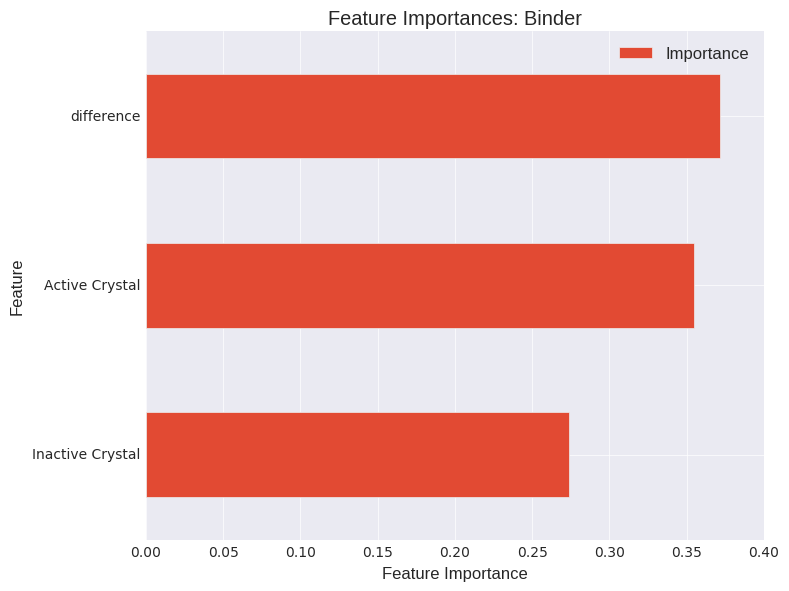

(55,)
(1, 55)


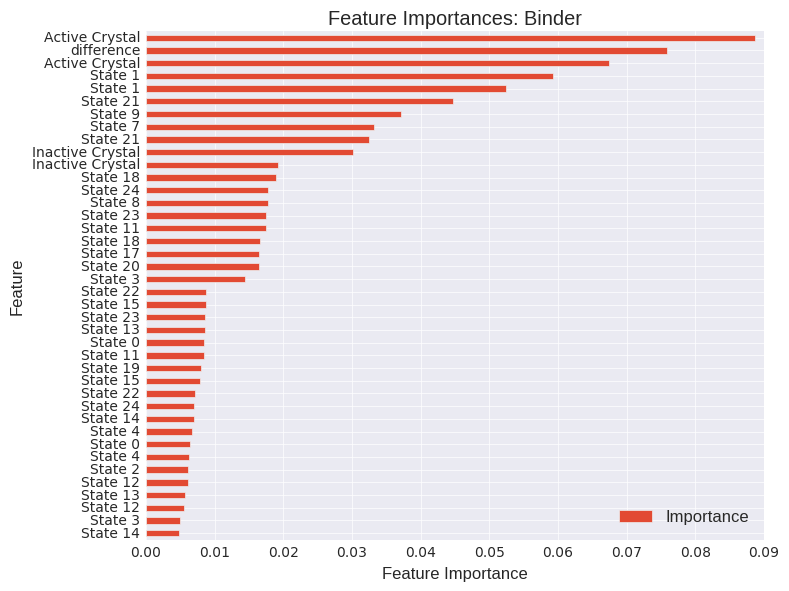

(105,)
(1, 105)


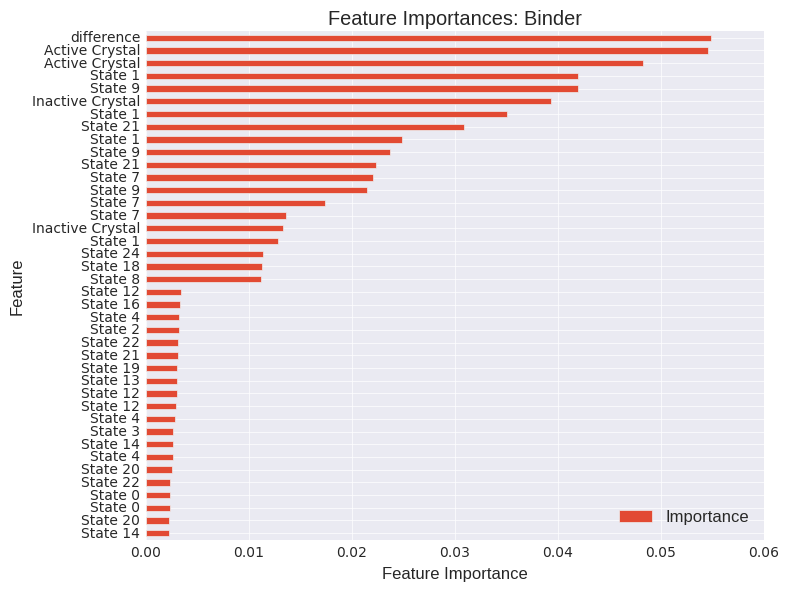

In [240]:
#SP, All ligands, Four class, 32 stereoisomers; new crystal grids; 25 clusters

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Non-binder", "Binder"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.mean)


#TRY LOOCV
#crystal structures might just have bigger boxes




In [269]:
analysis_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/analysis_n_clusters25_random'

In [232]:
analysis_dir

'/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/analysis_n_clusters25_random'

analyzing precision at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.516406          0.000000   
(MSM + Crystal) Docking      0.618192          0.101786   
MSM ddG + Crystal Docking    0.574781          0.058375   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking      (0.552497674928, 0.6322763684)  
MSM ddG + Crystal Docking  (0.375554200244, 0.455566297789)  


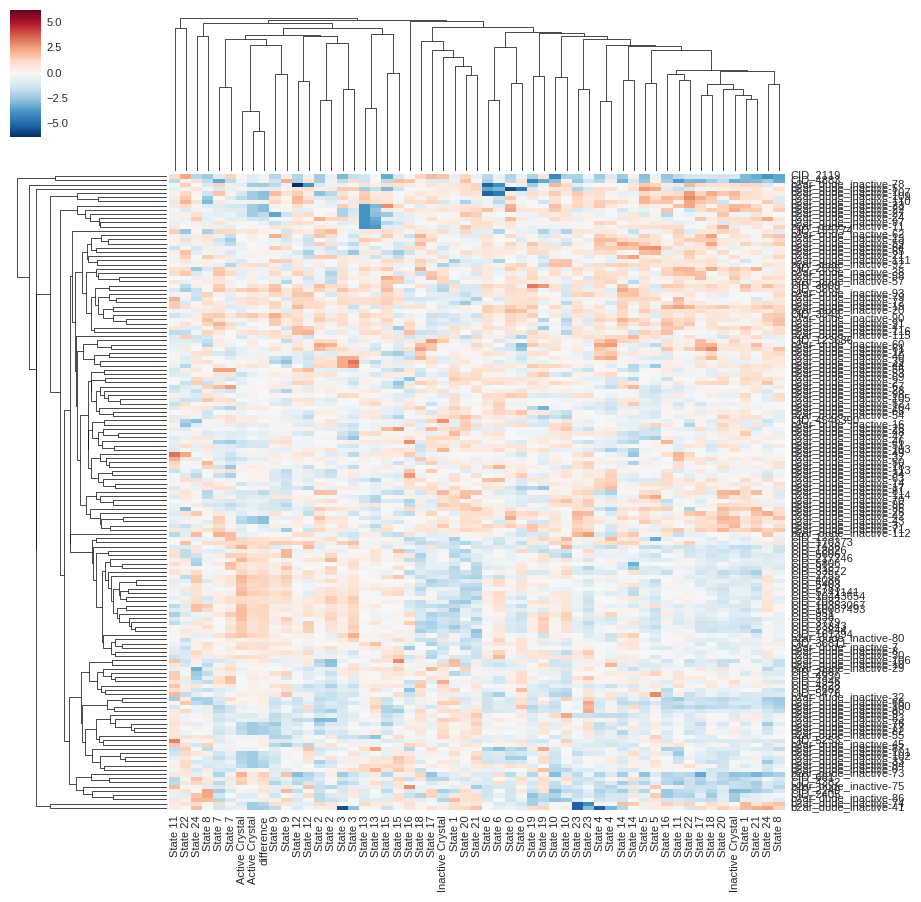

ValueError: list.remove(x): x not in list

analyzing threshold at full recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.195705          0.000000   
(MSM + Crystal) Docking      0.260465          0.064760   
MSM ddG + Crystal Docking    0.242297          0.046592   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking     (0.73505358332, 0.803374005302)  
MSM ddG + Crystal Docking  (0.720444619533, 0.790167521707)  


ValueError: list.remove(x): x not in list

analyzing Accuracy:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.932613          0.000000   
(MSM + Crystal) Docking      0.930968         -0.001645   
MSM ddG + Crystal Docking    0.927387         -0.005226   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.203222807623, 0.272257327446)  
MSM ddG + Crystal Docking  (0.228784847107, 0.300339365058)  


ValueError: list.remove(x): x not in list

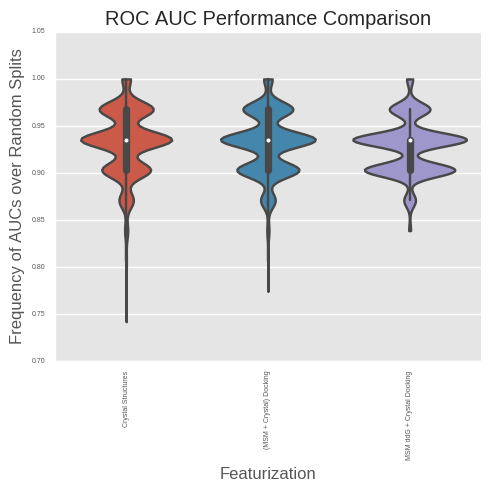

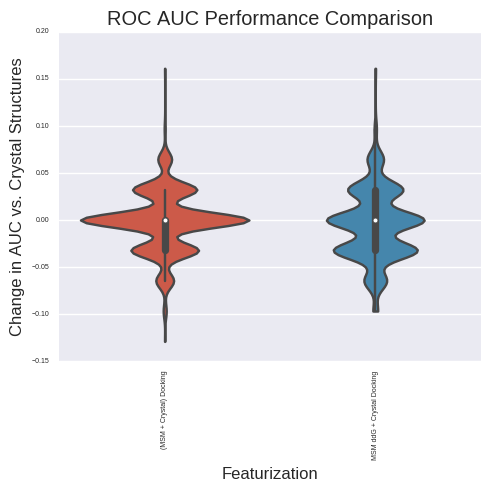

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.532000          0.000000   
(MSM + Crystal) Docking      0.431667         -0.100333   
MSM ddG + Crystal Docking    0.316333         -0.215667   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking    (0.0120958467942, 0.0362184891833)  
MSM ddG + Crystal Docking  (0.0341968415351, 0.0697483892078)  


ValueError: list.remove(x): x not in list

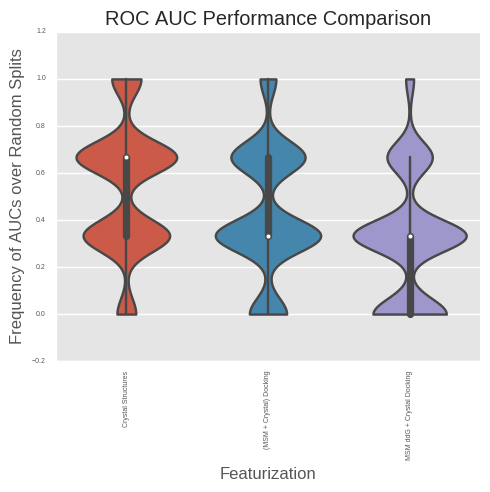

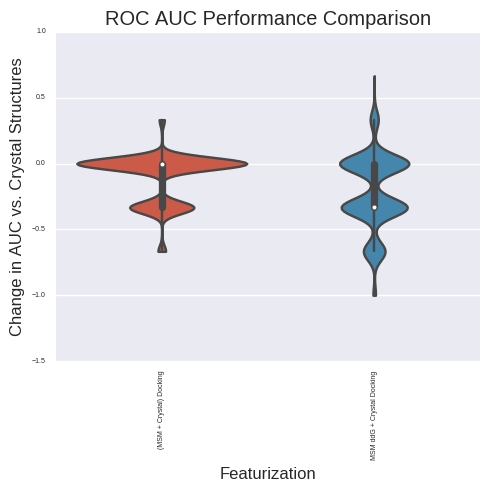

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.717212          0.000000   
(MSM + Crystal) Docking      0.704250         -0.012962   
MSM ddG + Crystal Docking    0.637683         -0.079529   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.225935807277, 0.297227951877)  
MSM ddG + Crystal Docking  (0.295823031004, 0.372378418074)  


ValueError: list.remove(x): x not in list

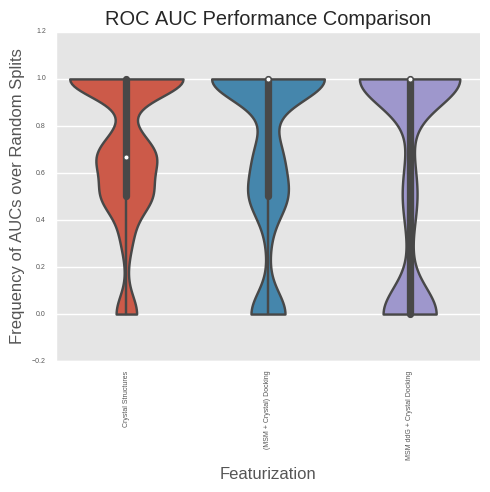

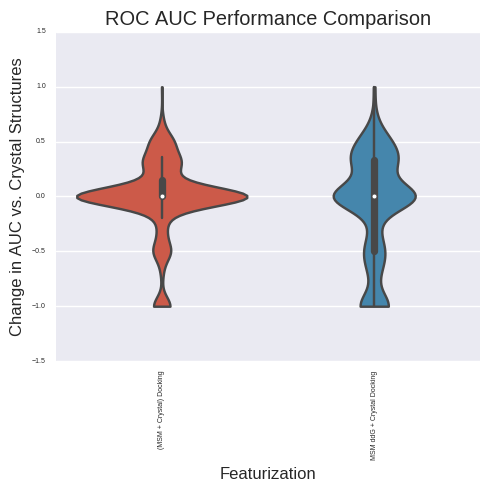

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.282788          0.000000   
(MSM + Crystal) Docking      0.295750          0.012962   
MSM ddG + Crystal Docking    0.362317          0.079529   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.162919359744, 0.227127615507)  
MSM ddG + Crystal Docking  (0.268884553664, 0.343686000649)  


ValueError: list.remove(x): x not in list

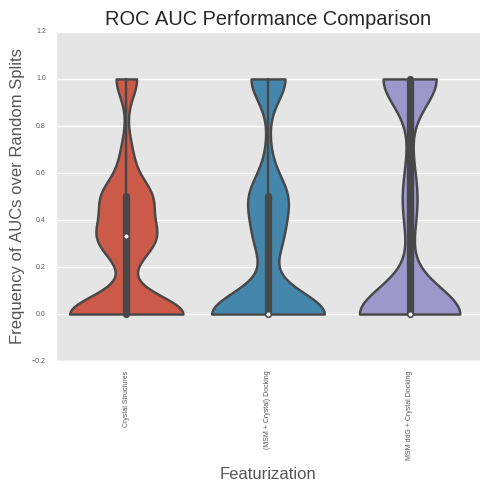

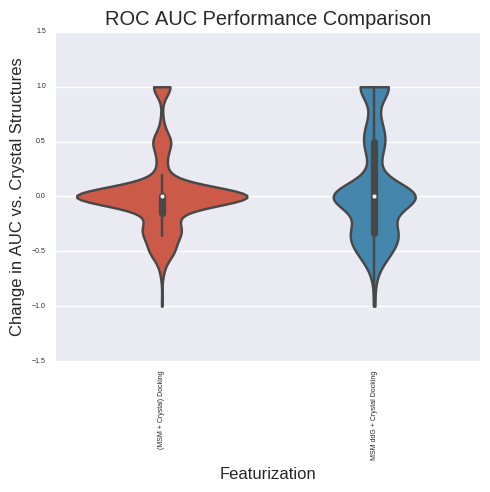

analyzing Recall:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.532000          0.000000   
(MSM + Crystal) Docking      0.431667         -0.100333   
MSM ddG + Crystal Docking    0.316333         -0.215667   

                                             Sign Test 99% CI  
Crystal Structures                                   (0, 0.0)  
(MSM + Crystal) Docking    (0.0120958467942, 0.0362184891833)  
MSM ddG + Crystal Docking  (0.0341968415351, 0.0697483892078)  


ValueError: list.remove(x): x not in list

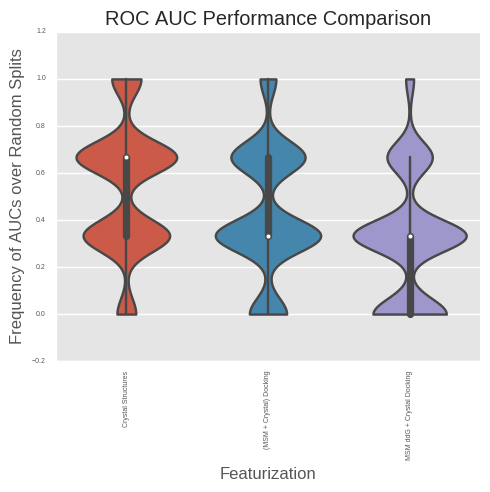

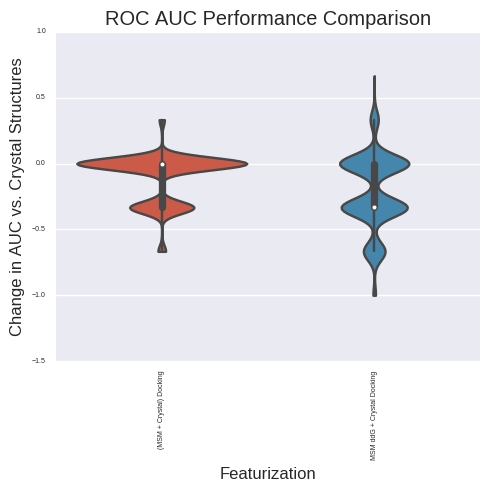

analyzing precision:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.717212          0.000000   
(MSM + Crystal) Docking      0.704250         -0.012962   
MSM ddG + Crystal Docking    0.637683         -0.079529   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.225935807277, 0.297227951877)  
MSM ddG + Crystal Docking  (0.295823031004, 0.372378418074)  


ValueError: list.remove(x): x not in list

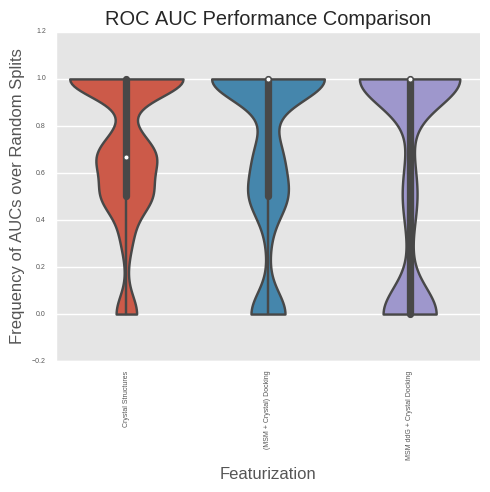

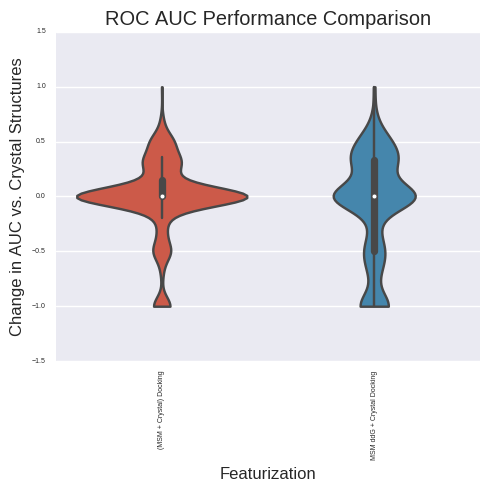

analyzing fdr:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.282788          0.000000   
(MSM + Crystal) Docking      0.295750          0.012962   
MSM ddG + Crystal Docking    0.362317          0.079529   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.162919359744, 0.227127615507)  
MSM ddG + Crystal Docking  (0.268884553664, 0.343686000649)  


ValueError: list.remove(x): x not in list

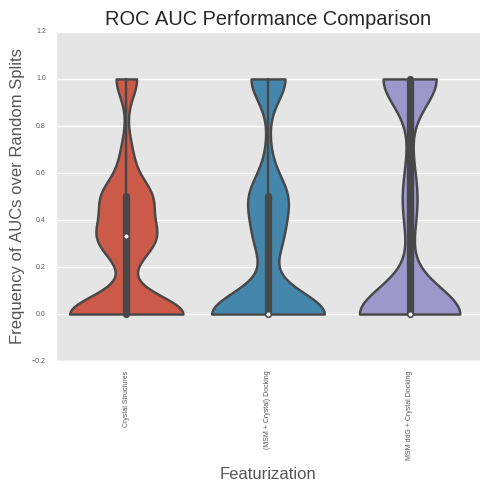

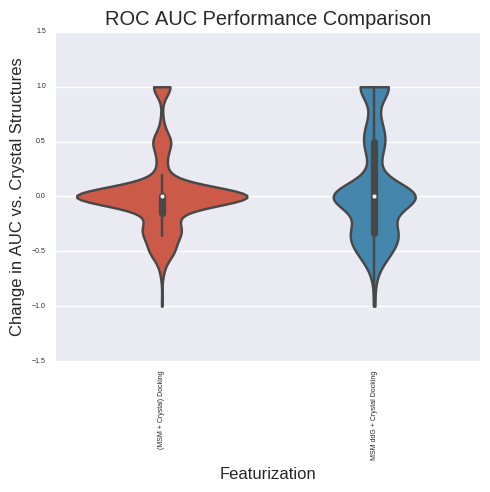

analyzing class B ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.934101          0.000000   
(MSM + Crystal) Docking      0.957589          0.023488   
MSM ddG + Crystal Docking    0.940964          0.006863   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.607219998375, 0.684842199144)  
MSM ddG + Crystal Docking  (0.452457095452, 0.533635180857)  


ValueError: list.remove(x): x not in list

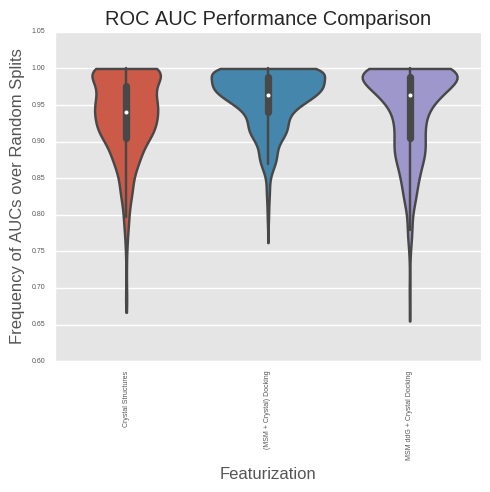

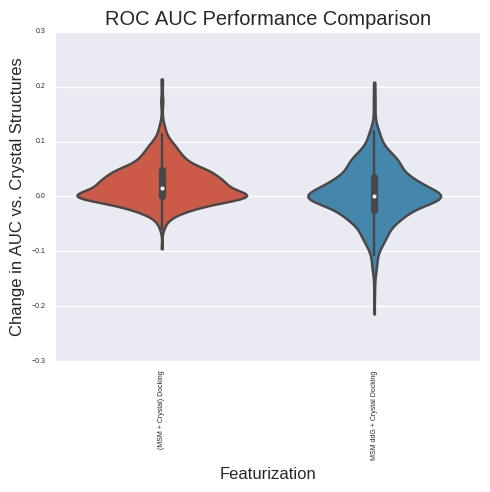

analyzing ROC AUC:
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.934101          0.000000   
(MSM + Crystal) Docking      0.957589          0.023488   
MSM ddG + Crystal Docking    0.940964          0.006863   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.596030790439, 0.674176412707)  
MSM ddG + Crystal Docking  (0.447497714579, 0.528660473378)  


ValueError: list.remove(x): x not in list

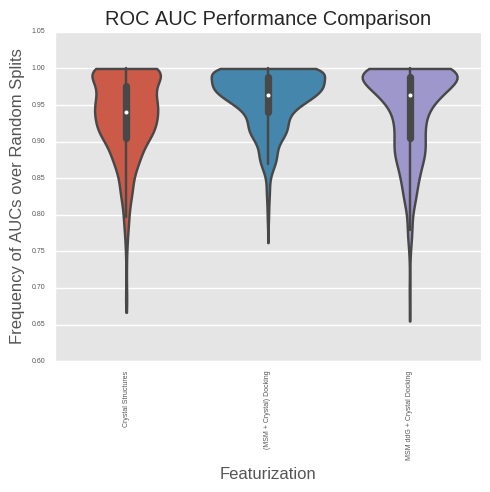

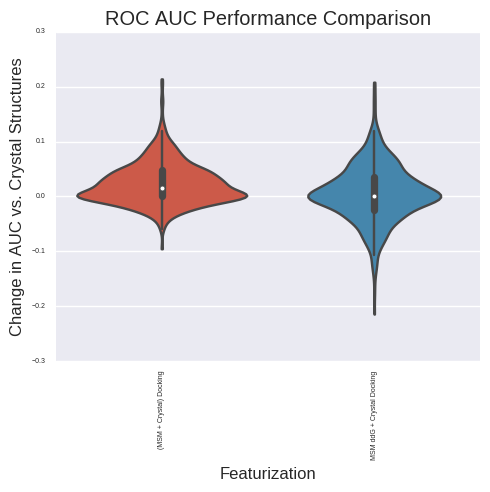

analyzing BedROC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.767765          0.000000   
(MSM + Crystal) Docking      0.797724          0.029959   
MSM ddG + Crystal Docking    0.797600          0.029835   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.521309567967, 0.601873127585)  
MSM ddG + Crystal Docking  (0.457420510147, 0.538605854513)  


ValueError: list.remove(x): x not in list

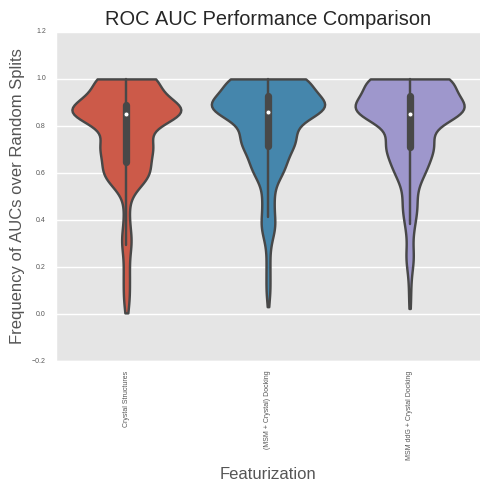

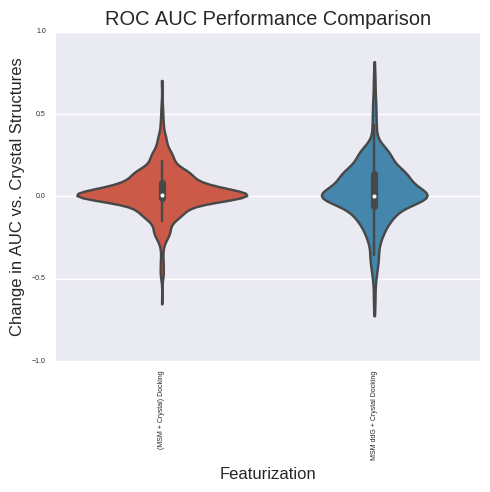

analyzing LogAUC
(1000, 3)
                           Median AUC  Median delta AUC  \
Crystal Structures           0.306437          0.000000   
(MSM + Crystal) Docking      0.336114          0.029677   
MSM ddG + Crystal Docking    0.306636          0.000199   

                                           Sign Test 99% CI  
Crystal Structures                                 (0, 0.0)  
(MSM + Crystal) Docking    (0.560572527805, 0.640096056885)  
MSM ddG + Crystal Docking  (0.422761439934, 0.503726306269)  


ValueError: list.remove(x): x not in list

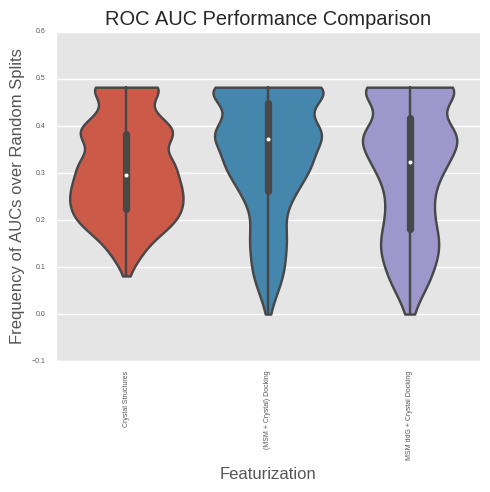

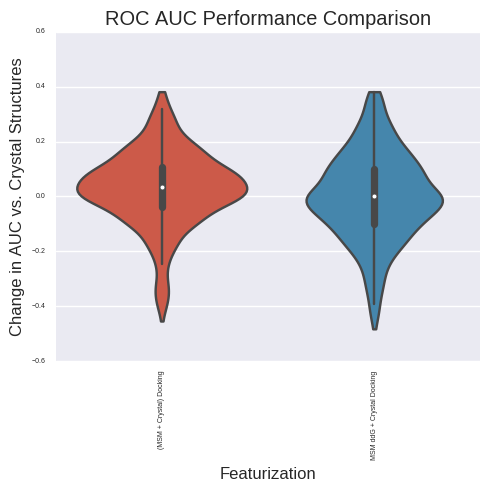

(3,)
(1, 3)


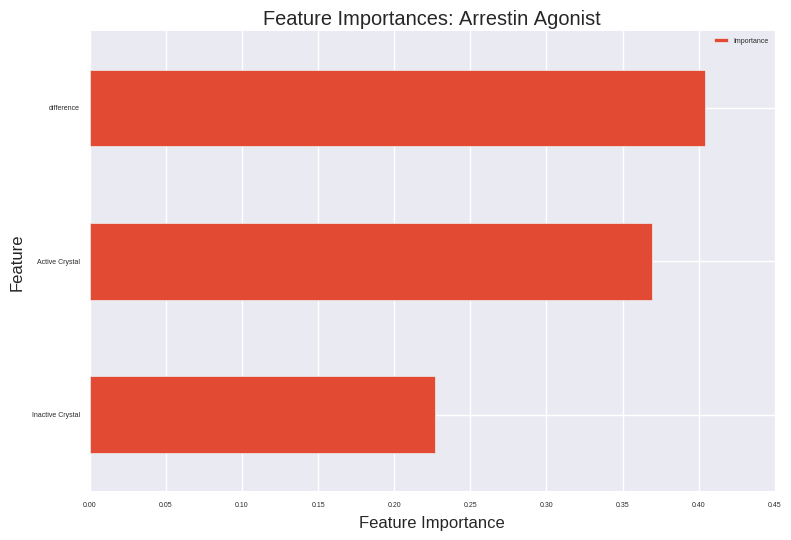

(55,)
(1, 55)


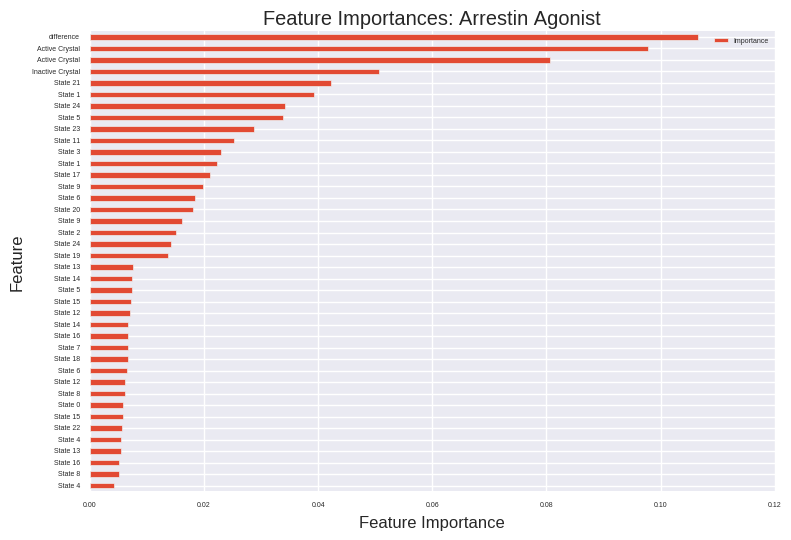

(105,)
(1, 105)


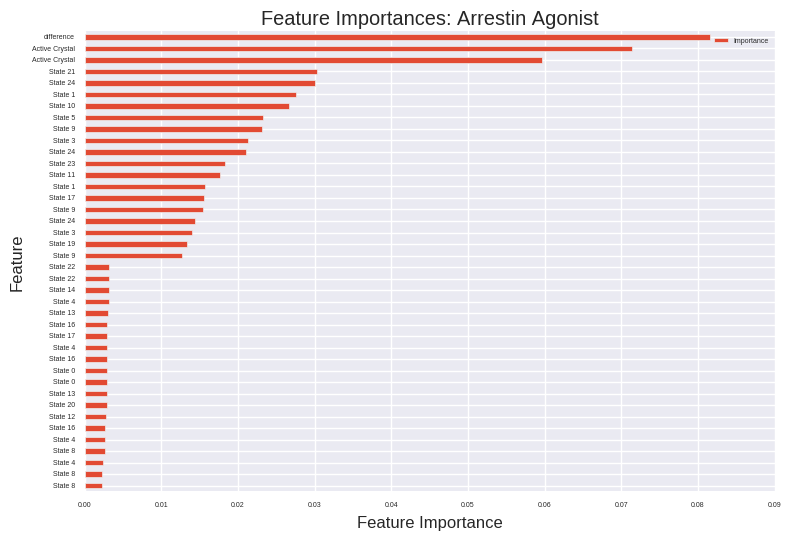

In [114]:
#SP, All ligands, Two class, 32 stereoisomers; new crystal grids; 25 clusters

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                          
                                               feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Dud", "Arrestin Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=True, fxn=np.mean)


#TRY LOOCV




In [253]:
all_ligands_dir = "/home/enf/b2ar_analysis/all_ligands"

from importlib import reload
import grids
reload(grids)
from grids import *

grid_center = "64.4, 16.9, 11.99"


#reimaged_dir = samples_dir
#mae_dir = reimaged_dir
#remove_ter(reimaged_dir)
#reorder(reimaged_dir)


#agonist_ligands = [a for a in agonist_ligands if "TA" not in a]

#pprep(mae_dir, ref = active_ref_dir, chosen_receptors = chosen_receptors, worker_pool=None, parallel=True)
#generate_grids(mae_dir, grid_center, grid_dir, remove_lig = "BIA", chosen_receptors = chosen_receptors, worker_pool=None, outer_box=25.)

precision = "XP"
htbc_dir = "/home/enf/htbc/sdfs"
lig_dir = "/home/enf/b2ar_analysis/all_ligands/32-stereoisomers_6-ring-conf"
#docking_dir = "docking_SP_32-stereoisomer_6-ring-conf"
docking_dir = "/home/enf/htbc/b2ar/docking_xp/32-stereoisomers_6-ring-conf"
grid_dir = "/home/enf/htbc/b2ar/grids"

#df = prepare_ligands(all_ligands_dir, exts = [".sdf"],
#                n_ring_conf=6, n_stereoisomers=32,
#               force_field=16, worker_pool=None,
#               parallel=True, redo=False,
#              smiles_df=None, cid_df=None,
#             binding_db=None,
#             return_df=True)

if not os.path.exists(docking_dir):
    os.makedirs(docking_dir)
if not os.path.exists(grid_dir):
    os.makedirs(grid_dir)

#chosen_ligands = df.index.values.tolist()[:2000]
chosen_ligands = [n for n in get_ligands(lig_dir) if "CID" in n[0:3]]
print(chosen_ligands)
print(len(chosen_ligands))
dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*1200*1000)
#dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*1200)


#dock_ligands_and_receptors(grid_dir, docking_dir,  biased_agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = biased_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)
#dock_ligands_and_receptors(grid_dir, docking_dir, agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = agonist_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)





['CID_10087493', 'CID_10353067', 'CID_10443654', 'CID_123686', 'CID_1237', 'CID_155774', 'CID_161394', 'CID_170373', 'CID_18026', 'CID_2083', 'CID_2119', 'CID_217246', 'CID_2249', 'CID_23843', 'CID_23844', 'CID_2405', 'CID_2585', 'CID_2687', 'CID_2755', 'CID_2783', 'CID_3343', 'CID_33572', 'CID_3609', 'CID_36811', 'CID_3682', 'CID_3779', 'CID_3869', 'CID_4086', 'CID_4382', 'CID_4546390', 'CID_4828', 'CID_4883', 'CID_4930', 'CID_4946', 'CID_5241141', 'CID_5253', 'CID_5403', 'CID_5478', 'CID_5606', 'CID_5806', 'CID_681', 'CID_7436', 'CID_838', 'CID_913', 'CID_951']
45
About to do 8 Docking computations.
Completed docking.


In [ ]:
diff_results_t100_0pt8 = do_regression_experiment(features, y_gpr-y_arr, feature_names, 100, 0.9, regularize=False, model="rfr")

In [ ]:
#import efficacy_scripts
#reload(efficacy_scripts)
#from efficacy_scripts import *


analyze_regression_experiment(diff_results_t100_0pt8, feature_names,
                                  ddg_df.columns.values, common_ligands, "Regression GProtein vs. Arrestin", analysis_dir)

In [ ]:
analysis_dir

In [ ]:
list(results_dict[save_name].keys())

In [241]:
#model = results_dict[save_name]['Crystal Structures'][0]
model = results_dict[save_name]['(MSM + Crystal) Docking'][0]
#model = results_dict[save_name]['MSM ddG + Crystal Docking'][0]


y_proba =model.predict_proba(X_df.values)
#bias_test_df = pd.DataFrame(y_proba, index=X_df.index, columns=["class A", "class B", "class C"]).sort("class B", ascending=False, inplace=False)
#test_df = pd.DataFrame(y_proba, index=X_df.index, columns=["P(Non-binder)", "P(G Protein Biased)", "P(Balanced Agonist)", "P(Antagonist)"]).sort("P(G Protein Biased)", ascending=False, inplace=False)
test_df = pd.DataFrame(y_proba, index=X_df.index, columns=["P(Non-binder)", "P(Binder)"]).sort("P(Binder)", ascending=False, inplace=False)




#y_proba =model.predict_proba(C_df.values)
#bias_test_df = pd.DataFrame(y_proba, index=C_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)

In [242]:
test_df.loc[[n for n in test_df.index.values if "ks" in n or "std" in n or "CID_3" in n and n not in model_agonists]].sort("P(Non-binder)", inplace=False)

,P(Non-binder),P(Binder)
CID_3306,0.024,0.976
CID_31728,0.037,0.963
CID_31620,0.055,0.945
CID_39859,0.060,0.940
CID_3047796,0.069,0.931
Structure2D_CID_3343,0.149,0.851
CID_3040551,0.150,0.850
CID_3762,0.249,0.751
CID_38853,0.267,0.733
CID_36976,0.298,0.702


In [231]:
test_df.loc["CID_3306"]

P(Non-binder)          0.041
P(G Protein Biased)    0.590
P(Balanced Agonist)    0.334
P(Antagonist)          0.035
Name: CID_3306, dtype: float64

In [233]:
full_docking_df.loc[[n for n in test_df.index.values if "ks" in n or "std" in n or "CID_913" in n]]

,Inactive Crystal,Active Crystal,State 0,State 10,State 11,State 12,State 13,State 14,State 15,State 16,State 17,State 18,State 19,State 1,State 20,State 21,State 22,State 23,State 24,State 2,State 3,State 4,State 5,State 6,State 7,State 8,State 9,difference
CID_913,7.23,7.35,8.25,7.61,7.48,7.25,7.30,6.23,7.65,7.16,7.08,7.21,7.14,6.60,6.94,5.78,7.36,6.38,7.02,7.97,7.62,7.27,6.63,7.43,8.48,7.95,7.77,0.12
std101d1,7.16,5.66,9.65,7.86,9.61,6.89,8.74,8.39,9.51,7.28,8.09,8.76,8.07,7.49,6.95,6.76,7.68,8.90,6.90,8.87,6.97,8.30,7.10,8.18,9.99,8.37,8.34,-1.50
std101d4,8.63,7.09,9.01,7.67,8.93,8.38,7.67,7.72,8.49,6.57,8.24,8.33,6.22,7.78,6.47,5.87,6.46,8.20,7.40,8.37,7.98,7.95,7.54,7.87,9.34,8.62,7.20,-1.54
ksn010118,8.20,7.00,9.48,7.49,7.39,8.39,9.44,7.80,7.19,7.46,7.89,10.01,7.22,8.60,6.89,8.02,8.69,7.78,7.14,7.65,7.62,9.21,8.39,9.42,8.59,9.95,8.09,-1.20
std101c4,10.05,7.86,9.37,8.47,9.11,8.19,9.35,7.71,8.77,8.41,8.19,10.90,7.61,9.10,7.26,8.90,7.44,8.82,7.55,8.96,8.38,8.96,8.04,9.65,10.15,10.23,8.66,-2.19
ksn010115,8.41,6.04,8.15,7.15,7.98,6.52,7.56,6.78,7.03,7.36,8.34,9.69,7.61,7.88,7.29,7.71,7.98,7.10,6.22,6.94,6.63,7.84,8.28,7.71,9.01,7.99,7.94,-2.37
ks01505,9.10,6.27,10.67,7.99,8.47,8.34,9.53,8.53,8.46,8.73,7.97,11.34,8.02,10.62,11.13,7.23,9.05,9.22,7.64,8.59,9.14,8.72,8.46,9.50,9.85,8.70,8.43,-2.83
ks01506,9.43,7.18,11.06,8.88,8.83,8.84,10.14,8.47,8.51,9.25,8.87,11.36,8.27,10.43,8.61,7.64,7.95,9.01,7.71,8.34,8.72,9.40,8.79,9.10,9.50,10.56,9.51,-2.25


In [234]:
X_df.loc[[n for n in test_df.index.values if "ks" in n or "std" in n or "CID_913" in n]]

,Inactive Crystal,Active Crystal,State 0,State 10,State 11,State 12,State 13,State 14,State 15,State 16,State 17,State 18,State 19,State 1,State 20,State 21,State 22,State 23,State 24,State 2,State 3,State 4,State 5,State 6,State 7,State 8,State 9,difference,Inactive Crystal,Active Crystal,State 0,State 10,State 11,State 12,State 13,State 14,State 15,State 16,State 17,State 18,State 19,State 1,State 20,State 21,State 22,State 23,State 24,State 2,State 3,State 4,State 5,State 6,State 7,State 8,State 9
CID_913,7.23,7.35,8.25,7.61,7.48,7.25,7.30,6.23,7.65,7.16,7.08,7.21,7.14,6.60,6.94,5.78,7.36,6.38,7.02,7.97,7.62,7.27,6.63,7.43,8.48,7.95,7.77,0.12,-0.058727,0.145870,1.680352,0.589165,0.367518,-0.024627,0.060622,-1.763707,0.657364,-0.178076,-0.314474,-0.092827,-0.212175,-1.132864,-0.553171,-2.530948,0.162920,-1.507960,-0.416773,1.202958,0.606215,0.009472,-1.081715,0.282269,2.072498,1.168858,0.861962
std101d1,7.16,5.66,9.65,7.86,9.61,6.89,8.74,8.39,9.51,7.28,8.09,8.76,8.07,7.49,6.95,6.76,7.68,8.90,6.90,8.87,6.97,8.30,7.10,8.18,9.99,8.37,8.34,-1.50,-0.829986,-2.282014,1.580380,-0.152373,1.541659,-1.091351,0.699483,0.360677,1.444858,-0.713824,0.070271,0.718843,0.050911,-0.510540,-1.033270,-1.217194,-0.326617,0.854366,-1.081671,0.825326,-1.013910,0.273555,-0.888068,0.157393,1.909506,0.341316,0.312276
std101d4,8.63,7.09,9.01,7.67,8.93,8.38,7.67,7.72,8.49,6.57,8.24,8.33,6.22,7.78,6.47,5.87,6.46,8.20,7.40,8.37,7.98,7.95,7.54,7.87,9.34,8.62,7.20,-1.54,0.972760,-0.785057,1.406507,-0.123022,1.315192,0.687400,-0.123022,-0.065950,0.812958,-1.378605,0.527599,0.630328,-1.778109,0.002537,-1.492749,-2.177612,-1.504163,0.481941,-0.431210,0.675986,0.230824,0.196581,-0.271409,0.105266,1.783182,0.961345,-0.659498
ksn010118,8.20,7.00,9.48,7.49,7.39,8.39,9.44,7.80,7.19,7.46,7.89,10.01,7.22,8.60,6.89,8.02,8.69,7.78,7.14,7.65,7.62,9.21,8.39,9.42,8.59,9.95,8.09,-1.20,0.016516,-1.321245,1.443461,-0.774993,-0.886473,0.228328,1.398868,-0.429405,-1.109433,-0.808437,-0.329073,2.034305,-1.075989,0.462436,-1.443873,-0.184149,0.562768,-0.451701,-1.165173,-0.596625,-0.630069,1.142464,0.228328,1.376572,0.451288,1.967417,-0.106113
std101c4,10.05,7.86,9.37,8.47,9.11,8.19,9.35,7.71,8.77,8.41,8.19,10.90,7.61,9.10,7.26,8.90,7.44,8.82,7.55,8.96,8.38,8.96,8.04,9.65,10.15,10.23,8.66,-2.19,1.433624,-0.970522,0.687131,-0.300874,0.401707,-0.608253,0.665175,-1.135189,0.028461,-0.366741,-0.608253,2.366740,-1.244968,0.390730,-1.629192,0.171173,-1.431591,0.083350,-1.310835,0.237040,-0.399674,0.237040,-0.772921,0.994510,1.543402,1.631225,-0.092295
ksn010115,8.41,6.04,8.15,7.15,7.98,6.52,7.56,6.78,7.03,7.36,8.34,9.69,7.61,7.88,7.29,7.71,7.98,7.10,6.22,6.94,6.63,7.84,8.28,7.71,9.01,7.99,7.94,-2.37,1.008085,-1.933427,0.685388,-0.555757,0.474393,-1.337678,-0.046888,-1.014980,-0.704694,-0.295117,0.921205,2.596750,0.015170,0.350279,-0.381997,0.139284,0.474393,-0.617814,-1.710021,-0.816397,-1.201152,0.300633,0.846736,0.139284,1.752772,0.486804,0.424747
ks01505,9.10,6.27,10.67,7.99,8.47,8.34,9.53,8.53,8.46,8.73,7.97,11.34,8.02,10.62,11.13,7.23,9.05,9.22,7.64,8.59,9.14,8.72,8.46,9.50,9.85,8.70,8.43,-2.83,0.197774,-2.320872,1.595044,-0.790105,-0.362914,-0.478612,0.580465,-0.309516,-0.371814,-0.131519,-0.807905,2.191331,-0.763406,1.550545,2.004435,-1.466491,0.153274,0.304571,-1.101599,-0.256117,0.233373,-0.140419,-0.371814,0.553766,0.865259,-0.158219,-0.398514
ks01506,9.43,7.18,11.06,8.88,8.83,8.84,10.14,8.47,8.51,9.25,8.87,11.36,8.27,10.43,8.61,7.64,7.95,9.01,7.71,8.34,8.72,9.40,8.79,9.10,9.50,10.56,9.51,-2.25,0.385170,-1.897665,2.038956,-0.172857,-0.223586,-0.213440,1.105531,-0.588840,-0.548256,0.202543,-0.183003,2.343334,-0.791758,1.399763,-0.446797,-1.430952,-1.116428,-0.040959,-1.359930,-0.720737,-0.335191,0.354732,-0.264170,0.050354,0.456191,1.531660,0.466337


In [ ]:
#model = results_dict[save_name]['Crystal Structures'][0]
#model = results_dict[save_name]['(MSM + Crystal) Docking'][0]
gpr_0pt6_model = results_dict['gprot-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]
arr_0pt6_model = results_dict['arr-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]

gpr_0pt3_model = results_dict['gprot-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]
arr_0pt3_model = results_dict['arr-cutoff0pt6_rfr_trials1_split0.8']['MSM ddG + Crystal Docking'][0]

gpr_0pt6_proba = gpr_0pt6_model.predict_proba(ddg_df.values)
arr_0pt6_proba = arr_0pt6_model.predict_proba(ddg_df.values)

gpr_0pt3_proba = gpr_0pt3_model.predict_proba(ddg_df.values)
arr_0pt3_proba = arr_0pt3_model.predict_proba(ddg_df.values)

mm = preprocessing.MinMaxScaler()

balanced_prob = gpr_0pt6_proba[:,1] * arr_0pt6_proba[:,1]
gprot_biased_prob = gpr_0pt6_proba[:,1] * arr_0pt3_proba[:,0]
arr_biased_prob = gpr_0pt3_proba[:,0] * arr_0pt6_proba[:,1]

balanced_df = pd.DataFrame(balanced_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)
arr_biased_df = pd.DataFrame(arr_biased_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)
gprot_biased_df = pd.DataFrame(gprot_biased_prob, index=ddg_df.index, columns=["class B"]).sort("class B", ascending=False, inplace=False)

In [50]:
list(results_dict.keys())

['a_vs_g-all-0.3_rfr_trials1000_split0.8_normalizeFalse_normalize-axis0True_n-estimators1000_precisionSP',
 'a_vs_g-all-0.3_rfr_trials1_split0.8_normalizeFalse_normalize-axis0True_n-estimators1000_precisionSP']

In [345]:
#p_bias_df = pd.DataFrame(gprot_test_df["class B"].multiply(arr_test_df.loc[gprot_test_df.index]["class A"]), index=gprot_test_df.index, columns=["p_gprot_biased"]).sort("p_gprot_biased", inplace=False, ascending=False)
p_bias_df = bias_test_df.iloc[:1000]
p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" != n[0]]]

,class A,class B,class C
CID_2083,0.051,0.937,0.012
CID_171674,0.057,0.907,0.036
CID_5403,0.081,0.904,0.015
CID_23843,0.097,0.894,0.009
CID_2755,0.061,0.891,0.048
CID_217246,0.055,0.888,0.057
CID_5702273,0.046,0.888,0.066
CID_2783,0.046,0.888,0.066
CID_23844,0.107,0.884,0.009
CID_10353067,0.084,0.870,0.046


In [346]:
p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if n not in common_ligands]]

,class A,class B,class C
CID_171674,0.057,0.907,0.036
CID_5702273,0.046,0.888,0.066
CID_68658,0.077,0.860,0.063
CID_657301,0.119,0.860,0.021
CID_9884233,0.083,0.857,0.060
CID_39859,0.083,0.857,0.060
CID_4845,0.071,0.821,0.108
CID_73416654,0.135,0.816,0.049
CID_73416983,0.118,0.806,0.076
CID_65324,0.082,0.805,0.113


In [348]:
import pubchempy as pcp
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

def convert_ligand_to_name(name):
    print(name)
    try:
        if "CID" in name:
            cid = name.split("_")[1]
            comp = pcp.get_compounds(cid, namespace="cid")[0].synonyms[0]
            return ((comp, cid))
        else:
            smiles, name, pc_smiles, pc_names, cid = convert_sdf_to_compound("/home/enf/htbc/sdfs/%s.sdf" %name)
            return ((name, cid))
    except:
        return(("", ""))

def convert_ligands_to_names(pd_names, parallel=False, worker_pool=None):
    name_cids = function_mapper(convert_ligand_to_name, worker_pool, parallel, pd_names)
    print(name_cids)
    names = [t[0] for t in name_cids]
    cids = [t[1] for t in name_cids]
    return((names, cids))
    
names, cids = convert_ligands_to_names(p_bias_df.index.values.tolist(), parallel=True)


CID_2083
CID_441334
CID_9820882
b2ar_dude_inactive-7
CID_4086
CID_73417104
b2ar_dude_inactive-30
CID_23844
CID_164739
CID_33572
CID_53477580
CID_325003
CID_73416960
CID_56801
CID_11504295
CID_31728
CID_4117
CID_170373
CID_5152
CID_76969219
CID_10353067
b2ar_dude_inactive-93
CID_441333
CID_102484
CID_171674
CID_6438331
CID_5458580
CID_31620
CID_11962616
CID_73416949
CID_6917801
CID_9859211
CID_4845
CID_10443654
CID_24835641
CID_3306
CID_5403
b2ar_dude_inactive-79
b2ar_dude_inactive-72
CID_5606
CID_9796663
CID_656677
CID_656601
CID_73416654
CID_76963246
CID_10087493
CID_71700183
CID_73416870
CID_9871212
CID_164652
CID_23843
CID_5702285
CID_9992825
CID_8239
CID_4916
CID_6603122
CID_73416983
CID_68658
CID_1978
CID_688561
CID_36283
CID_26258
CID_2755
CID_18538
CID_65340
CID_3995
CID_65324
CID_76972192
CID_9861452
CID_9294
CID_657301
CID_9890216
CID_688570
CID_36976
CID_217246
b2ar_dude_inactive-80
CID_3034756
CID_73416798
CID_36811
CID_37989
CID_681
CID_9884233
CID_6335907
CID_73416743
CID_

In [350]:
compound_names_df = pd.DataFrame(list(zip(names, cids)), index=p_bias_df.index, columns=["name", "cid"])

In [65]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
smiles_list, compound_names, pc_smiles, pc_names = convert_sdfs_to_compounds(["/home/enf/htbc/sdfs/%s.sdf" %f for f in p_bias_df.index.values], parallel=True, worker_pool=dview)
smiles_list = [s.strip() for s in smiles_list]
pc_smiles = [s.strip() for s in pc_smiles]
compound_names_df = pd.DataFrame(list(zip(smiles_list, compound_names, pc_smiles, pc_names)), index=p_bias_df.index, columns=["smiles", "pubchem_name", "pubchem_smiles", "alternate_name"])
#for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:100]:
#    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
#        a = str(mol)
#        break
#    c = get_compounds(a, namespace='smiles')
    #print(c[0].synonyms)

Getting SMILES from SDFs...
Done. Now getting compound names from SMILES...
Done. returning compound names.


In [ ]:
import pybel as pb
save_file = "%s/top_gprot_biased_scl.sdf" %analysis_dir
save_dir = "%s/top_gprot_biased_scl" %analysis_dir
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
filewriter = pb.Outputfile("sdf", save_file, overwrite=True)
for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:20]:
    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
        print(mol)
        filewriter.write(mol)
        subprocess.call("cp /home/enf/htbc/sdfs/%s.sdf %s/%s.sdf" %(lig, save_dir, lig), shell=True)
filewriter.close()

In [351]:
p_bias_df = pd.concat([p_bias_df, compound_names_df.loc[p_bias_df.index]], axis=1)# [["pubchem_name", "smiles", "pubchem_smiles", "alternate_name"]]
bret_pred_df = p_bias_df.loc[[n for n in p_bias_df.index.values if n in common_ligands]]
bret_pred_df["label"] = 0.
#bret_pred_df["label"].loc[common_ligands] = y
from rdkit.ML.Scoring.Scoring import CalcAUC
CalcAUC(bret_pred_df.values[:,(0,1,2)], col=1)#, alpha=10)

0.0

In [352]:
bret_pred_df

,class A,class B,class C,name,cid,label
CID_2083,0.051,0.937,0.012,Salbutamol,2083,0.0
CID_5403,0.081,0.904,0.015,terbutaline,5403,0.0
CID_23843,0.097,0.894,0.009,Deterenol,23843,0.0
CID_2755,0.061,0.891,0.048,cimaterol,2755,0.0
CID_217246,0.055,0.888,0.057,Clenproperol,217246,0.0
CID_2783,0.046,0.888,0.066,clenbuterol,2783,0.0
CID_23844,0.107,0.884,0.009,CHEMBL1159887,23844,0.0
CID_10353067,0.084,0.870,0.046,CHEMBL1159719,10353067,0.0
CID_10443654,0.075,0.865,0.060,CHEMBL321468,10443654,0.0
CID_10087493,0.113,0.863,0.024,CHEMBL1159710,10087493,0.0


In [62]:
test_df= p_bias_df.loc[[n for n in p_bias_df.index.values if n not in common_ligands]].sort("class B", ascending=False,inplace=False)

In [97]:
print(bret.loc[y_df.loc[y_df["class"] == 1.].index].PaperName.tolist(), end="")

['AH 3021', 'Albuterol (Salbutamol)', 'C78 (Tulobuterol)', 'Cimeterol', 'Clenbuterol', 'Dobutamine', 'Dopamine', 'Du 21117', 'Du 28663', 'Isopropylnorsynephrine', 'MAPE [2-(methylamino)-1-\nphenylethanol]\nhalostachine', 'NAB 277 (clenproperol)', 'Orciprenaline (alupent)', 'Ritodrine', 'Sulfonterol', 'Terbutaline', 'Tertbutylnorsynephrine']

In [63]:
print(calc_expected_positives(0.69, 0.11, 0.02, 10))
print(calc_expected_positives(0.67, 0.1, 0.02, 10))

NameError: name 'calc_expected_positives' is not defined

enf@vsp-compute.stanford.edu:/home/enf/b2ar_analysis/sparse-tICA_t5_n_components2all_residues_2rh1_3sn6_under_cutoff6A_regularization_wolf_autoShrinkage_rho0pt01/analysis_n_clusters25_random/exp_pos.pdf


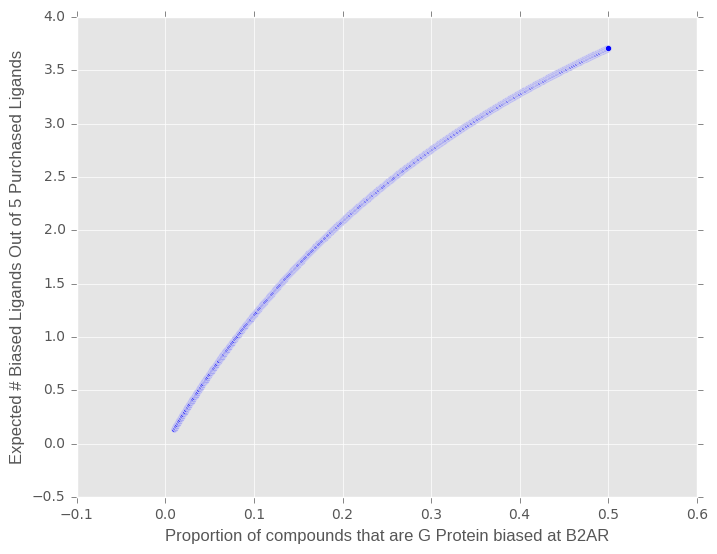

In [207]:
def calc_expected_positives(recall, fdr, rho, n_test):
    return(n_test*(recall * rho) / (recall * rho + fdr * (1.-rho)))
exp_pos = []
rhos = np.linspace(0.01,0.5,1000,1)
for rho in rhos:
    exp_pos.append(calc_expected_positives(0.92, .32, rho, 5))
plt.scatter(rhos, exp_pos)
plt.xlabel("Proportion of compounds that are G Protein biased at B2AR")
plt.ylabel("Expected # Biased Ligands Out of 5 Purchased Ligands")
plt.savefig("%s/exp_pos.pdf" %analysis_dir)
print("enf@vsp-compute.stanford.edu:%s" %("%s/exp_pos.pdf" %analysis_dir))

In [ ]:
def calc_biased(recall_e, fdr, rho_a, rho_b, n_test):
    return(n_test*(recall * rho) / (recall * rho + fdr * (1.-rho)))

In [ ]:
import pubchempy as pcp
c = pcp.get_compounds("CC(NC([C@@H](c1ccc(cc1)O)O)C)COc1ccccc1", "smiles")[0]

In [ ]:
c.canonical_smiles

In [353]:
p_bias_df.loc[[n for n in p_bias_df.index.values if n not in common_ligands]].sort("class B", ascending=False,inplace=False).iloc[:1000]

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,class A,class B,class C,name,cid
CID_171674,0.057,0.907,0.036,Pirbuterol acetate,171674
CID_5702273,0.046,0.888,0.066,Clenbuterol hydrochloride,5702273
CID_68658,0.077,0.860,0.063,Exirel,68658
CID_657301,0.119,0.860,0.021,Terbutaline sulfate,657301
CID_9884233,0.083,0.857,0.060,Salbutamol sulfate,9884233
CID_39859,0.083,0.857,0.060,ALBUTEROL SULFATE,39859
CID_4845,0.071,0.821,0.108,PIRBUTEROL,4845
CID_73416654,0.135,0.816,0.049,,
CID_73416983,0.118,0.806,0.076,XTZ6AXU7KN,73416983
CID_65324,0.082,0.805,0.113,Dobutamine hydrochloride,65324


In [ ]:
from importlib import reload
import grids
reload(grids)
from grids import *

grid_center = "64.4, 16.9, 11.99"


#reimaged_dir = samples_dir
#mae_dir = reimaged_dir
#remove_ter(reimaged_dir)
#reorder(reimaged_dir)


#agonist_ligands = [a for a in agonist_ligands if "TA" not in a]

#pprep(mae_dir, ref = active_ref_dir, chosen_receptors = chosen_receptors, worker_pool=None, parallel=True)
#generate_grids(mae_dir, grid_center, grid_dir, remove_lig = "BIA", chosen_receptors = chosen_receptors, worker_pool=None, outer_box=25.)

precision = "XP"
htbc_dir = "/home/enf/htbc/sdfs/32_stereoisomers"
docking_dir = "/home/enf/htbc/b2ar/docking_xp/32-stereoisomers_6-ring-conf"
grid_dir = "/home/enf/htbc/b2ar/grids"

#df = prepare_ligands(htbc_dir, exts = [".sdf"],
#                n_ring_conf=6, n_stereoisomers=32,
#               force_field=16, worker_pool=dview,
#               parallel=None, redo=False,
#              smiles_df=None, cid_df=None,
#             binding_db=None,
#             return_df=True)

if not os.path.exists(docking_dir):
    os.makedirs(docking_dir)
if not os.path.exists(grid_dir):
    os.makedirs(grid_dir)

chosen_ligands = p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False).index.values[:100]

lig_dir = htbc_dir
dock_ligands_and_receptors(grid_dir, docking_dir, lig_dir, precision = precision, ext = "-out.maegz", chosen_ligands=chosen_ligands, chosen_receptors = None, parallel = False, grid_ext = ".zip", worker_pool=dview, retry_after_failed=True, timeout=60*60*24)

#dock_ligands_and_receptors(grid_dir, docking_dir,  biased_agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = biased_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)
#dock_ligands_and_receptors(grid_dir, docking_dir, agonist_dir, precision = precision, ext = "-out.maegz", chosen_ligands = agonist_ligands, chosen_receptors = chosen_receptors, parallel = None, grid_ext = ".grd", worker_pool=dview)






About to do 2700 Docking computations.


In [215]:
chosen_ligands

array(['_113986', '_70638', '_122949', '_114015', '_120259', '_120889',
       '_21903', '_120748', '_34068', '_120116', '_112272', '_84867',
       '_58367', '_113955', '_120850', '_931', '_49767', '_74752',
       '_33987', '_5427', '_124773', '_124756', '_1730', '_11472',
       '_14450', '_52461', '_76853', '_12432', '_22849', '_64812',
       '_134045', '_134043', '_121007', '_18608', '_20037', '_122857',
       '_24493', '_35479', '_62911', '_25480', '_97162', '_29311',
       '_104314', '_113737', '_22315', '_119929', '_26403', '_85720',
       '_63114', '_133151', '_48348', '_24452', '_24583', '_120027',
       '_45621', '_84989', '_38003', '_10441', '_28469', '_122576',
       '_91417', '_11753', '_75835', '_121937', '_76094', '_71827',
       '_3443', '_48706', '_66002', '_19332', '_45085', '_34692', '_16631',
       '_18210', '_97170', '_47990', '_63684', '_130104', '_86957',
       '_79500', '_8882', '_119879', '_131852', '_98783', '_123796',
       '_134024', '_119803', '_

Exception in thread Thread-922:
Traceback (most recent call last):
  File "/home/enf/anaconda3/lib/python3.5/threading.py", line 914, in _bootstrap_inner
    self.run()
  File "/home/enf/anaconda3/lib/python3.5/threading.py", line 862, in run
    self._target(*self._args, **self._kwargs)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 366, in _handle_workers
    pool._maintain_pool()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 240, in _maintain_pool
    self._repopulate_pool()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/pool.py", line 233, in _repopulate_pool
    w.start()
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/process.py", line 105, in start
    self._popen = self._Popen(self)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/context.py", line 267, in _Popen
    return Popen(process_obj)
  File "/home/enf/anaconda3/lib/python3.5/multiprocessing/popen_fork.py", line 20, in __init__
    self._

In [ ]:
len(dview)

p_bias_df.loc[[n for n in p_bias_df.index.values if "_" == n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False)

In [ ]:
from pubchempy import get_compounds
c = get_compounds(a, namespace='smiles')

In [ ]:
c[0].synonyms

In [ ]:
bias_test_df#.loc["3p0g_lig"]#.loc[bias_test_df.index.str.contains("pentyl")]

In [ ]:
[n for n in gprot_test_df.loc[[n for n in gprot_test_df.index.values if n[0] == n[0]]].index.values[:100] if n in arr_test_df.loc[[n for n in arr_test_df.index.values if n[0] == n[0]]].index.values[:100]]  



In [ ]:
sorted([n.lower() for n in common_ligands])



In [ ]:
top_clusters

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

print(np.median(a_vs_g_results_t100_single0pt2_split0pt8_logistic_cv["test_roc_aucs"], axis=0))

all_feature_names = [null_features.columns.values.tolist(), ddg_scaled.index.values.tolist() + null_features.columns.values.tolist(), all_features_df.columns.values.tolist()]
analyze_multiclass_experiment(a_vs_g_results_t100_single0pt2_split0pt8_logistic_cv, 
                              ["Crystal Structures", "MSM Docking", "MSM Docking and DEER"],
                              all_feature_names, common_agonists, analysis_dir,
                              ["Balanced vs. G Protein Biased Agonists", "Balanced vs. G Protein Biased Agonists"], X_scaled, 
                              exp_title="Arrestin vs. G Protein Two Class", coef_name="Logistic Coefficient")



In [ ]:
y.shape

In [ ]:
plt.hist(lig_continuous_features["3p0g_lig"]['Asn148_Arg333_closest_dist'], bins=100)

In [ ]:
analysis_dir = "%s_%dsamples" %(analysis_dir, n_samples)
print(analysis_dir)

In [ ]:
if not os.path.exists(analysis_dir):
    os.makedirs(analysis_dir)

In [ ]:
n_trials = 1000

y = multi_binarizer(y_gpr, [0.33, 0.66])
gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.33, 0.66])
arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
    
    
y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))   

y = multi_binarizer(y_gpr, [0.5])
gprot_results_t1000_single0pt5_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt5_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt5_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.5])
arr_results_t1000_single0pt5_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt5_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt5_split0pt6_logistic_2f, f)
    
print(np.median(np.array(gprot_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))

    
y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt2_split0pt6_logistic_2f, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt6_logistic_2f = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt2_split0pt6_logistic_2f, f)

print(np.median(np.array(gprot_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))

        
gprot_results_t1000_0pt8_ridge = do_regression_experiment(features, y_gpr, feature_names, n_trials, .8, regularize=False, model="RidgeCV")
with open("%s/gprot_results_t1000_0pt8_ridge.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_0pt8_ridge, f)

arr_results_t1000_0pt8_ridge = do_regression_experiment(features, y_arr, feature_names, n_trials, .8, regularize=False, model="RidgeCV")
with open("%s/arr_results_t1000_0pt8_ridge.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_0pt8_ridge, f)

print(np.median(np.array(gprot_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print(np.median(np.array(arr_results_t1000_0pt8_ridge["test_r2s"]), axis=0))





In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 1000

y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)


y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)



In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 100
y = multi_binarizer(y_arr, [0.2, 0.8])
arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False, model="logistic_cv")

arr_splits_0pt2_0pt8_model_logistic_cv_regularized = arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict[feature_names[1]][1]
save_file = "%s/arr_splits_0pt2_0pt8_model_logistic_cv_regularized.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_splits_0pt2_0pt8_model_logistic_cv_regularized, f, protocol=2)


In [ ]:
np.median(arr_splits_0pt2_0pt8_model_logistic_cv_regularized_dict["test_roc_aucs"], axis=0)

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

n_trials = 1000
y = multi_binarizer(y_arr, [0.2, 0.8])
save_file = "%s/arr_splits_0pt2_0pt8_model_logistic_cv_deer_trials%d.pkl" %(analysis_dir, n_trials)


arr_splits_0pt2_0pt8_model_logistic_cv_deer = generate_or_load_model(features, y, feature_names, n_trials, 0.8, False, "logistic_cv", save_file, redo=True)

In [ ]:
n_trials = 1000
y = multi_binarizer(y_gpr, [0.2, 0.8])
save_file = "%s/gpr_splits_0pt2_0pt8_model_logistic_cv_deer_trials%d.pkl" %(analysis_dir, n_trials)


gpr_splits_0pt2_0pt8_model_logistic_cv_deer = generate_or_load_model(features, y, feature_names, n_trials, 0.8, False, "logistic_cv", save_file, redo=True)

In [ ]:
print("hi")

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
all_feature_names = [null_features.columns.values.tolist(), ddg_scaled.index.values.tolist() + null_features.columns.values.tolist(), all_features_df.columns.values.tolist()]
analyze_multiclass_experiment(gpr_splits_0pt2_0pt8_model_logistic_cv_deer, ["Crystal Structures", "MSM Docking", "MSM Docking with DEER"], all_feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Partial Agonists", "G Protein Full Agonists"], X_scaled, exp_title="G Protein Three Class", coef_name="Logistic Coefficient")



In [ ]:
analyze_multiclass_experiment(arr_splits_0pt2_0pt8_model_logistic_cv_deer, ["Crystal Structures", "MSM Docking", "MSM Docking with DEER"], all_feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Partial Agonists", "Arrestin Full Agonists"], X_scaled, exp_title="Arrestin Three Class", coef_name="Logistic Coefficient")



In [ ]:
np.median(gpr_splits_0pt2_0pt8_model_logistic_cv_deer["test_roc_aucs"], axis=0)

In [ ]:
np.median(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"], axis=0)

In [ ]:
arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,0]

In [ ]:
from scipy.stats import rankdata
plt.scatter(rankdata(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,1]), y)

In [ ]:
plt.scatter(arr_results_t10_multi0pt2_split0pt8_logistic_cv_2f_obs[feature_names[1]][0].predict_proba(features[1])[:,2], y)
plt.show()

In [ ]:
np.median(np.array(a_vs_g_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"]), axis=0)


In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0]

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt9_logistic_cv_2f_obs, 
                              ["Crystal Structures", "MSM Docking"],
                              top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, analysis_dir,
                              ["GProtein Antagonists", "GProtein Agonists"], X_scaled, 
                              exp_title="GProtein Class", coef_name="Logistic Coefficient")


In [ ]:
all_features_df.columns.shape

In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0][2].shape

In [ ]:
all_features_df.columns.values.tolist()

In [ ]:
print(np.median(np.array(gprot_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print(np.median(np.array(arr_results_t1000_0pt8_ridge["test_r2s"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt33_0pt66_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt5_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print("/n")

print(np.median(np.array(gprot_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))
print(np.median(np.array(arr_results_t1000_single0pt2_split0pt6_logistic_2f["test_roc_aucs"]), axis=0))





In [ ]:
import plots
reload(plots)
from plots import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *


feature_names = top_clusters.tolist() +  ["Inactive Crystal", "Active Crystal", "Crystal Difference"] 
feature_names = [s.replace("cluster", "MSM State ") for s in feature_names]
print(feature_names)

#with open("%s/gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
#    gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = pickle.load(f)
#analyze_multiclass_experiment(gprot_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Partial Agonists", "G Protein Full Agonists"], X_scaled, exp_title="GProtein Three Clas 1000 Trials", coef_name="Logistic Coefficient")


#with open("%s/arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
#    arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f = pickle.load(f)
#analyze_multiclass_experiment(arr_results_t1000_multi0pt2_0pt8_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Partial Agonists", "Arrestin Full Agonists"], X_scaled, exp_title="Arrestin Three Class 1000 Trials", coef_name="Logistic Coefficient")

#plt.clf()
#analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"], feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Agonists"], X_scaled, exp_title="Two Class", coef_name="Logistic Coefficient")
with open("%s/arr_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
    arr_results_t1000_single0pt2_split0pt6_logistic_2f = pickle.load(f)
analyze_multiclass_experiment(arr_results_t1000_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"],feature_names, common_agonists, analysis_dir, ["Arrestin Antagonists", "Arrestin Agonists"], X_scaled, exp_title="Arrestin Two Class", coef_name="Logistic Coefficient")

with open("%s/gprot_results_t1000_single0pt2_split0pt6_logistic_2f.pkl" %analysis_dir, "rb") as f:
    gprot_results_t1000_single0pt2_split0pt6_logistic_2f = pickle.load(f)
analyze_multiclass_experiment(gprot_results_t1000_single0pt2_split0pt6_logistic_2f, ["Crystal Structures", "MSM Docking"],feature_names, common_agonists, analysis_dir, ["G Protein Antagonists", "G Protein Agonists"], X_scaled, exp_title="G Protein Two Class", coef_name="Logistic Coefficient")



In [ ]:
analysis_dir

In [ ]:
X_scaled[:,25]

In [ ]:
ddg_scaled["salbutamol"].sort(inplace=False
                             )

In [ ]:
arr_results_t100_multi_0pt6_logistic = arr_results_t100_multi_0pt_6_rfr 

= arr_results_t1000_multi_0pt_6_rfr 

In [ ]:
save_file = "%s/arr_results_t1000_multi_0pt6_logistic.pkl" %(analysis_dir)
with open(save_file, "wb") as f:
    pickle.dump(arr_results_t1000_multi_0pt6_logistic, f)
    

In [ ]:
save_file = "%s/gprot_results_t1000_multi_0pt6_logistic.pkl" %(analysis_dir)
with open(save_file, "wb") as f:
    pickle.dump(gprot_results_t1000_multi_0pt6_logistic, f)
    

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["test_r2s"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["kendall_pvalues"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_0pt5_md3_ridge["kendall_pvalues"]), axis=0)

In [ ]:
np.median(np.array(arr_results_t1000_multi_0pt6_logistic["test_roc_aucs"]), axis=0)


In [ ]:
plt.hist(y_gpr, bins=50)
plt.show()

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

#common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
#y_ori = y_arr - y_gpr
#y_ori = y_arr
y = multi_binarizer(y_arr, [0.33, 0.66])
#y = binarize(y_gpr, threshold=0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled, X_diff]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_results_t100_0pt9_md3 = do_regression_experiment(features, y, feature_names, n_trials, 0.9, regularize=False)

In [ ]:
save_file = "%s/arr_results_t1000_0pt9_md3.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_results_t1000_0pt9_md3, f)

In [ ]:
print(np.median(np.array(arr_results_t1000_0pt9_md3["test_r2s"]), axis=0))

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
#common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
y_ori = y_arr - y_gpr
#y_ori = y_arr
#y = y_arr
y = binarize(y_ori, threshold=-0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
#arr_classification_results_t1000_0pt6 = do_classification_experiment(features, y, feature_names, n_trials, 0.6, regularize=False)
arr_vs_gprot_classification_results_t1000_0pt8 = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_results_1000 = do_regression_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)

In [ ]:
with open("%s/arr_vs_gprot_classification_results_t100_0pt8.pkl" %analysis_dir, "wb") as f:
    pickle.dump(arr_vs_gprot_classification_results_t100_0pt8, f)

In [ ]:
print(np.median(np.array(arr_vs_gprot_classification_results_t100_0pt8["test_aucs"]), axis=0))

In [ ]:
plt.hist(y_ori,bins=50)
plt.show()

In [ ]:

save_file = "%s/arr_classification_results_t1000_0pt6.pkl" %analysis_dir
with open(save_file, "wb") as f:
    pickle.dump(arr_classification_results_t1000_0pt6, f)

In [ ]:
np.median(np.array(arr_classification_results_t1000_0pt6["test_log_aucs"]),axis=0)

In [ ]:
from sklearn.preprocessing import binarize
#arrestin_antagonists = ["s-carvedilol", "nebivolol"]
#non_arrestin_antagonists = [n for n in antagonists if n not in arrestin_antagonists and n not in ["Carvedilol"]]
#y = np.array([1. for i in arrestin_antagonists] + [0. for i in non_arrestin_antagonists]).reshape((-1,1))


total_activity = bret["B2AR-Arrestin, Mean"].loc[common_ligands].add(bret["B2AR-Gprotein, Mean"].loc[common_ligands])
#common_agonists = arrestin_antagonists + non_arrestin_antagonists
#biased_ligands = ["ethylnorepinephrine", "isoetharine", "N-Cyclopentylbutanephrine"]
#non_biased_ligands =  ["r_isopreterenol", "r_epinephrine", "norepinephrine", "zinterol", "orciprenaline", "epinine", "terbutaline", "fenoterol", "procaterol", "formoterol", "salbutamol", "salmeterol"]
#y = np.array([1. for i in biased_ligands] + [0. for i in non_biased_ligands]).reshape((-1,1))
#common_agonists = biased_ligands + non_biased_ligands

#common_agonists = total_activity.loc[total_activity > 0.2].index.values
#y_ori = bret["B2AR-Arrestin, Mean"].loc[common_agonists].subtract(bret["B2AR-Gprotein, Mean"].loc[common_agonists]).values.reshape((-1,1))

top_clusters = delta_delta_g.index.values
#top_clusters = list(set(delta_delta_g.sort("nebivolol").index.values[:10].tolist() + delta_delta_g.sort("3p0g_lig").index.values[:10].tolist()))
#top_clusters = list(set(delta_delta_g.sort("N-Cyclopentylbutanephrine", inplace=False).index.values[:4].tolist() + delta_delta_g.sort("procaterol", inplace=False).index.values[:4].tolist()))
#agonists_df = [a for a in agonists if a in delta_delta_g.columns.values]
#common_agonists = agonists_df + antagonists
#y = np.array([1. for i in agonists_df] + [0. for i in antagonists]).reshape((-1,1))
common_agonists = common_ligands
y_arr = bret["B2AR-Arrestin, Mean"].loc[common_agonists].values.reshape((-1,1))
y_gpr = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
#y_ori = y_arr - y_gpr
y_ori = y_arr
#y = y_arr
y = binarize(y_arr, threshold=0.2)

C = null_features.loc[common_agonists].values
#X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X = np.hstack([delta_delta_g.loc[top_clusters][common_agonists].values.T, C])
#X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
X_scaled = np.hstack([ddg_scaled.loc[top_clusters][common_agonists].values.T, C])
#D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T
D_scaled = np.hstack([docking_normalized.loc[top_clusters][common_agonists].values.T, C])
X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
    for j in range(i+1,X.shape[1]):
        X_diff[:,k] = X[:,i] - X[:,j]
        k+=1
X_diff = np.hstack([X_scaled, X_diff, C])

features = [C, D_scaled, X, X_scaled, X_diff]
features_y = [C, D_scaled, X, X_scaled]
feature_names = ["Crystal Structures", "Normalized Docking", "Docking ddG", "Docking ddg Scaled", "Docking ddG Differences"]

n_trials = 1000
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)
#arr_auc_results = do_regression_experiment(features, y, feature_names, n_trials, 0.8, regularize=False)

In [ ]:
np.median(np.array(test_log_aucs),axis=0)

In [ ]:
np.median(np.array(gprot_results["test_r2s"]),axis=0)

In [ ]:
gprot_results["test_r2s"]

In [ ]:
features_y = copy.deepcopy(features)
features_y.append(y)
train_test_arrays = train_test_split(*features_y, train_size=0.8)
print([a.shape for a in train_test_arrays])

In [ ]:
train_test_arrays = train_test_split(*features_y, train_size=0.8)
print([a.shape for a in train_test_arrays])

In [ ]:
gprot_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
#import pickle
gprot_file = "%s/gprot_results_0pt2_XP_no-regularization.pkl"
with open("%s/gprot_results_0pt2_XP_no-regularization.pkl", "wb") as f:
    pickle.dump(gprot_results, f)
with open(gprot_file) as f:
    test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = pickle.load(f)

In [ ]:
#arrestin_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
#import pickle
arrestin_file = "%s/arrestin_results_0pt2_XP_no-regularization.pkl"
#with open("%s/arrestin_results_0pt2_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(arrestin_results, f)
with open(arrestin_file) as f:
    test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = pickle.load(f)

In [ ]:
#arrestin_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
arrestin_rfr_file = "%s/arrestin_results_rfr_XP_no-regularization.pkl"
#with open("%s/arrestin_results_rfr_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(arrestin_rfr_results, f)
with open(arrestin_rfr_file) as f:
    test_r2s, rfr_feature_importances = pickle.load(f)

In [ ]:
#gprot_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
gprot_rfr_file = "%s/gprot_results_rfr_XP_no-regularization.pkl"
#with open("%s/gprot_results_rfr_XP_no-regularization.pkl", "wb") as f:
#    pickle.dump(gprot_rfr_results, f)
with open(gprot_rfr_file) as f:
    test_r2s, rfr_feature_importances = pickle.load(f)

In [ ]:
test_aucs = np.array(test_aucs)
plt.clf()
plt.boxplot(test_aucs[:,2]-test_aucs[:,0])
plt.show()

In [ ]:
test_log_aucs = np.array(test_log_aucs)
np.percentile(test_aucs[:,2]-test_aucs[:,0], 50)

In [ ]:
import sklearn
null_preds = binarize(C[:,2])
sklearn.metrics.roc_auc_score(binarize(y, 0.2).ravel(), null_preds.ravel())

In [ ]:
test_aucs = np.array(test_aucs)
print(np.median(test_aucs, axis=0))
print(np.median(test_aucs[:,2] - test_aucs[:,0]))

In [ ]:
n_successes = len(np.where(test_aucs[:,2]-test_aucs[:,0] > 0.)[0])
nobs = test_aucs.shape[0]
statsmodels.stats.proportion.proportion_confint(count=n_successes, nobs=nobs, alpha=0.01, method='wilson')


In [ ]:
np.median(np.array(test_r2s),axis=0)

In [ ]:
arrestin_vs_gprot_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])
import pickle
with open("%s/arrestin_vs_gprot_results_-0pt2_XP.pkl", "wb") as f:
    pickle.dump(arrestin_vs_gprot_results, f)

In [ ]:
arrestin_vs_gprot_rfr_results = copy.deepcopy([test_r2s, rfr_feature_importances])
import pickle
with open("%s/arrestin_vs_gprot_rfr_results_XP.pkl", "wb") as f:
    pickle.dump(arrestin_vs_gprot_rfr_results, f)

In [ ]:
test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances = arrestin_vs_gprot_results

In [ ]:
#gprotein_results = copy.deepcopy([test_accuracies, test_aucs, test_log_aucs, C_test_aucs, C_test_log_aucs, feature_importances])

In [ ]:
results_dict = gprot_results_t1000_multi_0pt6_logistic
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
importances_df, results_df = analyze_classification_experiment(results_dict["test_roc_aucs"],
                                               results_dict["feature_importances"],
                                               feature_names,
                                               X_scaled, y, pd.concat([ddg_scaled, null_features.transpose()], axis=0),
                                               top_clusters.tolist() + null_features.columns.values.tolist(), 
                                               common_agonists, 
                                                "Predicting G Protein Three Class, 1000 trials, 60:40 Split, XP", analysis_dir)

In [ ]:
feature_names

In [ ]:
importances_df, results_df = analyze_experiment(test_aucs, test_log_aucs, feature_importances, feature_names,
                        X_scaled, y, pd.concat([ddg_scaled, null_features.transpose()], axis=0) , top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, "Predicting Arrestin, w Crystal Features, 0.2, SP", analysis_dir)

In [ ]:
importances_df, results_df = analyze_regression_experiment(test_r2s, rfr_feature_importances, feature_names,
                        X, y, pd.concat([delta_delta_g, null_features.transpose()], axis=0) , top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, "Predicting Arrestin, RFR, w Crystal Features, SP", analysis_dir)

In [ ]:
def get_top_measurable_features(samples_normalized_features_avg_df, cluster_name):
    import re
    top_features_cluster = []
    #top_features_cluster = samples_normalized_features_avg_df.loc["cluster_name"].loc[samples_normalized_features_avg_df.loc["cluster_name"].abs() > .75].index.values
    #print(top_features_cluster)
    #print(len(top_features_cluster))
    [top_features_cluster.append(pair) for pair in samples_normalized_features_avg_df.loc[cluster_name].abs().sort(inplace=False, ascending=False).index.values[:10]]
    all_features = []
    features = []
    for f in top_features_cluster:
        fs = f.split(",")
        for i in range(0, len(fs)):
            res = int(re.findall(r'\d+', fs[i])[0])
            all_features.append(res)
            if "TRP" in fs[i] or "CYS" in fs[i] or "TYR" in fs[i] or "LYS" in fs[i]:
                features.append(res)
            
    top_features_cluster = sorted(list(set(features)))
    #print(sorted(list(set([int(re.findall(r'\d+', r)[0]) for r in all_features]))))
    #print(top_features_cluster)
    return top_features_cluster, all_features
a, b = get_top_measurable_features(samples_normalized_features_averages_df, 6)

In [ ]:
print(b)

In [ ]:
ddg_scaled[["norepinephrine", "r_epinephrine", "ethylnorepinephrine", "nebivolol", "s-carvedilol", "s-carazolol"]]

In [ ]:
print(np.mean(test_aucs, axis=0))
print(np.median(test_aucs, axis=0))
print(np.mean(test_log_aucs, axis=0))
print(np.median(test_log_aucs, axis=0))



In [ ]:
plt.scatter(ddg_scaled.loc["cluster2"][common_agonists], y)

In [ ]:
y_ori = bret["B2AR-Gprotein, Mean"].loc[common_agonists].values.reshape((-1,1))
y = binarize(y_ori, threshold=0.05)

X = delta_delta_g.loc[top_clusters][common_agonists].values.T
X_scaled = ddg_scaled.loc[top_clusters][common_agonists].values.T
C = null_features.loc[common_agonists].values
D_scaled = docking_normalized.loc[top_clusters][common_agonists].values.T

X_train = D_scaled
y_train = y
f = np.zeros(X_train.shape[1])

rfr = RandomForestClassifier(n_estimators=1000, max_features='sqrt', n_jobs=-1, oob_score=True)
rfr.fit(X_train, y_train)

#top_indices = np.argsort(rfr.feature_importances_*-1.)[:min(20, X_train.shape[1])]
#rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', n_jobs=-1, oob_score=True)
#X_train = X_train[:, top_indices]
#rfr.fit(X_train, y_train)
#f[top_indices] = rfr.feature_importances_
#y_pred = rfr.predict(X_train)
#y_score = rfr.predict_proba(X_train)
top_indices=range(0,100)

In [ ]:
top_indices

In [ ]:
X_scaled.shape

In [ ]:
#G Protein, Agonist Results
test_drugs = secret_compounds + ["nebivolol", "s-carvedilol", "xamoterol", "3p0g_lig", "isoetharine", "ethylnorepinephrine", "N-Cyclopentylbutanephrine", "ta-2005", "procaterol"]
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
print(X_test)
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#G Protein, Full Agonist Results
test_drugs = secret_compounds + ["nebivolol", "s-carvedilol", "xamoterol", "3p0g_lig", "isoetharine", "ethylnorepinephrine", "N-Cyclopentylbutanephrine"]
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
common_agonists = total_activity.loc[total_activity > 0.2].index.values
plt.scatter(docking_normalized.loc["cluster21"][common_agonists], bret["B2AR-Gprotein, Mean"].subtract(bret["B2AR-Arrestin, Mean"])[common_agonists])

In [ ]:
len(common_ligands)

In [ ]:
#ARRESTIN, Partial Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
#ARRESTIN, Full Agonist Results
X_test = docking_normalized.transpose().loc[test_drugs].values[:, top_indices]
X_test.shape
pd.DataFrame(rfr.predict_proba(X_test), index=test_drugs, columns=["P(Antagonist", "P(Agonist)"])

In [ ]:
top_indices

In [ ]:
ddg_scaled.transpose().loc[secret_compounds]

In [ ]:
plot_clustermap(docking_normalized[secret_compounds].iloc[top_indices].transpose(), save_file="%s/mehrdad_clustermap.pdf" %(save_dir), method='average', z_score=None)



In [ ]:
np.median(test_aucs, axis=0)

In [ ]:
plt.scatter(ddg_scaled.loc["cluster11"][common_agonists], y)



In [ ]:
arrestin_top = [16, 80, 43, 21, 84, 38, 44, 6, 13, 99]
gprot_top = [44, 6, 83, 4, 76, 99, 62, 92, 39, 80]

arrestin_only = sorted(list(set(arrestin_top).difference(set(gprot_top))))
print(arrestin_only)
gprot_only = sorted(list(set(gprot_top).difference(set(arrestin_top))))
print(gprot_only)
both = sorted(list(set(arrestin_top).intersection(set(gprot_top))))
print(both)


In [ ]:
samples_pnas_tica.loc[importances_df.index.values.tolist()[:5]]

In [ ]:
importances_df

In [ ]:
importances_df = make_importances_df(normalized_docking_importances, top_clusters)
importances_df


In [ ]:
from sklearn.preprocessing import binarize
X = ddg_scaled[common_ligands].values.T
y = bret["B2AR-Gprotein, Mean"].loc[common_ligands].values.reshape((-1,1))
y = binarize(y, threshold=0.5)
print(np.shape(y))
from sklearn.svm import l1_min_c
from sklearn import linear_model

#cs = l1_min_c(X, y, loss='log') * np.logspace(0, 3)
cs = np.logspace(-3., 20.)
print("Computing regularization path ...")
clf = linear_model.LogisticRegression(C=1.0, penalty='l2', tol=1e-6)
coefs_ = []
for c in cs:
    clf.set_params(C=c)
    clf.fit(X, y)
    coefs_.append(clf.coef_.ravel().copy())

coefs_ = pd.DataFrame(np.array(coefs_), columns=ddg_scaled.index.values, index=np.log10(cs))
#coefs_[list(set(inactive_clusters.tolist()).intersection(set(importances_df.iloc[10:20].index.values.tolist())))].plot()
coefs_[importances_df.index.values[:5]].plot()
#plt.plot(np.log10(cs), coefs_)
#ymin, ymax = plt.ylim()
###plt.xlabel('log(C)')
#plt.ylabel('Coefficients')
##plt.title('Logistic Regression Path')
#plt.axis('tight')
#plt.show()

In [ ]:
samples_pnas_tica.loc[importances_df.index.values[:10]]

In [ ]:
plt.scatter(deltas_tica.loc[importances_df.index.values[:10]]["tIC.6"], coefs_[importances_df.index.values[:10]].values[49])

In [ ]:
plot_clustermap(ddg_scaled[common_agonists.tolist()].loc[importances_df.index.values.tolist()[:5]].transpose(), save_file="%s/msm_n-clusters%d_lag-time%d_tICs%d.pdf" %(tica_dir, n_clusters, msm_lag_time, n_components), method='average')



In [ ]:
samples_pnas_tica.loc[samples_pnas_tica["tm6_tm3_dist"] < 18.0].loc[importances_df.iloc[0:5].index].dropna()

In [ ]:
ddg_scaled["nebivolol"].subtract(ddg_scaled["s-carazolol"]).sort(inplace=False).iloc[:10]

In [ ]:
ddg_scaled["s-carvedilol"].subtract(ddg_scaled["s-carazolol"]).sort(inplace=False).iloc[:10]

In [ ]:
samples_pnas_tica.loc[["cluster74", "cluster69", "cluster13", "cluster12", "cluster66"]]

In [ ]:
import plots
reload(plots)
from plots import *
#plot_importances_barh(importances_df.values, importances_df.index.values, "MSM State Importance in Arrestin Prediction", "Feature Importance", "MSM State", "%s/arrestin_0pt5_classification_rfr.pdf" %(tica_dir), n_features=50)
importances_df.iloc[0:25].plot(kind='barh')
plt.xlabel("Feature Importance")
plt.ylabel("MSM State")
plt.title("Importance of MSM States in Predicting Arrestin Activity")
plt.savefig("%s/msm_%dstates_arrestin_0pt2_agonists_only_classification_rfr.pdf" %(tica_dir, n_clusters))
#plt.clf()


In [ ]:
X = docking_normalized[common_agonists].values.T
y = bret["B2AR-Arrestin, Mean"].subtract(bret["B2AR-Gprotein, Mean"]).loc[common_agonists].values.reshape((-1,1))
y = binarize(y, threshold=-0.2)
print(y)
from sklearn import linear_model

cs = np.logspace(-3., 200.)
clf = linear_model.LogisticRegression(C=1.0, penalty='l2', tol=1e-6)
coefs_ = []
for c in cs:
    clf.set_params(C=c)
    clf.fit(X, y)
    coefs_.append(clf.coef_.ravel().copy())

coefs_ = pd.DataFrame(np.array(coefs_), columns=ddg_scaled.index.values, index=np.log10(cs))
coefs_[importances_df.iloc[0:10].loc[samples_pnas_tica["tm6_tm3_dist"] < 9.].index].plot()
plt.xlabel("Log Regularization Parameter")
plt.ylabel("Coefficient for Arrestin Activity")
plt.title("Logistic Regression Coefficient in Predicting Arrestin Activity")
plt.savefig("%s/msm_%dstates_arrestin_0pt2_agonists_only_classification_logistic.pdf" %(tica_dir, n_clusters))
#plt.clf()

In [ ]:
np.shape(coefs_)

In [ ]:
print(np.median(np.nan_to_num(test_aucs)))
print(np.median(np.nan_to_num(C_test_aucs)))
print(np.median(np.nan_to_num(test_log_aucs)))
print(np.median(np.nan_to_num(C_test_log_aucs)))

In [ ]:
lr = LinearRegression()
states = importances_df.index.values.tolist()
model = lr.fit(X, y_ori)
pd.DataFrame(model.coef_.T, index=delta_delta_g.index, columns=["importance"]).loc[states]#.sort("importance", inplace=False)

In [ ]:
model.coef_.shape

In [ ]:
import seaborn
reload(seaborn)
import seaborn as sns
plt.style.use('ggplot')
plt.figure(figsize=(5, 5))
sns.set_style("darkgrid")
g = (auc_df
    .pipe((sns.boxplot, 'data'), orient='v', showfliers=True))
g.set_xticklabels(auc_df.columns.values, rotation=90)
sns.despine()
plt.title("AUC for Arrestin Prediction")
plt.ylabel("Frequency AUCs over Random Splits")
plt.xlabel("Featurization")
plt.show()
plt.savefig("%s/auc_arrestin_prediction_all_ligands_0pt2_cutoff.pdf" %tica_dir)

In [ ]:
corr_matrix = compute_pearson_matrix(delta_delta_g[common_agonists].values.T, y)
corr_df = pd.DataFrame(model.coef_.T, index=delta_delta_g.index.values, columns=["Correlation"]).sort("Correlation",inplace=False)
#corr_df.loc[["cluster80", "cluster16", "cluster43", "cluster44"]].plot(kind='barh')
corr_df.loc[importances_df.index.values[:20]].sort("Correlation", inplace=False).plot(kind='barh')#, figsize=(5,20))
plt.xlabel("Pearsson Correlation with Arrestin Activity")
plt.ylabel("MSM State")
plt.title("Correlation of MSM States with Arrestin Activity")


In [ ]:
samples_pnas_tica.loc[corr_df.loc[importances_df.index.values[:20]].sort("Correlation", inplace=False).index.values]

In [ ]:
df = copy.deepcopy(aggregate_docking_msm)
df[df.columns.values] = scale(df.values)
plt.scatter(df[common_ligands].loc["cluster13"].values, bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.T)

In [ ]:
bret

In [ ]:
import sklearn
reload(sklearn)
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import binarize
from sklearn import cross_validation

test_accuracies = []
test_aucs = []
test_log_aucs = []
C_test_aucs = []
C_test_log_aucs = []
n_trials = 100
feature_importances = []

for j in range(0,n_trials):
    print(j)

    X = delta_delta_g[common_ligands].values.T
    C = null_features.loc[common_ligands].values
    y = bret["B2AR-Arrestin, Mean"].loc[common_ligands].values.reshape((-1,1))
    y = binarize(y, threshold=0.5)

    X_train, X_test, y_train, y_test, C_train, C_test = sklearn.cross_validation.train_test_split(X, y, C, train_size=0.8, stratify=y)
    
    sc = StandardScaler()
    sc.fit(X_train)
    X_train = sc.transform(X_train)
    X_test = sc.transform(X_test)

    sc = StandardScaler()
    sc.fit(C_train)
    C_train = sc.transform(C_train)
    C_test = sc.transform(C_test)
 
    rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=2, n_jobs=-1, oob_score=True)
    rfr.fit(X_train, y_train)
    feature_importances.append(rfr.feature_importances_)
    y_pred = rfr.predict(X_test)
    test_accuracies.append(np.sqrt(np.mean(np.square(y_test-y_pred.reshape((-1,1))))))
    y_score = rfr.predict_proba(X_test)
    auc, logauc = compute_auc(y_test, y_score)
    test_aucs.append(auc)
    test_log_aucs.append(logauc)
    
    rfr = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=2, n_jobs=-1, oob_score=True)
    rfr.fit(C_train, y_train)
    C_y_pred = rfr.predict(C_test)
    y_score = rfr.predict_proba(C_test)
    auc, logauc = compute_auc(y_test, y_score)
    C_test_aucs.append(auc)
    C_test_log_aucs.append(logauc)

    
    

    

In [ ]:
import seaborn
reload(seaborn)
import seaborn as sns
auc_df = pd.DataFrame(np.vstack([test_aucs, C_test_aucs]).T, columns=["MSM States", "Crystal Structures"])

plt.style.use('ggplot')
plt.figure(figsize=(5, 5))
sns.set_style("darkgrid")
g = (auc_df
    .pipe((sns.boxplot, 'data'), orient='v', showfliers=True))
#g.set_xticklabels(experiments.columns.values, rotation=90)
sns.despine()
plt.title("AUC for G Protein Prediction")
plt.ylabel("Frequency AUCs over Random Splits")
plt.xlabel("Featurization")
plt.show()
plt.savefig("%s/msm_n-states%d_auc_gprot_prediction_cutoff0pt5.pdf" %(tica_dir, n_clusters))

In [ ]:
importances_df = make_importances_df(feature_importances, delta_delta_g.index.values.tolist())
importances_df



In [ ]:
import sklearn
from sklearn.linear_model import LinearRegression, Lasso
model = Lasso(alpha=0.0001)                                
model.fit(ddg_scaled[common_agonists].values.T, bret.loc[common_agonists]["B2AR-Arrestin, Mean"].subtract(bret.loc[common_agonists]["B2AR-Gprotein, Mean"].values))
pd.DataFrame(model.coef_, index=ddg_scaled.index, columns=["importance"]).sort("importance", inplace=False)

In [ ]:
print(np.median(np.nan_to_num(test_aucs)))
print(np.median(np.nan_to_num(C_test_aucs)))
print(np.median(np.nan_to_num(test_log_aucs)))
print(np.median(np.nan_to_num(C_test_log_aucs)))

In [ ]:
import plots
reload(plots)
from plots import *
#plot_importances_barh(importances_df.values, importances_df.index.values, "MSM State Importance in Arrestin Prediction", "Feature Importance", "MSM State", "%s/arrestin_0pt5_classification_rfr.pdf" %(tica_dir), n_features=50)
importances_df.iloc[0:25].plot(kind='barh')
plt.xlabel("Feature Importance")
plt.ylabel("MSM State")
plt.title("Importance of MSM States in Predicting G Protein Activity")
#plt.savefig("%s/msm_%dstates_gprot_0pt5_classification_rfr.pdf" %(tica_dir, n_clusters))
#plt.clf()



In [ ]:
corr_matrix = compute_pearson_matrix(ddg_scaled[common_ligands].values.T, y)
corr_df = pd.DataFrame(model.coef_, index=ddg_scaled.index.values, columns=["Correlation"])
corr_df.loc[importances_df.index.values[:10]].sort("Correlation", inplace=False).plot(kind='barh')
plt.xlabel("Pearsson Correlation with G Protein Activity")
plt.ylabel("MSM State")
plt.title("Correlation of MSM States with G Protein Activity")
#plt.savefig("%s/msm_%dstates_gprot_0pt5_classification_correlations.pdf" %(tica_dir, n_clusters))
#plt.clf()




In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)